In [339]:
import os
import anndata as ad
import scipy as sp
import pickle
import pandas as pd
import igraph as ig
import seaborn as sb
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

In [340]:
data = os.path.abspath(os.path.join(os.getcwd(),"../data"))

input = os.path.join(data, "input")
output = os.path.join(data, "output")

core_P = os.path.join(output, "core_P")
plots = os.path.join(output, "plots")
tables = os.path.join(output, "tables")

In [341]:
with open(os.path.join(core_P, "patient_disease_map_core.pickle"), "rb") as f:
    patient_disease_map = pickle.load(f) 

with open(os.path.join(core_P, "patient_disease_map_core_reduced.pickle"), "rb") as f:
    patient_disease_map_reduced = pickle.load(f) 

with open(os.path.join(core_P, "disease_patient_map_core.pickle"), "rb") as f:
    disease_patient_map = pickle.load(f) 

with open(os.path.join(core_P, "disease_patient_map_core_reduced.pickle"), "rb") as f:
    disease_patient_map_reduced = pickle.load(f) 

In [342]:
# Read Shared Data 
with open(os.path.join(core_P, "num_patients.pickle"), "rb") as f:
    id_to_num_patients = pickle.load(f)

with open(os.path.join(core_P, "patient_disease_map_core.pickle"), "rb") as f:
    patient_disease_map = pickle.load(f) 

with open(os.path.join(core_P, "patient_disease_map_core_reduced.pickle"), "rb") as f:
    patient_disease_map_reduced = pickle.load(f) 

with open(os.path.join(core_P, "disease_patient_map_core.pickle"), "rb") as f:
    disease_patient_map = pickle.load(f) 

with open(os.path.join(core_P, "disease_patient_map_core_reduced.pickle"), "rb") as f:
    disease_patient_map_reduced = pickle.load(f) 

with open(os.path.join(core_P, "id_to_name.pickle"), "rb") as f:
    id_to_name = pickle.load(f)

with open(os.path.join(core_P, "name_to_id.pickle"), "rb") as f:
    name_to_id = pickle.load(f) 

with open(os.path.join(core_P, "id_to_pb.pickle"), "rb") as f:
    id_to_pb = pickle.load(f) 

with open(os.path.join(core_P, "id_to_5NN.pickle"), "rb") as f:
    id_to_5NN = pickle.load(f) 

with open(os.path.join(core_P, "id_to_graph_per_node_5.pickle"), "rb") as f:
    id_to_graph_per_node_5 = pickle.load(f) 


In [343]:
"""graphs_to_explore = ["G365",
                    "G364",
                    "G341", "G343", "G348", "G351",
                    "G363", "G360", "G358", "G355",
                    "G0", "G5", "G8", "G11",
                    "G12", "G50", "G85", "G102", "G200", "G300"]"""

graphs_to_explore = list(id_to_name.keys())

In [344]:
id_to_5NN = {id:g.as_undirected() for id, g in id_to_5NN.items()}
id_to_graph_per_node_5 = {id:g.as_undirected() for id, g in id_to_graph_per_node_5.items()}

## Overview

In [345]:
diseases = list(disease_patient_map.keys())
disease_groups = list(disease_patient_map_reduced.keys())

community_algs = ["edge_betweenness", "eigen_vector", "leiden" ]

In [346]:
overview_df = {}
index = ["name",
          "mean degree", 
          "min degree", 
          "max degree", 
          "density", 
          "num vertices", 
          "average path length", 
          "nc edge_betweenness", 
          "nc eigen_vector", 
          "nc leiden", 
          "edge nc pure d", 
          "edge nc 90 d",
          "edge nc 80 d",
          "edge nc 70 d",
          "eigen nc pure d", 
          "eigen nc 90 d",
          "eigen nc 80 d",
          "eigen nc 70 d",
          "leiden nc pure d", 
          "leiden nc 90 d",
          "leiden nc 80 d",
          "leiden nc 70 d",
         "edge nc pure dg", 
          "edge nc 90 dg",
          "edge nc 80 dg",
          "edge nc 70 dg",
          "eigen nc pure dg", 
          "eigen nc 90 dg",
          "eigen nc 80 dg",
          "eigen nc 70 dg",
          "leiden nc pure dg", 
          "leiden nc 90 dg",
          "leiden nc 80 dg",
          "leiden nc 70 dg"]


# general graph info
for g in graphs_to_explore:
    overview_df["5NN_" + g] = []
    overview_df["5NN_" + g].append(id_to_name[g])
    overview_df["5NN_" + g].append(np.mean(id_to_5NN[g].degree()))
    overview_df["5NN_" + g].append(np.min(id_to_5NN[g].degree()))
    overview_df["5NN_" + g].append(np.max(id_to_5NN[g].degree()))
    overview_df["5NN_" + g].append(id_to_5NN[g].density())
    overview_df["5NN_" + g].append(id_to_5NN[g].vcount())
    overview_df["5NN_" + g].append(id_to_5NN[g].average_path_length())

    overview_df["corr_" + g] = []
    overview_df["corr_" + g].append(id_to_name[g])
    overview_df["corr_" + g].append(np.mean(id_to_graph_per_node_5[g].degree()))
    overview_df["corr_" + g].append(np.min(id_to_graph_per_node_5[g].degree()))
    overview_df["corr_" + g].append(np.max(id_to_graph_per_node_5[g].degree()))
    overview_df["corr_" + g].append(id_to_graph_per_node_5[g].density())
    overview_df["corr_" + g].append(id_to_graph_per_node_5[g].vcount())
    overview_df["corr_" + g].append(id_to_graph_per_node_5[g].average_path_length())

## iGraph Visualization

In [347]:
palette = ig.RainbowPalette(n=7)
disease_color_map = {diseases[i]:palette[i] for i in range(7)}
palette = ig.RainbowPalette(n=3)
disease_group_color_map = {disease_groups[i]:palette[i] for i in range(3)}

In [355]:
def visualized_d(ax, graph):
    vertex_colors = []
    edge_colors = []

    for v in graph.vs:
        vertex_colors.append(disease_color_map[v["disease"]])

    for e in graph.es:
        s_d = graph.vs[e.source]["disease"]
        t_d = graph.vs[e.target]["disease"]
        if s_d == t_d:
            edge_colors.append(disease_color_map[s_d])
        else:
            edge_colors.append("#000000")

    ig.plot(
        graph,
        vertex_color = vertex_colors ,
        edge_color = edge_colors ,
        edge_width=1,
        target=ax,
        vertex_size=0.3,
    )

In [356]:
def visualized_dg(ax, graph):
    vertex_colors = []
    edge_colors = []
    
    for v in graph.vs:
        vertex_colors.append(disease_group_color_map[v["disease_group"]])
    
    for e in graph.es:
        s_d = graph.vs[e.source]["disease_group"]
        t_d = graph.vs[e.target]["disease_group"]
        if s_d == t_d:
            edge_colors.append(disease_group_color_map[s_d])
        else:
            edge_colors.append("#000000")

    ig.plot(
        graph,
        vertex_color = vertex_colors ,
        edge_color = edge_colors ,
        edge_width=1,
        target=ax,
        vertex_size=0.3,
    )

In [357]:
palette = ig.RainbowPalette(n=15)

def visualized_com(communities, ax, alg, graph):
    if  alg == "edge_betweenness" :
        communities = communities.as_clustering()
        
    num_communities = len(communities)
    
    for i, community in enumerate(communities):
        graph.vs[community]["com_" + alg] = i
        community_edges = graph.es.select(_within=community)
        community_edges["color"] = i
    
    ig.plot(
        communities,
        palette=palette,
        edge_width=1,
        target=ax,
        vertex_size=0.3,
    )

    # Create a custom color legend
    legend_handles = []
    for i in range(num_communities):
        handle = ax.scatter(
            [], [],
            s=100,
            facecolor=palette.get(i),
            edgecolor="k",
            label=i,
        )
        legend_handles.append(handle)
        
    ax.legend(
        handles=legend_handles,
        title='Community:',
        bbox_to_anchor=(0, 1.0),
        bbox_transform=ax.transAxes,
    )
    return num_communities

In [351]:
g_5NN_summary = {}
g_corr_summary = {}

### 5NN and corr color by disease

IndexError: index 5 is out of bounds for axis 0 with size 5

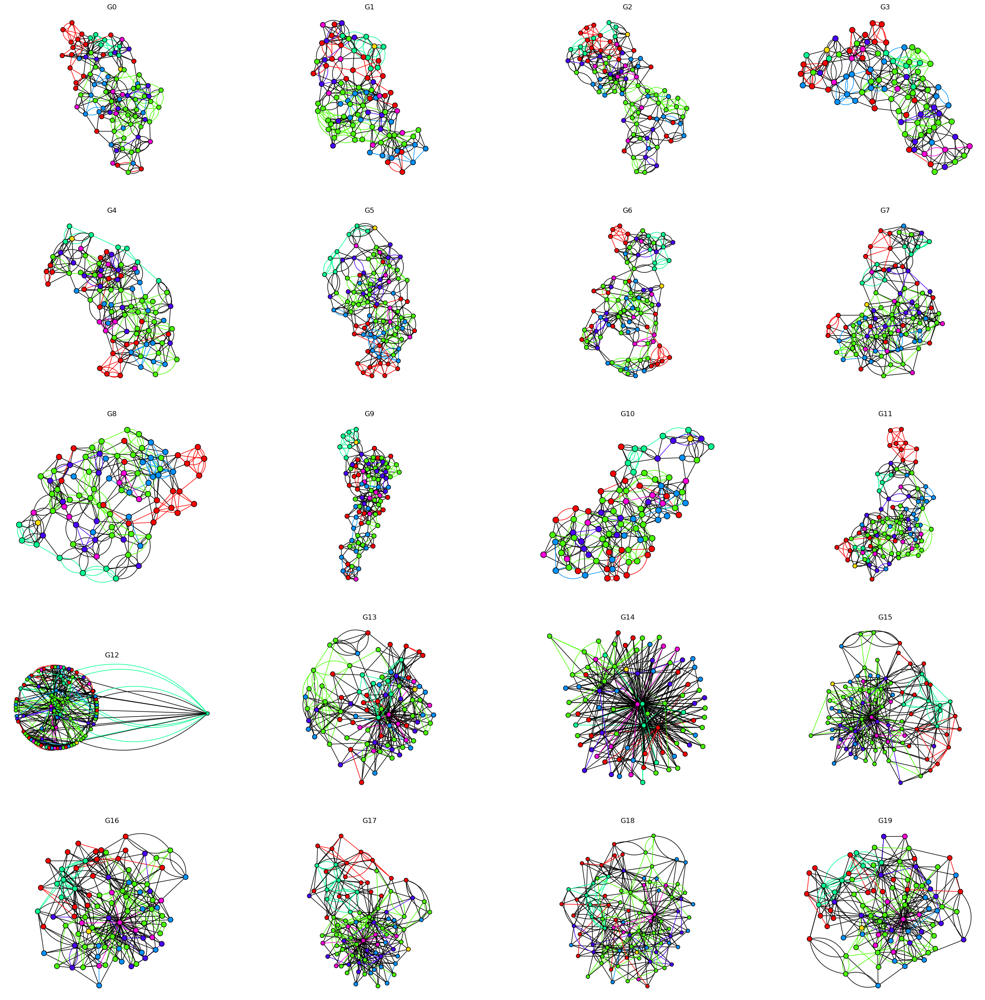

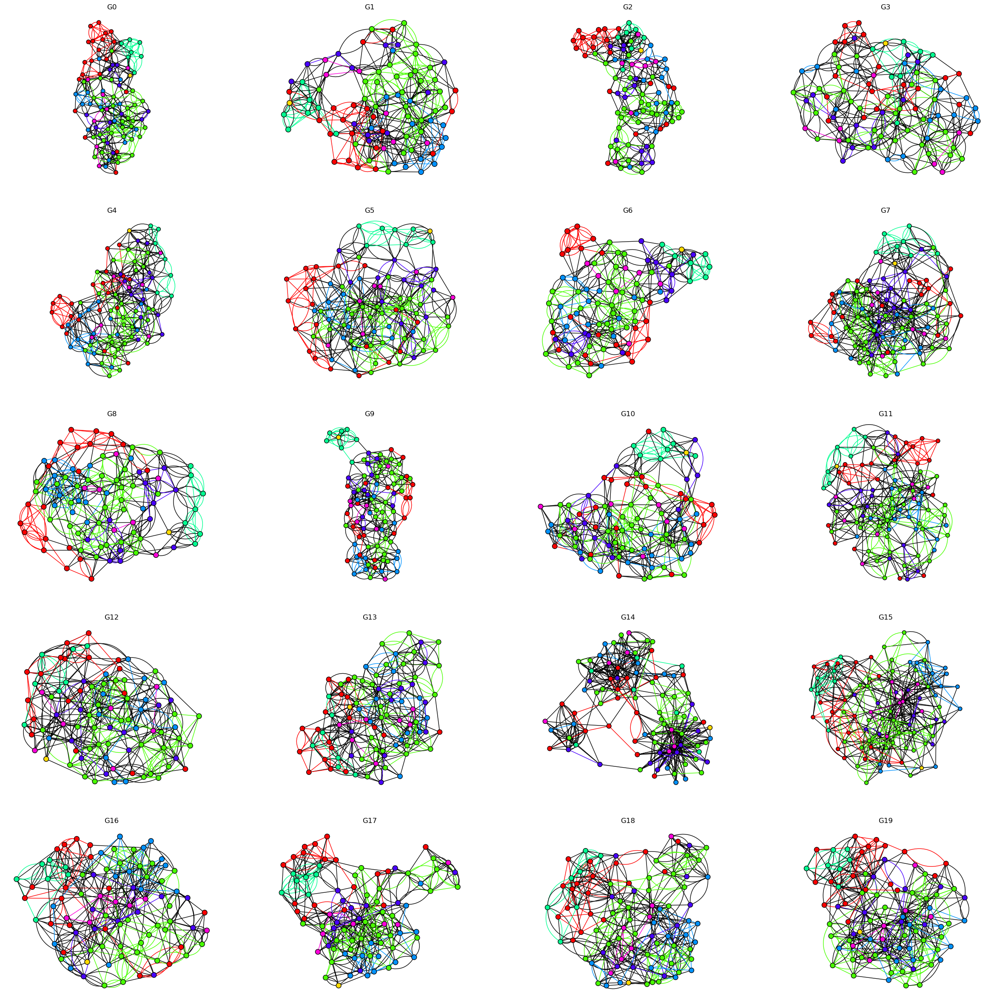

In [75]:
fig_5NN, ax_5NN = plt.subplots(5,4, figsize=(30,30))
fig_corr, ax_corr = plt.subplots(5,4, figsize=(30,30))
plot_pos = {"row": 0, "col": 0}


for count, graph_id in enumerate(graphs_to_explore):
    g_5NN = id_to_5NN[graph_id]
    g_corr = id_to_graph_per_node_5[graph_id]
    
    visualized_d(ax_5NN[plot_pos["row"], plot_pos["col"]], g_5NN)
    ax_5NN[plot_pos["row"], plot_pos["col"]].set_title(graph_id)

  
    visualized_d(ax_corr[plot_pos["row"], plot_pos["col"]], g_corr)
    ax_corr[plot_pos["row"], plot_pos["col"]].set_title(graph_id)
    
    #update position in plot
    plot_pos["col"] += 1
    if plot_pos["col"] == 4:
        plot_pos["col"] = 0 
        plot_pos["row"] += 1

         
# Get colours for current style
colours = plt.rcParams['axes.prop_cycle'].by_key()['color']
# Set up handles (the bits that are drawn in the legend) and labels
handles = []
group_labels = diseases
for group_idx in range(len(group_labels)):
    # Create a simple patch that is the correct colour
    colour = colours[group_idx]
    handles.append(Patch(edgecolor=colour, facecolor=colour, fill=True))
# Acutally create our figure legend, using the above handles and labels
loc='lower center'
ncol=len(group_labels)
fig_corr.legend(handles=handles, labels=group_labels, loc=loc, ncol=ncol)
fig_5NN.legend(handles=handles, labels=group_labels, loc=loc, ncol=ncol)

fig_5NN.savefig(os.path.join(plots, "5nn_d")) 
fig_corr.savefig(os.path.join(plots, "corr_d")) 

### 5NN and corr color by disease group

In [ ]:
fig_5NN, ax_5NN = plt.subplots(5,4, figsize=(30,30))
fig_corr, ax_corr = plt.subplots(5,4, figsize=(30,30))
plot_pos = {"row": 0, "col": 0}


for count, graph_id in enumerate(graphs_to_explore):
    g_5NN = id_to_5NN[graph_id]
    g_corr = id_to_graph_per_node_5[graph_id]
    
    visualized_dg(ax_5NN[plot_pos["row"], plot_pos["col"]], g_5NN)
    ax_5NN[plot_pos["row"], plot_pos["col"]].set_title(graph_id)

  
    visualized_dg(ax_corr[plot_pos["row"], plot_pos["col"]], g_corr)
    ax_corr[plot_pos["row"], plot_pos["col"]].set_title(graph_id)
    
    #update position in plot
    plot_pos["col"] += 1
    if plot_pos["col"] == 4:
        plot_pos["col"] = 0 
        plot_pos["row"] += 1


# Get colours for current style
colours = plt.rcParams['axes.prop_cycle'].by_key()['color']
# Set up handles (the bits that are drawn in the legend) and labels
handles = []
group_labels = disease_groups
for group_idx in range(len(group_labels)):
    # Create a simple patch that is the correct colour
    colour = colours[group_idx]
    handles.append(Patch(edgecolor=colour, facecolor=colour, fill=True))
# Acutally create our figure legend, using the above handles and labels
loc='lower center'
ncol=len(group_labels)
fig_corr.legend(handles=handles, labels=group_labels, loc=loc, ncol=ncol)
fig_5NN.legend(handles=handles, labels=group_labels, loc=loc, ncol=ncol)

fig_5NN.savefig(os.path.join(plots, "5nn_dg")) 
fig_corr.savefig(os.path.join(plots, "corr_dg")) 

### Edge Betweenness

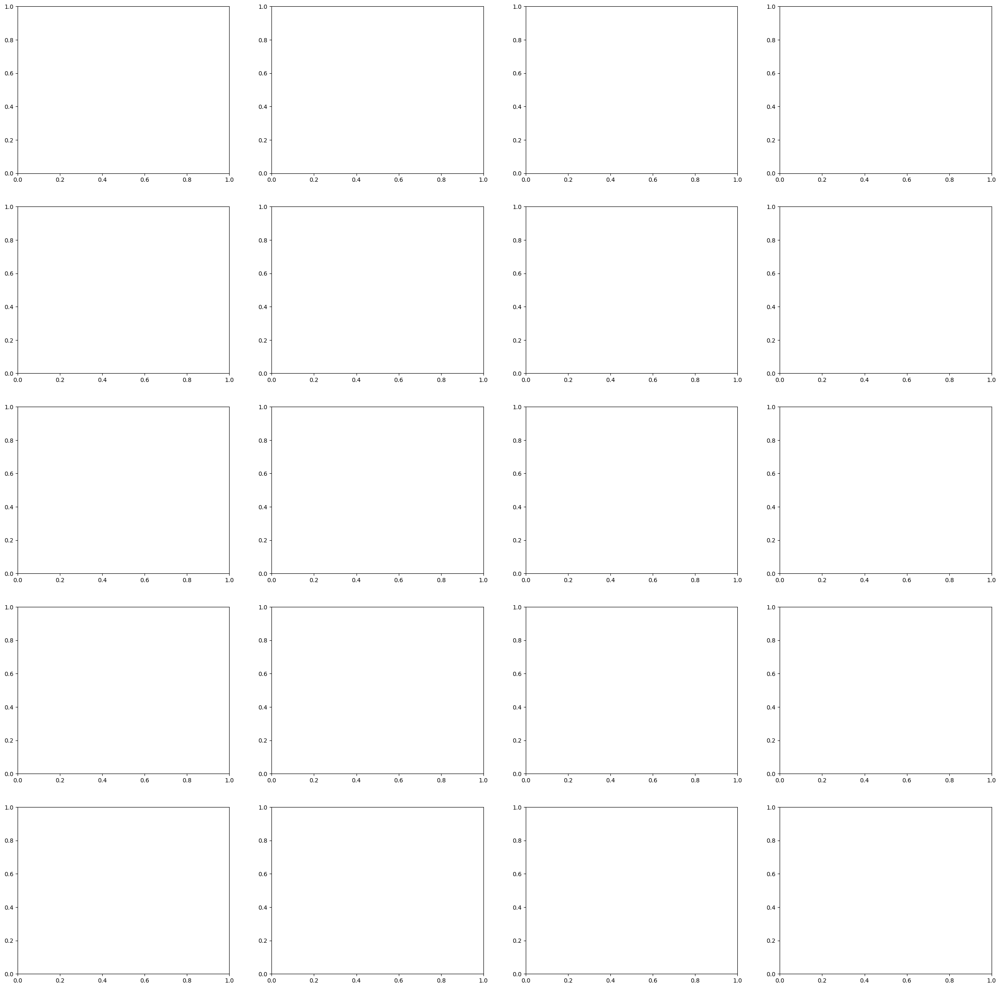

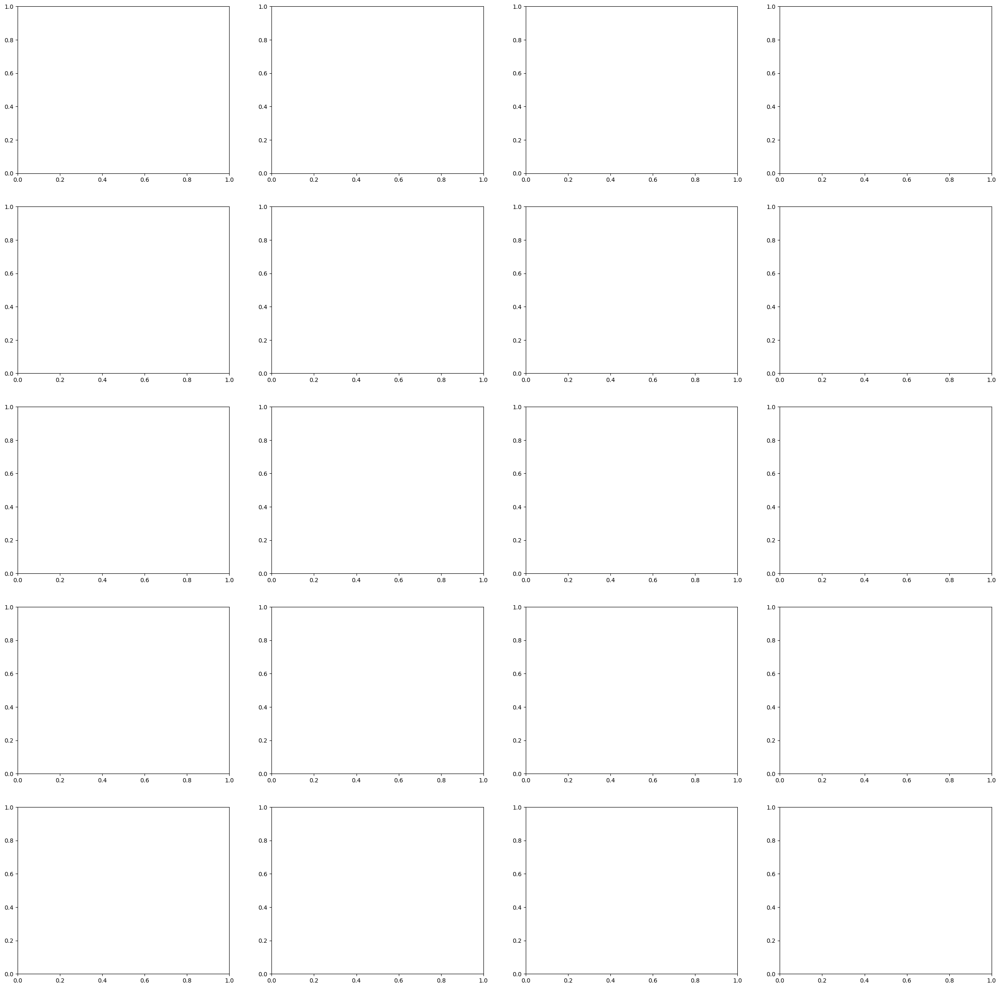

In [358]:
fig_5NN, ax_5NN = plt.subplots(5,4, figsize=(30,30))
fig_corr, ax_corr = plt.subplots(5,4, figsize=(30,30))
plot_pos = {"row": 0, "col": 0}
g_5NN_summary["edge_betweenness"]={}
g_corr_summary["edge_betweenness"]={}

for count, graph_id in enumerate(graphs_to_explore):
    g_5NN = id_to_5NN[graph_id]
    g_corr = id_to_graph_per_node_5[graph_id]

    if graph_id == "G100":
        communities_5NN = g_5NN.community_edge_betweenness(directed=False)
        num_com_5NN = visualized_com(communities_5NN, ax_5NN[plot_pos["row"], plot_pos["col"]], "edge_betweenness", g_5NN)
        #ax_5NN[plot_pos["row"], plot_pos["col"]].set_title(graph_id)
        
    else:
        communities_5NN = g_5NN.community_edge_betweenness(directed=False, clusters=5)
        num_com_5NN = visualized_com(communities_5NN, ax_5NN[plot_pos["row"], plot_pos["col"]], "edge_betweenness", g_5NN)
        #ax_5NN[plot_pos["row"], plot_pos["col"]].set_title(graph_id)

    communities_corr = g_corr.community_edge_betweenness(directed= False, clusters=5)
    num_com_corr = visualized_com(communities_corr, ax_corr[plot_pos["row"], plot_pos["col"]], "edge_betweenness", g_corr)
    #ax_corr[plot_pos["row"], plot_pos["col"]].set_title(graph_id)

    g_5NN_summary["edge_betweenness"][graph_id] = {"num_com": num_com_5NN}
    g_corr_summary["edge_betweenness"][graph_id] = {"num_com": num_com_corr}

    # The name of the saved file
    if plot_pos["row"] == 0 and plot_pos["col"] == 0:
        name = graph_id + "--"

    if plot_pos["row"] == 4 and plot_pos["col"] == 3:
        name = name + graph_id
        fig_5NN.savefig(os.path.join(plots, "5nn_edge_betweenness--" + name)) 
        fig_corr.savefig(os.path.join(plots, "corr_edge_betweenness--" +  name)) 
    
    #update position in plot
    plot_pos["col"] += 1
    if plot_pos["col"] == 4:
        plot_pos["col"] = 0 
        plot_pos["row"] += 1
    if plot_pos["row"] == 5:
        fig_5NN, ax_5NN = plt.subplots(5,4, figsize=(30,30))
        fig_corr, ax_corr = plt.subplots(5,4, figsize=(30,30))
        plot_pos = {"row": 0, "col": 0}
        


In [ ]:
with open(os.path.join(tables, 'g_5NN_summary_v1.pickle'), 'wb') as f:
    pickle.dump(g_5NN_summary, f)

with open(os.path.join(tables, 'g_corr_summary_v1.pickle'), 'wb') as f:
    pickle.dump(g_corr_summary, f)

with open(os.path.join(tables, 'id_to_5NN.pickle'), 'wb') as f:
    pickle.dump(id_to_5NN, f)

with open(os.path.join(tables, 'id_to_graph_per_node_5.pickle'), 'wb') as f:
    pickle.dump(id_to_graph_per_node_5, f)

In [ ]:
with open(os.path.join(tables, "g_5NN_summary_v1.pickle"), "rb") as f:
    g_5NN_summary = pickle.load(f) 

with open(os.path.join(tables, "g_corr_summary_v1.pickle"), "rb") as f:
    g_corr_summary = pickle.load(f) 

with open(os.path.join(tables, "id_to_5NN.pickle"), "rb") as f:
    id_to_5NN = pickle.load(f) 

with open(os.path.join(tables, "id_to_graph_per_node_5.pickle"), "rb") as f:
    id_to_graph_per_node_5 = pickle.load(f) 

### Eigen Vector

In [359]:
graphs_to_explore_subset = graphs_to_explore[:160]

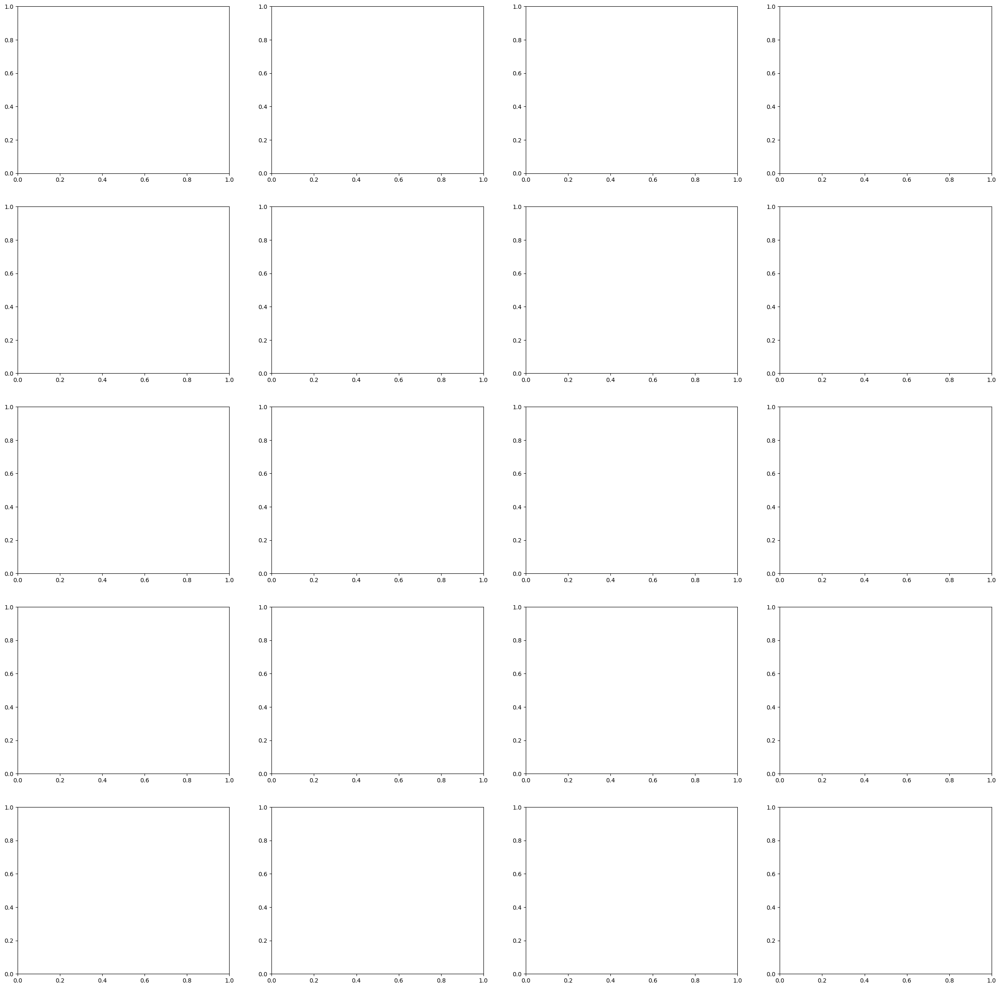

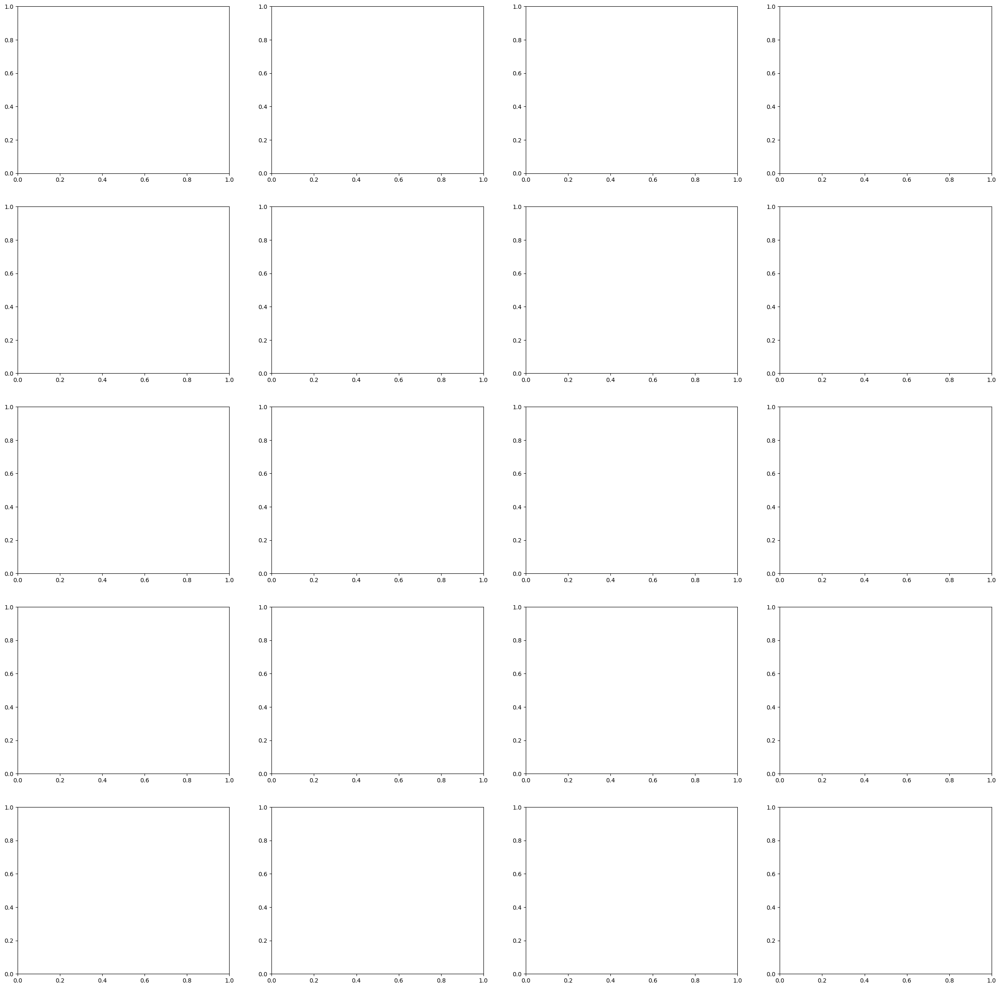

In [360]:
fig_5NN, ax_5NN = plt.subplots(5,4, figsize=(30,30))
fig_corr, ax_corr = plt.subplots(5,4, figsize=(30,30))
plot_pos = {"row": 0, "col": 0}
g_5NN_summary["eigen_vector"]={}
g_corr_summary["eigen_vector"]={}

for count, graph_id in enumerate(graphs_to_explore_subset):
    g_5NN = id_to_5NN[graph_id]
    g_corr = id_to_graph_per_node_5[graph_id]


    communities_5NN = g_5NN.community_leading_eigenvector(clusters = 5)
    num_com_5NN = visualized_com(communities_5NN, ax_5NN[plot_pos["row"], plot_pos["col"]], "eigen_vector", g_5NN)
    ax_5NN[plot_pos["row"], plot_pos["col"]].set_title(graph_id)

    communities_corr = g_corr.community_leading_eigenvector(clusters = 5)
    num_com_corr = visualized_com(communities_corr, ax_corr[plot_pos["row"], plot_pos["col"]], "eigen_vector", g_corr)
    ax_corr[plot_pos["row"], plot_pos["col"]].set_title(graph_id)

    g_5NN_summary["eigen_vector"][graph_id] = {"num_com":num_com_5NN}
    g_corr_summary["eigen_vector"][graph_id] = {"num_com":num_com_corr}

    # The name of the saved file
    if plot_pos["row"] == 0 and plot_pos["col"] == 0:
        name = graph_id + "--"

    if plot_pos["row"] == 4 and plot_pos["col"] == 3:
        name = name + graph_id
        fig_5NN.savefig(os.path.join(plots, "5nn_eigen_vector--" + name)) 
        fig_corr.savefig(os.path.join(plots, "corr_eigen_vector--" + name)) 
    
    #update position in plot
    plot_pos["col"] += 1
    if plot_pos["col"] == 4:
        plot_pos["col"] = 0 
        plot_pos["row"] += 1
    if plot_pos["row"] == 5:
        fig_5NN, ax_5NN = plt.subplots(5,4, figsize=(30,30))
        fig_corr, ax_corr = plt.subplots(5,4, figsize=(30,30))
        plot_pos = {"row": 0, "col": 0}


In [361]:
graphs_to_explore_subset = graphs_to_explore[160:320]

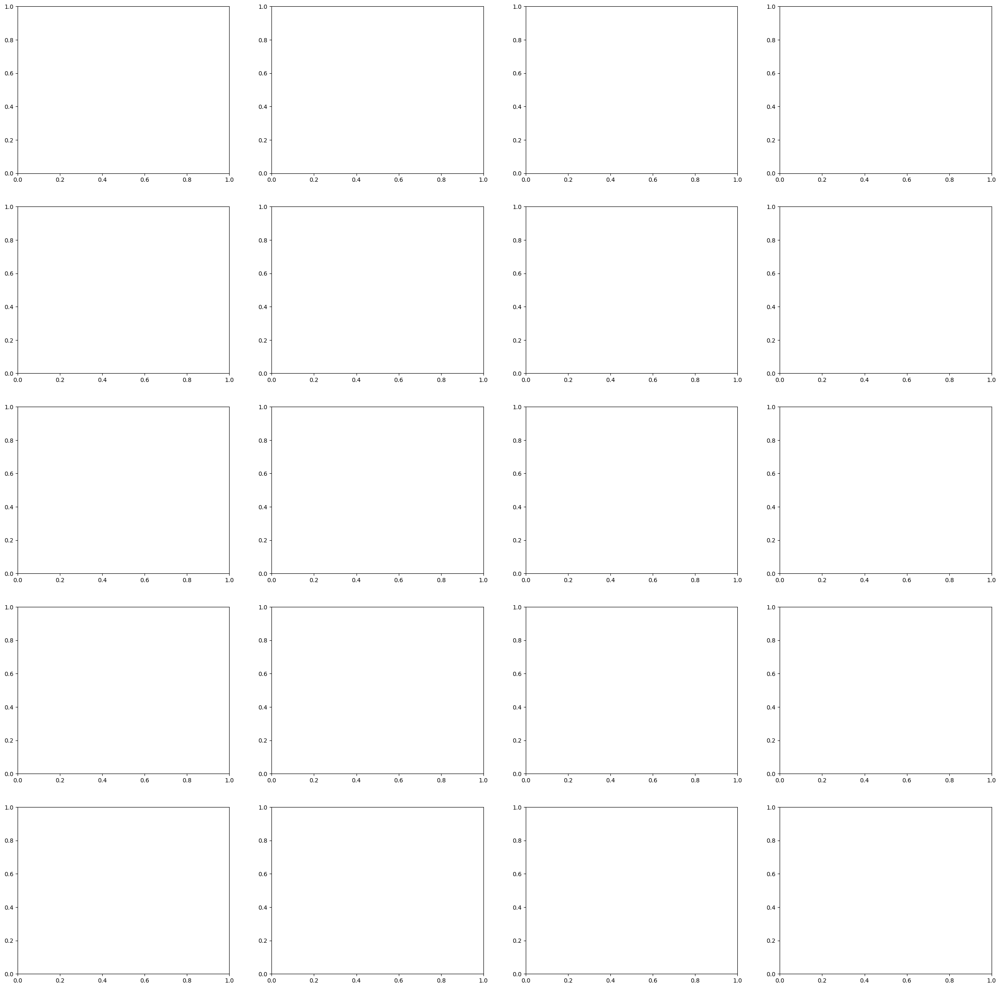

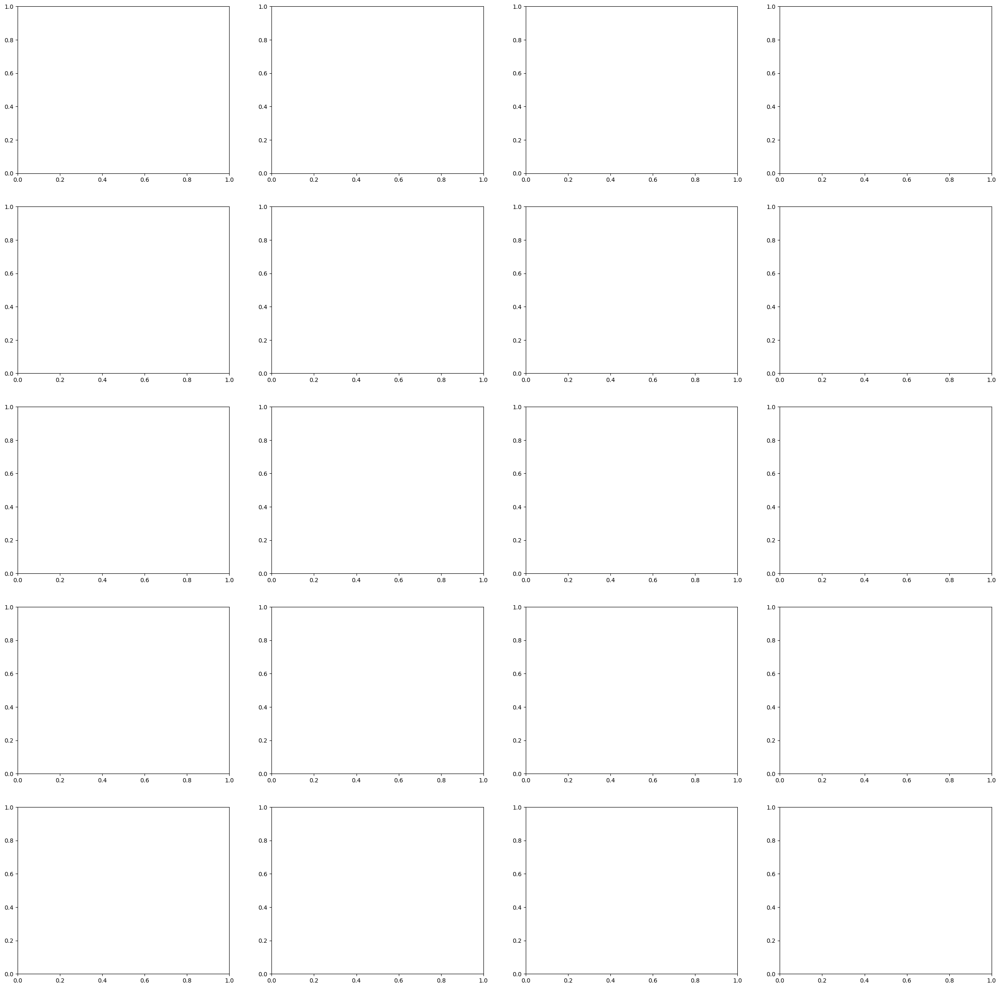

In [362]:
fig_5NN, ax_5NN = plt.subplots(5,4, figsize=(30,30))
fig_corr, ax_corr = plt.subplots(5,4, figsize=(30,30))
plot_pos = {"row": 0, "col": 0}

for count, graph_id in enumerate(graphs_to_explore_subset):
    g_5NN = id_to_5NN[graph_id]
    g_corr = id_to_graph_per_node_5[graph_id]


    communities_5NN = g_5NN.community_leading_eigenvector(clusters = 5)
    num_com_5NN = visualized_com(communities_5NN, ax_5NN[plot_pos["row"], plot_pos["col"]], "eigen_vector", g_5NN)
    ax_5NN[plot_pos["row"], plot_pos["col"]].set_title(graph_id)

    communities_corr = g_corr.community_leading_eigenvector(clusters = 5)
    num_com_corr = visualized_com(communities_corr, ax_corr[plot_pos["row"], plot_pos["col"]], "eigen_vector", g_corr)
    ax_corr[plot_pos["row"], plot_pos["col"]].set_title(graph_id)

    g_5NN_summary["eigen_vector"][graph_id] = {"num_com":num_com_5NN}
    g_corr_summary["eigen_vector"][graph_id] = {"num_com":num_com_corr}

    # The name of the saved file
    if plot_pos["row"] == 0 and plot_pos["col"] == 0:
        name = graph_id + "--"

    if plot_pos["row"] == 4 and plot_pos["col"] == 3:
        name = name + graph_id
        fig_5NN.savefig(os.path.join(plots, "5nn_eigen_vector--" + name)) 
        fig_corr.savefig(os.path.join(plots, "corr_eigen_vector--" + name)) 
    
    #update position in plot
    plot_pos["col"] += 1
    if plot_pos["col"] == 4:
        plot_pos["col"] = 0 
        plot_pos["row"] += 1
    if plot_pos["row"] == 5:
        fig_5NN, ax_5NN = plt.subplots(5,4, figsize=(30,30))
        fig_corr, ax_corr = plt.subplots(5,4, figsize=(30,30))
        plot_pos = {"row": 0, "col": 0}


In [373]:
graphs_to_explore_subset = graphs_to_explore[320:]

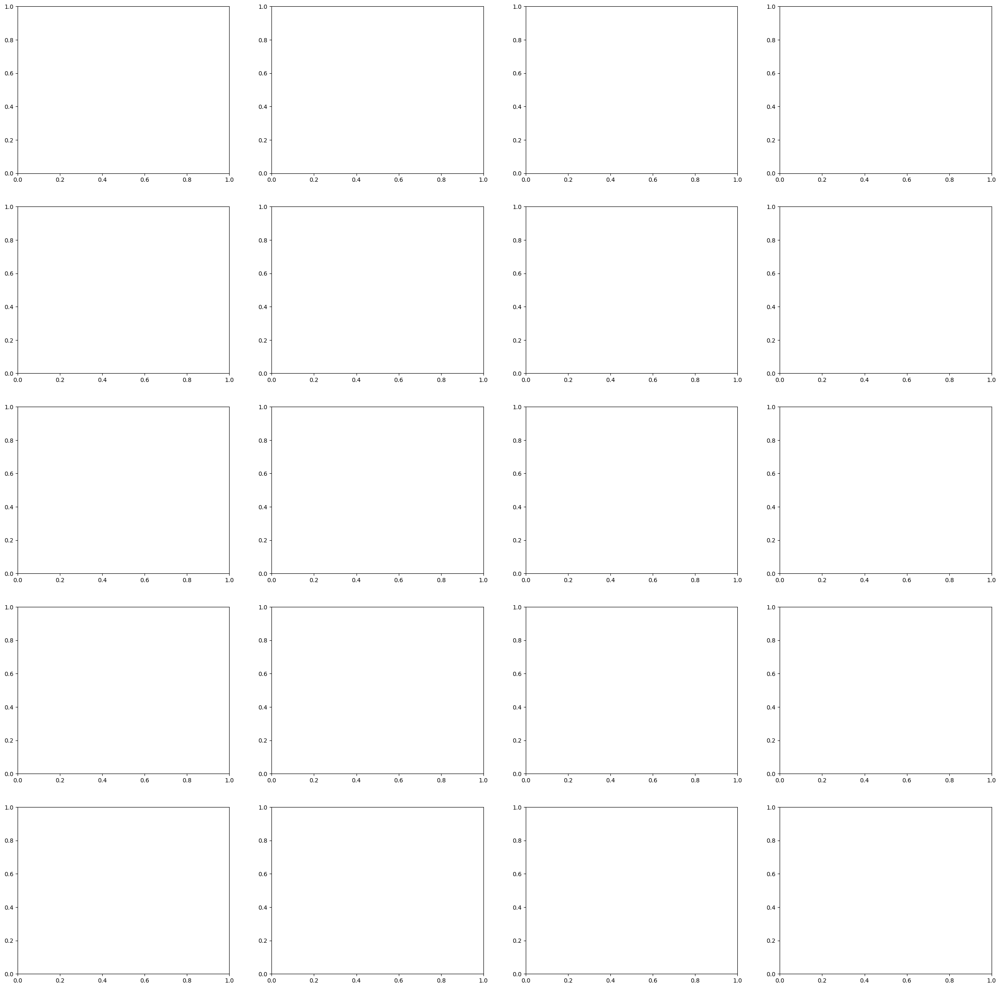

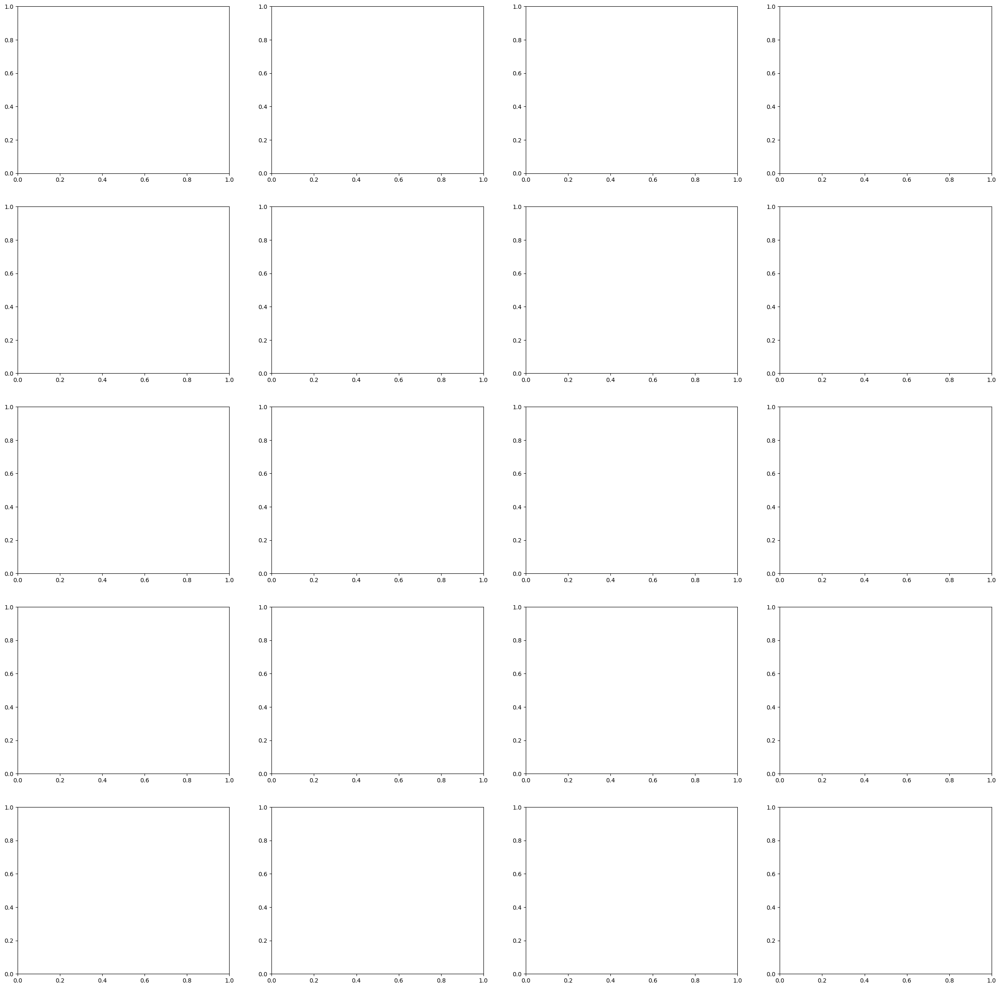

In [375]:
fig_5NN, ax_5NN = plt.subplots(5,4, figsize=(30,30))
fig_corr, ax_corr = plt.subplots(5,4, figsize=(30,30))
plot_pos = {"row": 0, "col": 0}

for count, graph_id in enumerate(graphs_to_explore_subset):
    g_5NN = id_to_5NN[graph_id]
    g_corr = id_to_graph_per_node_5[graph_id]

    if graph_id == "G320":
        communities_5NN = g_5NN.community_leading_eigenvector(clusters = 4)
        num_com_5NN = visualized_com(communities_5NN, ax_5NN[plot_pos["row"], plot_pos["col"]], "eigen_vector", g_5NN)
        ax_5NN[plot_pos["row"], plot_pos["col"]].set_title(graph_id)
    else:
        communities_5NN = g_5NN.community_leading_eigenvector(clusters = 5)
        num_com_5NN = visualized_com(communities_5NN, ax_5NN[plot_pos["row"], plot_pos["col"]], "eigen_vector", g_5NN)
        ax_5NN[plot_pos["row"], plot_pos["col"]].set_title(graph_id)
    if graph_id == "G323":
        communities_corr = g_corr.community_leading_eigenvector(clusters = 4)
        num_com_corr = visualized_com(communities_corr, ax_corr[plot_pos["row"], plot_pos["col"]], "eigen_vector", g_corr)
        ax_corr[plot_pos["row"], plot_pos["col"]].set_title(graph_id)
    else:
        communities_corr = g_corr.community_leading_eigenvector(clusters = 5)
        num_com_corr = visualized_com(communities_corr, ax_corr[plot_pos["row"], plot_pos["col"]], "eigen_vector", g_corr)
        ax_corr[plot_pos["row"], plot_pos["col"]].set_title(graph_id)

    g_5NN_summary["eigen_vector"][graph_id] = {"num_com":num_com_5NN}
    g_corr_summary["eigen_vector"][graph_id] = {"num_com":num_com_corr}

    # The name of the saved file
    if plot_pos["row"] == 0 and plot_pos["col"] == 0:
        name = graph_id + "--"

    if plot_pos["row"] == 4 and plot_pos["col"] == 3:
        name = name + graph_id
        fig_5NN.savefig(os.path.join(plots, "5nn_eigen_vector--" + name)) 
        fig_corr.savefig(os.path.join(plots, "corr_eigen_vector--" + name)) 
    
    #update position in plot
    plot_pos["col"] += 1
    if plot_pos["col"] == 4:
        plot_pos["col"] = 0 
        plot_pos["row"] += 1
    if plot_pos["row"] == 5:
        fig_5NN, ax_5NN = plt.subplots(5,4, figsize=(30,30))
        fig_corr, ax_corr = plt.subplots(5,4, figsize=(30,30))
        plot_pos = {"row": 0, "col": 0}


In [376]:
with open(os.path.join(tables, 'g_5NN_summary_v2.pickle'), 'wb') as f:
    pickle.dump(g_5NN_summary, f)

with open(os.path.join(tables, 'g_corr_summary_v2.pickle'), 'wb') as f:
    pickle.dump(g_corr_summary, f)

with open(os.path.join(tables, 'id_to_5NN.pickle'), 'wb') as f:
    pickle.dump(id_to_5NN, f)

with open(os.path.join(tables, 'id_to_graph_per_node_5.pickle'), 'wb') as f:
    pickle.dump(id_to_graph_per_node_5, f)

In [ ]:
with open(os.path.join(tables, "g_5NN_summary_v2.pickle"), "rb") as f:
    g_5NN_summary = pickle.load(f) 

with open(os.path.join(tables, "g_corr_summary_v2.pickle"), "rb") as f:
    g_corr_summary = pickle.load(f) 

with open(os.path.join(tables, "id_to_5NN.pickle"), "rb") as f:
    id_to_5NN = pickle.load(f) 

with open(os.path.join(tables, "id_to_graph_per_node_5.pickle"), "rb") as f:
    id_to_graph_per_node_5 = pickle.load(f) 

### Leiden

In [377]:
graphs_to_explore_subset = graphs_to_explore[:160]

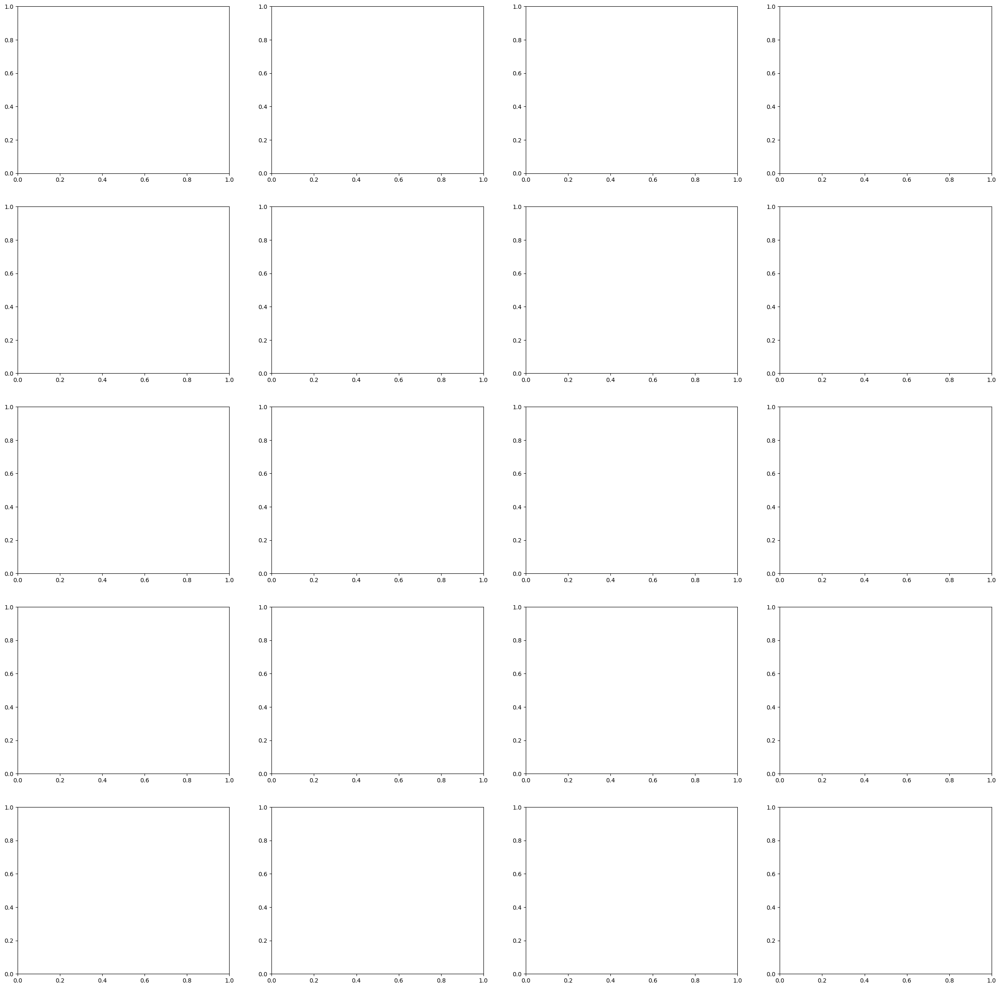

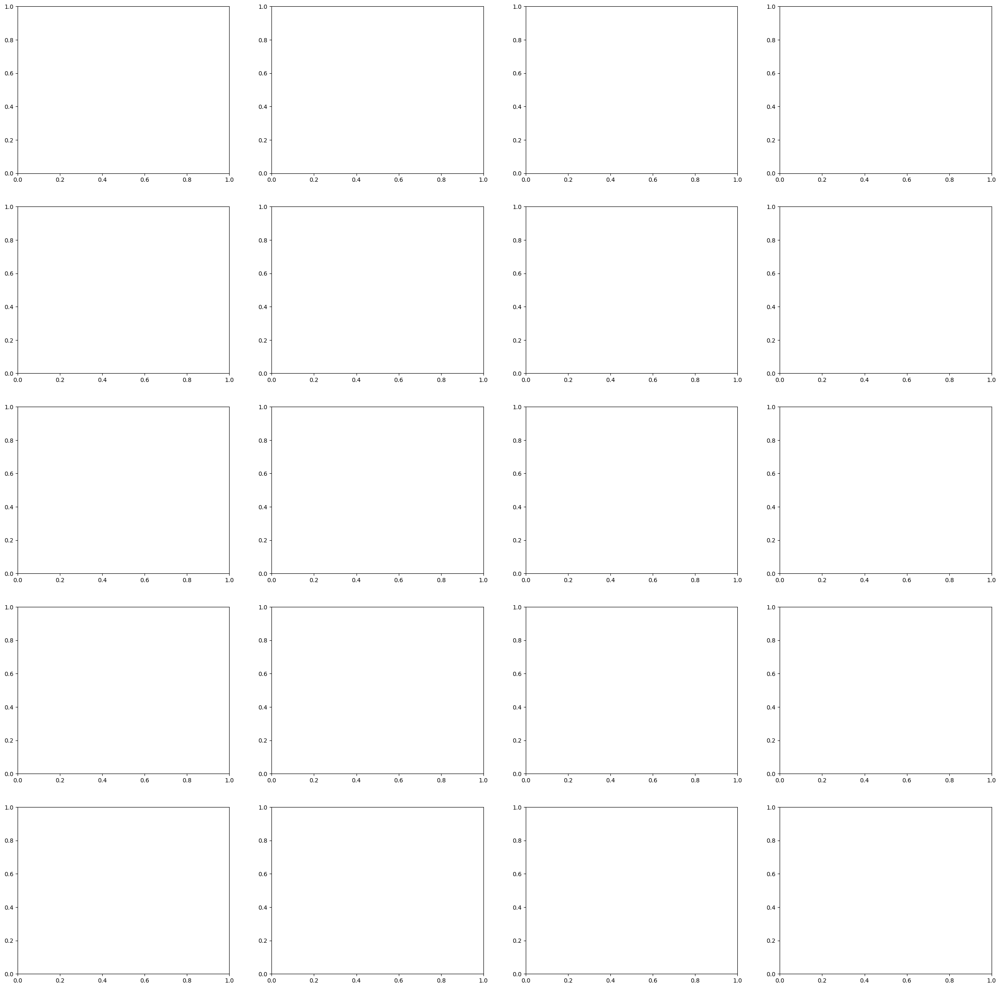

In [378]:
fig_5NN, ax_5NN = plt.subplots(5,4, figsize=(30,30))
fig_corr, ax_corr = plt.subplots(5,4, figsize=(30,30))
plot_pos = {"row": 0, "col": 0}
g_5NN_summary["leiden"]={}
g_corr_summary["leiden"]={}

for count, graph_id in enumerate(graphs_to_explore_subset):
    g_5NN = id_to_5NN[graph_id]
    g_corr = id_to_graph_per_node_5[graph_id]
    
    communities_5NN = g_5NN.community_leiden(objective_function = "modularity", resolution= 0.5, n_iterations = 10 )
    num_com_5NN= visualized_com(communities_5NN, ax_5NN[plot_pos["row"], plot_pos["col"]], "leiden", g_5NN)
    ax_5NN[plot_pos["row"], plot_pos["col"]].set_title(graph_id)

    communities_corr = g_corr.community_leiden(objective_function = "modularity", resolution= 0.5, n_iterations = 10 )
    num_com_corr = visualized_com(communities_corr, ax_corr[plot_pos["row"], plot_pos["col"]], "leiden", g_corr)
    ax_corr[plot_pos["row"], plot_pos["col"]].set_title(graph_id)

    g_5NN_summary["leiden"][graph_id] = {"num_com":num_com_5NN}
    g_corr_summary["leiden"][graph_id] = {"num_com":num_com_corr}

    # The name of the saved file
    if plot_pos["row"] == 0 and plot_pos["col"] == 0:
        name = graph_id + "--"

    if plot_pos["row"] == 4 and plot_pos["col"] == 3:
        name = name + graph_id
        fig_5NN.savefig(os.path.join(plots, "5nn_eigen_vector--" + name)) 
        fig_corr.savefig(os.path.join(plots, "corr_eigen_vector--" + name)) 
    
    #update position in plot
    plot_pos["col"] += 1
    if plot_pos["col"] == 4:
        plot_pos["col"] = 0 
        plot_pos["row"] += 1
    if plot_pos["row"] == 5:
        fig_5NN, ax_5NN = plt.subplots(5,4, figsize=(30,30))
        fig_corr, ax_corr = plt.subplots(5,4, figsize=(30,30))
        plot_pos = {"row": 0, "col": 0}

    fig_5NN.savefig(os.path.join(plots, "5nn_leiden" + name)) 
    fig_corr.savefig(os.path.join(plots, "corr_leiden" + name)) 

In [379]:
graphs_to_explore_subset = graphs_to_explore[160:320]

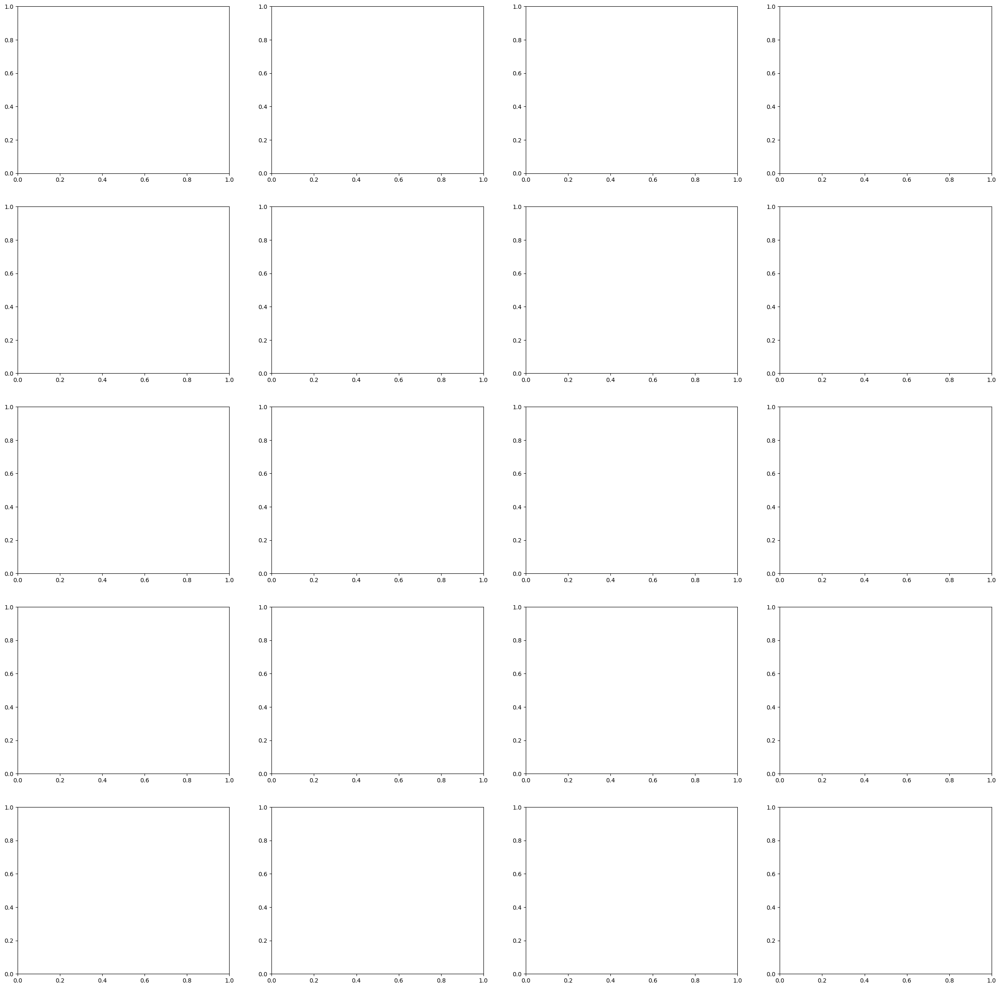

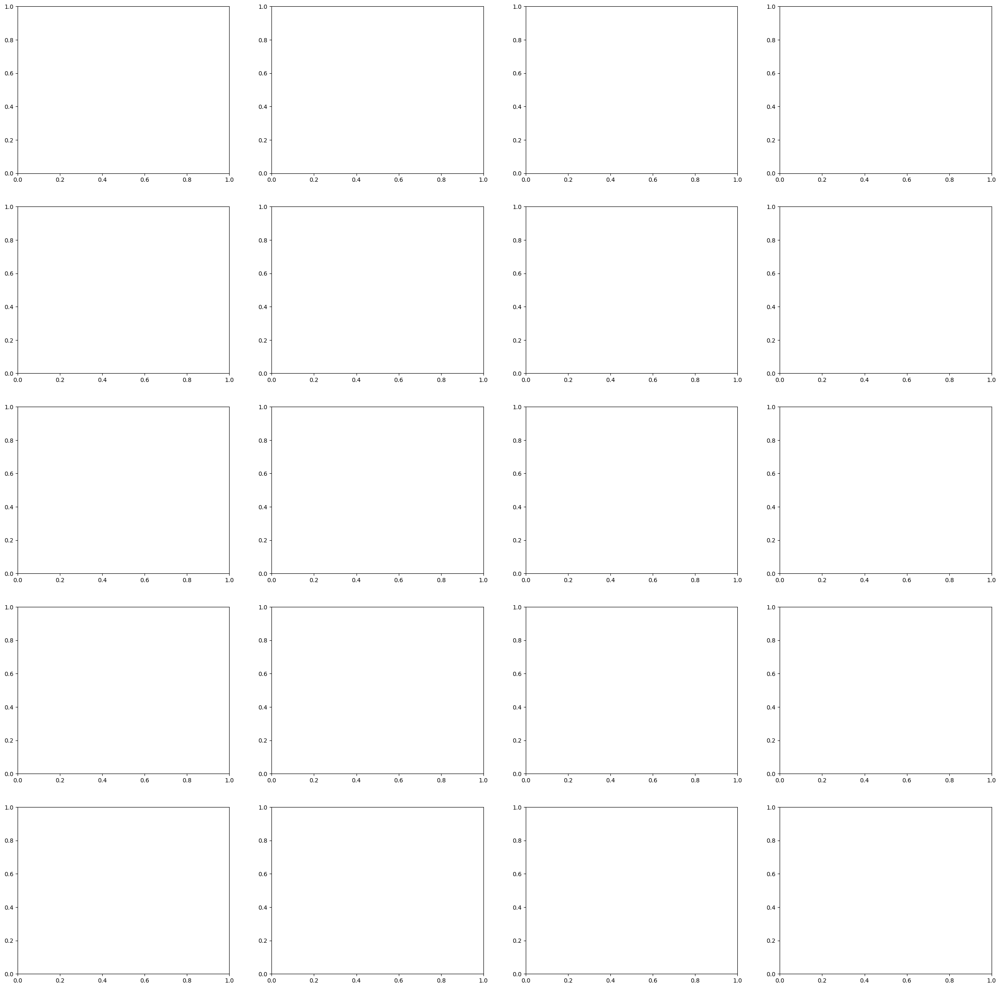

In [380]:
fig_5NN, ax_5NN = plt.subplots(5,4, figsize=(30,30))
fig_corr, ax_corr = plt.subplots(5,4, figsize=(30,30))
plot_pos = {"row": 0, "col": 0}

for count, graph_id in enumerate(graphs_to_explore_subset):
    g_5NN = id_to_5NN[graph_id]
    g_corr = id_to_graph_per_node_5[graph_id]
    
    communities_5NN = g_5NN.community_leiden(objective_function = "modularity", resolution= 0.5, n_iterations = 10 )
    num_com_5NN= visualized_com(communities_5NN, ax_5NN[plot_pos["row"], plot_pos["col"]], "leiden", g_5NN)
    ax_5NN[plot_pos["row"], plot_pos["col"]].set_title(graph_id)

    communities_corr = g_corr.community_leiden(objective_function = "modularity", resolution= 0.5, n_iterations = 10 )
    num_com_corr = visualized_com(communities_corr, ax_corr[plot_pos["row"], plot_pos["col"]], "leiden", g_corr)
    ax_corr[plot_pos["row"], plot_pos["col"]].set_title(graph_id)

    g_5NN_summary["leiden"][graph_id] = {"num_com":num_com_5NN}
    g_corr_summary["leiden"][graph_id] = {"num_com":num_com_corr}

    # The name of the saved file
    if plot_pos["row"] == 0 and plot_pos["col"] == 0:
        name = graph_id + "--"

    if plot_pos["row"] == 4 and plot_pos["col"] == 3:
        name = name + graph_id
        fig_5NN.savefig(os.path.join(plots, "5nn_eigen_vector--" + name)) 
        fig_corr.savefig(os.path.join(plots, "corr_eigen_vector--" + name)) 
    
    #update position in plot
    plot_pos["col"] += 1
    if plot_pos["col"] == 4:
        plot_pos["col"] = 0 
        plot_pos["row"] += 1
    if plot_pos["row"] == 5:
        fig_5NN, ax_5NN = plt.subplots(5,4, figsize=(30,30))
        fig_corr, ax_corr = plt.subplots(5,4, figsize=(30,30))
        plot_pos = {"row": 0, "col": 0}

    fig_5NN.savefig(os.path.join(plots, "5nn_leiden" + name)) 
    fig_corr.savefig(os.path.join(plots, "corr_leiden" + name)) 

In [381]:
graphs_to_explore_subset = graphs_to_explore[320:]

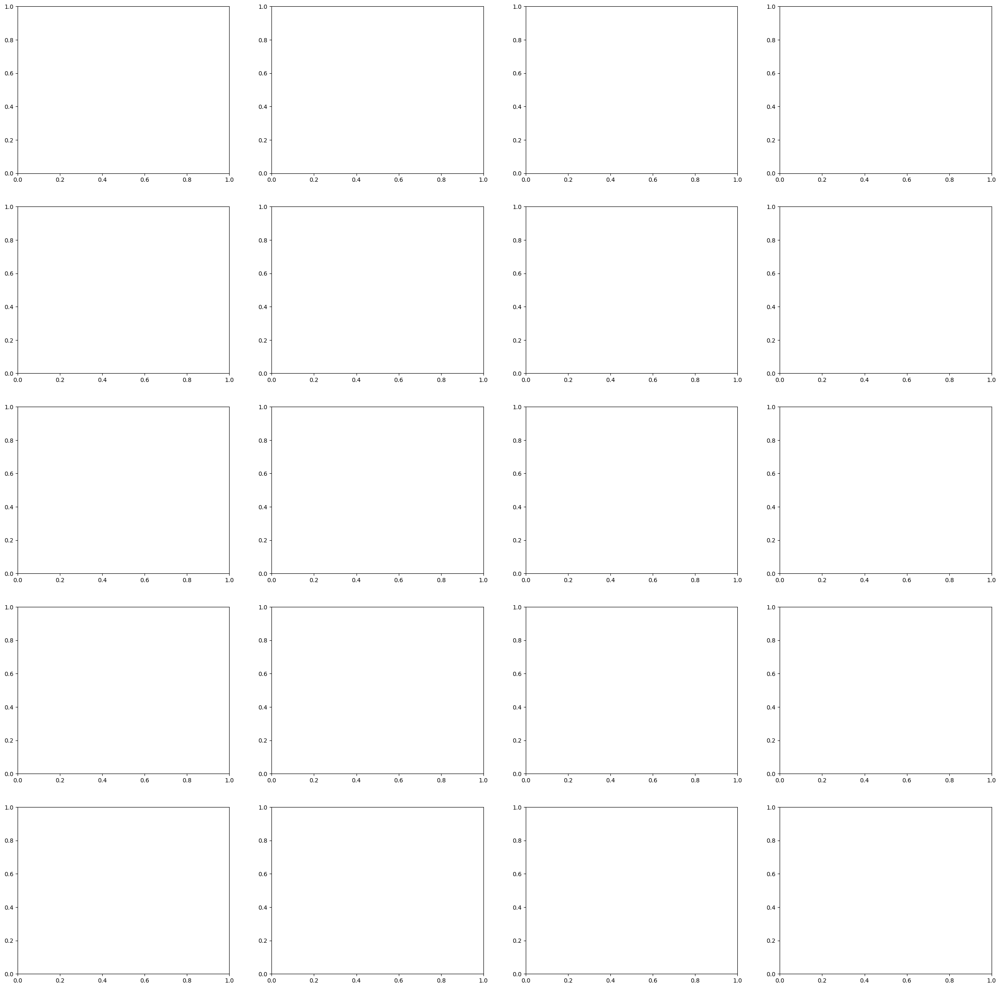

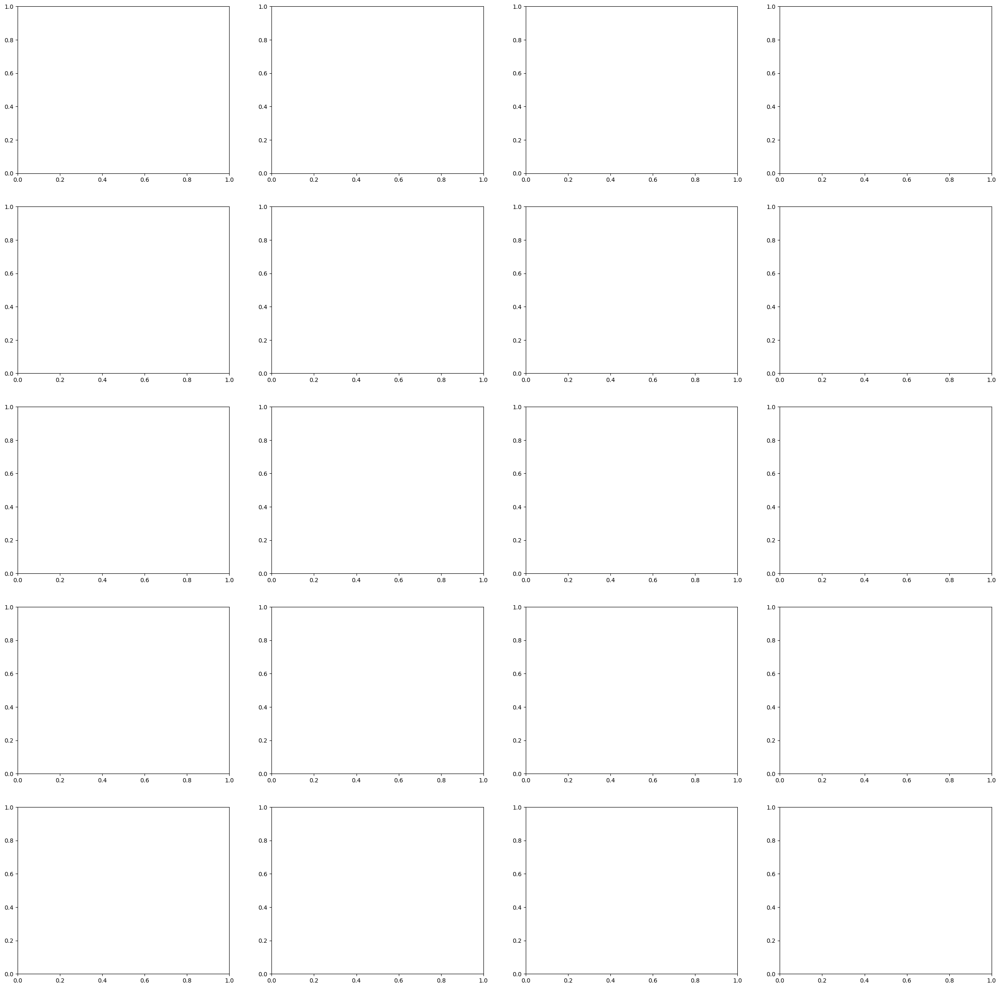

In [382]:
fig_5NN, ax_5NN = plt.subplots(5,4, figsize=(30,30))
fig_corr, ax_corr = plt.subplots(5,4, figsize=(30,30))
plot_pos = {"row": 0, "col": 0}

for count, graph_id in enumerate(graphs_to_explore_subset):
    g_5NN = id_to_5NN[graph_id]
    g_corr = id_to_graph_per_node_5[graph_id]
    
    communities_5NN = g_5NN.community_leiden(objective_function = "modularity", resolution= 0.5, n_iterations = 10 )
    num_com_5NN= visualized_com(communities_5NN, ax_5NN[plot_pos["row"], plot_pos["col"]], "leiden", g_5NN)
    ax_5NN[plot_pos["row"], plot_pos["col"]].set_title(graph_id)

    communities_corr = g_corr.community_leiden(objective_function = "modularity", resolution= 0.5, n_iterations = 10 )
    num_com_corr = visualized_com(communities_corr, ax_corr[plot_pos["row"], plot_pos["col"]], "leiden", g_corr)
    ax_corr[plot_pos["row"], plot_pos["col"]].set_title(graph_id)

    g_5NN_summary["leiden"][graph_id] = {"num_com":num_com_5NN}
    g_corr_summary["leiden"][graph_id] = {"num_com":num_com_corr}

    # The name of the saved file
    if plot_pos["row"] == 0 and plot_pos["col"] == 0:
        name = graph_id + "--"

    if plot_pos["row"] == 4 and plot_pos["col"] == 3:
        name = name + graph_id
        fig_5NN.savefig(os.path.join(plots, "5nn_eigen_vector--" + name)) 
        fig_corr.savefig(os.path.join(plots, "corr_eigen_vector--" + name)) 
    
    #update position in plot
    plot_pos["col"] += 1
    if plot_pos["col"] == 4:
        plot_pos["col"] = 0 
        plot_pos["row"] += 1
    if plot_pos["row"] == 5:
        fig_5NN, ax_5NN = plt.subplots(5,4, figsize=(30,30))
        fig_corr, ax_corr = plt.subplots(5,4, figsize=(30,30))
        plot_pos = {"row": 0, "col": 0}

    fig_5NN.savefig(os.path.join(plots, "5nn_leiden" + name)) 
    fig_corr.savefig(os.path.join(plots, "corr_leiden" + name)) 

In [383]:
with open(os.path.join(tables, 'g_5NN_summary_v3.pickle'), 'wb') as f:
    pickle.dump(g_5NN_summary, f)

with open(os.path.join(tables, 'g_corr_summary_v3.pickle'), 'wb') as f:
    pickle.dump(g_corr_summary, f)

with open(os.path.join(tables, 'id_to_5NN.pickle'), 'wb') as f:
    pickle.dump(id_to_5NN, f)

with open(os.path.join(tables, 'id_to_graph_per_node_5.pickle'), 'wb') as f:
    pickle.dump(id_to_graph_per_node_5, f)

In [391]:
with open(os.path.join(tables, "g_5NN_summary_v3.pickle"), "rb") as f:
    g_5NN_summary = pickle.load(f) 

with open(os.path.join(tables, "g_corr_summary_v3.pickle"), "rb") as f:
    g_corr_summary = pickle.load(f) 

with open(os.path.join(tables, "id_to_5NN.pickle"), "rb") as f:
    id_to_5NN = pickle.load(f) 

with open(os.path.join(tables, "id_to_graph_per_node_5.pickle"), "rb") as f:
    id_to_graph_per_node_5 = pickle.load(f) 

## Analysis

### Number of Vertices, Average Node Degree and Graph Density

In [440]:
num_v = {} #How many networks have a certain number of vertices
num_vertices_sum = 0
for id in graphs_to_explore:
    g = id_to_5NN[id]
    if g.vcount() not in num_v.keys():
        num_v[g.vcount()] = 0
    num_v[g.vcount()] += 1
    num_vertices_sum+= g.vcount()

print(num_v)
print("avg num vertices: ", num_vertices_sum/sum(list(num_v.values()) ))

{93: 12, 90: 160, 91: 40, 83: 20, 46: 20, 89: 40, 82: 20, 36: 20, 28: 20, 108: 11, 107: 1, 104: 1, 75: 1}
avg node degree:  81.12021857923497


In [449]:
avg_node_degrees = {"5NN": [], "corr": []}
min_node_degrees = {"5NN": [], "corr": []}
max_node_degrees = {"5NN": [], "corr": []}

for id in graphs_to_explore:
    g = id_to_5NN[id]
    degrees = np.array(g.degree())
    avg_node_degrees["5NN"].append(degrees.mean())
    min_node_degrees["5NN"].append(degrees.min())
    max_node_degrees["5NN"].append(degrees.max())


    g = id_to_graph_per_node_5[id]
    degrees = np.array(g.degree())
    avg_node_degrees["corr"].append(degrees.mean())
    min_node_degrees["corr"].append(degrees.min())
    max_node_degrees["corr"].append(degrees.max())


print("avg avg 5NN: ", np.array(avg_node_degrees["5NN"]).mean(), " avg min 5NN: ", np.array(min_node_degrees["5NN"]).mean(), " avg max 5NN: ", np.array(max_node_degrees["5NN"]).mean() )
print("avg avg corr: ", np.array(avg_node_degrees["corr"]).mean(), " avg min corr: ", np.array(min_node_degrees["corr"]).mean(), " avg max corr: ", np.array(max_node_degrees["corr"]).mean() )

avg avg 5NN:  8.0  avg min 5NN:  4.0  avg max 5NN:  47.35245901639344
avg avg corr:  9.189884110767931  avg min corr:  4.581967213114754  avg max corr:  34.68032786885246


<Axes: >

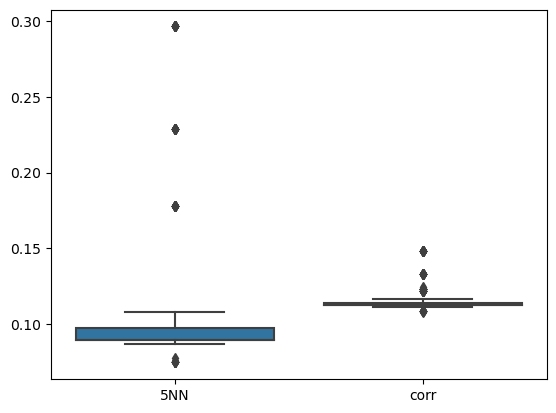

In [452]:
density_5NN = []
density_corr = []

for id in graphs_to_explore:
    g = id_to_5NN[id]
    density_5NN.append(g.density())
    g = id_to_graph_per_node_5[id]
    density_corr.append(g.density())

df = pd.DataFrame({"5NN": density_5NN, "corr": density_corr})
sb.boxplot(df)

### Number of communities

In [384]:
for g in graphs_to_explore:
    overview_df["5NN_" + g].append(g_5NN_summary["edge_betweenness"][g]["num_com"])
    overview_df["5NN_" + g].append(g_5NN_summary["eigen_vector"][g]["num_com"])
    overview_df["5NN_" + g].append(g_5NN_summary["leiden"][g]["num_com"])

    overview_df["corr_" + g].append(g_corr_summary["edge_betweenness"][g]["num_com"])
    overview_df["corr_" + g].append(g_corr_summary["eigen_vector"][g]["num_com"])
    overview_df["corr_" + g].append(g_corr_summary["leiden"][g]["num_com"])

### Contains the following information
- for every community, count the number of members of each diseases
- for every community, count the number of members of each disease groups
- for every community, count the number of patients
- for every disease, how many communities capture it: 1) purely (at least 2 patients), 2) 90% (at least 3 patients), 3) 80% (at least 3 patients), 70% (at least 3 patients)


In [482]:
for count, graph_id in enumerate(graphs_to_explore):
    g_5NN = id_to_5NN[graph_id]
    g_corr = id_to_graph_per_node_5[graph_id]
    g = {"5NN": g_5NN, "corr": g_corr}

    #EDGE BETWEENNESS 
    com_edge_betweenness_d= {"5NN": {i: {d:0 for d in diseases} for i in range(g_5NN_summary["edge_betweenness"][graph_id]["num_com"])}, "corr": {i: {d:0 for d in diseases} for i in range(g_corr_summary["edge_betweenness"][graph_id]["num_com"])}}
    # number of each disease group in each community
    com_edge_betweenness_dg= {"5NN": {i: {d:0 for d in disease_groups} for i in range(g_5NN_summary["edge_betweenness"][graph_id]["num_com"])}, "corr": {i: {d:0 for d in disease_groups} for i in range(g_corr_summary["edge_betweenness"][graph_id]["num_com"])}}
    # number of patients per community
    num_patients_per_com_edge_betweenness= {"5NN": {i: 0 for i in range(g_5NN_summary["edge_betweenness"][graph_id]["num_com"])}, "corr": {i: 0 for i in range(g_corr_summary["edge_betweenness"][graph_id]["num_com"])}}
    # Maps the community of a certain graph to its representing disease
    g_5NN_summary["edge_betweenness"][graph_id]["com_disease_map_70pct"] = {} 
    g_5NN_summary["edge_betweenness"][graph_id]["com_disease_map_80pct"] = {} 
    g_5NN_summary["edge_betweenness"][graph_id]["com_disease_map_90pct"] = {} 
    g_5NN_summary["edge_betweenness"][graph_id]["com_disease_map_pure"] = {} 

    g_corr_summary["edge_betweenness"][graph_id]["com_disease_map_70pct"] = {}
    g_corr_summary["edge_betweenness"][graph_id]["com_disease_map_80pct"] = {}
    g_corr_summary["edge_betweenness"][graph_id]["com_disease_map_90pct"] = {}
    g_corr_summary["edge_betweenness"][graph_id]["com_disease_map_pure"] = {}

    g_5NN_summary["edge_betweenness"][graph_id]["com_disease_distr_map"] = {} # for every community, count of every disease in pct
    g_corr_summary["edge_betweenness"][graph_id]["com_disease_distr_map"] = {}

    g_5NN_summary["edge_betweenness"][graph_id]["com_disease_group_map_70pct"] = {}
    g_5NN_summary["edge_betweenness"][graph_id]["com_disease_group_map_80pct"] = {}
    g_5NN_summary["edge_betweenness"][graph_id]["com_disease_group_map_90pct"] = {}
    g_5NN_summary["edge_betweenness"][graph_id]["com_disease_group_map_pure"] = {}

    g_corr_summary["edge_betweenness"][graph_id]["com_disease_group_map_70pct"] = {}
    g_corr_summary["edge_betweenness"][graph_id]["com_disease_group_map_80pct"] = {}
    g_corr_summary["edge_betweenness"][graph_id]["com_disease_group_map_90pct"] = {}
    g_corr_summary["edge_betweenness"][graph_id]["com_disease_group_map_pure"] = {}

    g_5NN_summary["edge_betweenness"][graph_id]["com_disease_group_distr_map"] = {}
    g_corr_summary["edge_betweenness"][graph_id]["com_disease_group_distr_map"] = {}
    num_com_with_disease_edge_betweenness_70pct = {"5NN": {d:0 for d in diseases}, "corr": {d:0 for d in diseases}}
    num_com_with_disease_group_edge_betweenness_70pct = {"5NN": {d:0 for d in disease_groups}, "corr": {d:0 for d in disease_groups}}
    num_com_with_disease_edge_betweenness_80pct = {"5NN": {d:0 for d in diseases}, "corr": {d:0 for d in diseases}}
    num_com_with_disease_group_edge_betweenness_80pct = {"5NN": {d:0 for d in disease_groups}, "corr": {d:0 for d in disease_groups}}
    num_com_with_disease_edge_betweenness_90pct = {"5NN": {d:0 for d in diseases}, "corr": {d:0 for d in diseases}}
    num_com_with_disease_group_edge_betweenness_90pct = {"5NN": {d:0 for d in disease_groups}, "corr": {d:0 for d in disease_groups}}
    num_com_with_disease_edge_betweenness_pure = {"5NN": {d:0 for d in diseases}, "corr": {d:0 for d in diseases}}
    num_com_with_disease_group_edge_betweenness_pure = {"5NN": {d:0 for d in disease_groups}, "corr": {d:0 for d in disease_groups}}


    #EIGENVECTOR 
    com_eigen_vector_d= {"5NN": {i: {d:0 for d in diseases} for i in range(g_5NN_summary["eigen_vector"][graph_id]["num_com"])}, "corr": {i: {d:0 for d in diseases} for i in range(g_corr_summary["eigen_vector"][graph_id]["num_com"])}}
    com_eigen_vector_dg= {"5NN": {i: {d:0 for d in disease_groups} for i in range(g_5NN_summary["eigen_vector"][graph_id]["num_com"])}, "corr": {i: {d:0 for d in disease_groups} for i in range(g_corr_summary["eigen_vector"][graph_id]["num_com"])}}
    num_patients_per_com_eigen_vector = {"5NN": {i: 0 for i in range(g_5NN_summary["eigen_vector"][graph_id]["num_com"])}, "corr": {i: 0 for i in range(g_corr_summary["eigen_vector"][graph_id]["num_com"])}}
    g_5NN_summary["eigen_vector"][graph_id]["com_disease_map_70pct"] = {} 
    g_5NN_summary["eigen_vector"][graph_id]["com_disease_map_80pct"] = {} 
    g_5NN_summary["eigen_vector"][graph_id]["com_disease_map_90pct"] = {} 
    g_5NN_summary["eigen_vector"][graph_id]["com_disease_map_pure"] = {} 

    g_corr_summary["eigen_vector"][graph_id]["com_disease_map_70pct"] = {}
    g_corr_summary["eigen_vector"][graph_id]["com_disease_map_80pct"] = {}
    g_corr_summary["eigen_vector"][graph_id]["com_disease_map_90pct"] = {}
    g_corr_summary["eigen_vector"][graph_id]["com_disease_map_pure"] = {}

    g_5NN_summary["eigen_vector"][graph_id]["com_disease_distr_map"] = {} # for every community, count of every disease in pct
    g_corr_summary["eigen_vector"][graph_id]["com_disease_distr_map"] = {}

    g_5NN_summary["eigen_vector"][graph_id]["com_disease_group_map_70pct"] = {}
    g_5NN_summary["eigen_vector"][graph_id]["com_disease_group_map_80pct"] = {}
    g_5NN_summary["eigen_vector"][graph_id]["com_disease_group_map_90pct"] = {}
    g_5NN_summary["eigen_vector"][graph_id]["com_disease_group_map_pure"] = {}

    g_corr_summary["eigen_vector"][graph_id]["com_disease_group_map_70pct"] = {}
    g_corr_summary["eigen_vector"][graph_id]["com_disease_group_map_80pct"] = {}
    g_corr_summary["eigen_vector"][graph_id]["com_disease_group_map_90pct"] = {}
    g_corr_summary["eigen_vector"][graph_id]["com_disease_group_map_pure"] = {}
    
    g_5NN_summary["eigen_vector"][graph_id]["com_disease_group_distr_map"] = {}
    g_corr_summary["eigen_vector"][graph_id]["com_disease_group_distr_map"] = {}
    num_com_with_disease_eigen_vector_70pct = {"5NN": {d:0 for d in diseases}, "corr": {d:0 for d in diseases}}
    num_com_with_disease_group_eigen_vector_70pct = {"5NN": {d:0 for d in disease_groups}, "corr": {d:0 for d in disease_groups}}
    num_com_with_disease_eigen_vector_80pct = {"5NN": {d:0 for d in diseases}, "corr": {d:0 for d in diseases}}
    num_com_with_disease_group_eigen_vector_80pct = {"5NN": {d:0 for d in disease_groups}, "corr": {d:0 for d in disease_groups}}
    num_com_with_disease_eigen_vector_90pct = {"5NN": {d:0 for d in diseases}, "corr": {d:0 for d in diseases}}
    num_com_with_disease_group_eigen_vector_90pct = {"5NN": {d:0 for d in disease_groups}, "corr": {d:0 for d in disease_groups}}
    num_com_with_disease_eigen_vector_pure = {"5NN": {d:0 for d in diseases}, "corr": {d:0 for d in diseases}}
    num_com_with_disease_group_eigen_vector_pure = {"5NN": {d:0 for d in disease_groups}, "corr": {d:0 for d in disease_groups}}

   
    #Leiden
    com_leiden_d ={"5NN": {i: {d:0 for d in diseases} for i in range(g_5NN_summary["leiden"][graph_id]["num_com"])}, "corr": {i: {d:0 for d in diseases} for i in range(g_corr_summary["leiden"][graph_id]["num_com"])}}
    com_leiden_dg = {"5NN": {i: {d:0 for d in disease_groups} for i in range(g_5NN_summary["leiden"][graph_id]["num_com"])}, "corr": {i: {d:0 for d in disease_groups} for i in range(g_corr_summary["leiden"][graph_id]["num_com"])}}
    num_patients_per_com_leiden = {"5NN": {i: 0 for i in range(g_5NN_summary["leiden"][graph_id]["num_com"])}, "corr": {i: 0 for i in range(g_corr_summary["leiden"][graph_id]["num_com"])}}
    g_5NN_summary["leiden"][graph_id]["com_disease_map_70pct"] = {} 
    g_5NN_summary["leiden"][graph_id]["com_disease_map_80pct"] = {} 
    g_5NN_summary["leiden"][graph_id]["com_disease_map_90pct"] = {} 
    g_5NN_summary["leiden"][graph_id]["com_disease_map_pure"] = {} 

    g_corr_summary["leiden"][graph_id]["com_disease_map_70pct"] = {}
    g_corr_summary["leiden"][graph_id]["com_disease_map_80pct"] = {}
    g_corr_summary["leiden"][graph_id]["com_disease_map_90pct"] = {}
    g_corr_summary["leiden"][graph_id]["com_disease_map_pure"] = {}

    g_5NN_summary["leiden"][graph_id]["com_disease_distr_map"] = {} # for every community, count of every disease in pct
    g_corr_summary["leiden"][graph_id]["com_disease_distr_map"] = {}

    g_5NN_summary["leiden"][graph_id]["com_disease_group_map_70pct"] = {}
    g_5NN_summary["leiden"][graph_id]["com_disease_group_map_80pct"] = {}
    g_5NN_summary["leiden"][graph_id]["com_disease_group_map_90pct"] = {}
    g_5NN_summary["leiden"][graph_id]["com_disease_group_map_pure"] = {}

    g_corr_summary["leiden"][graph_id]["com_disease_group_map_70pct"] = {}
    g_corr_summary["leiden"][graph_id]["com_disease_group_map_80pct"] = {}
    g_corr_summary["leiden"][graph_id]["com_disease_group_map_90pct"] = {}
    g_corr_summary["leiden"][graph_id]["com_disease_group_map_pure"] = {}

    g_5NN_summary["leiden"][graph_id]["com_disease_group_distr_map"] = {}
    g_corr_summary["leiden"][graph_id]["com_disease_group_distr_map"] = {}

    num_com_with_disease_leiden_70pct = {"5NN": {d:0 for d in diseases}, "corr": {d:0 for d in diseases}}
    num_com_with_disease_group_leiden_70pct = {"5NN": {d:0 for d in disease_groups}, "corr": {d:0 for d in disease_groups}}
    num_com_with_disease_leiden_80pct = {"5NN": {d:0 for d in diseases}, "corr": {d:0 for d in diseases}}
    num_com_with_disease_group_leiden_80pct = {"5NN": {d:0 for d in disease_groups}, "corr": {d:0 for d in disease_groups}}
    num_com_with_disease_leiden_90pct = {"5NN": {d:0 for d in diseases}, "corr": {d:0 for d in diseases}}
    num_com_with_disease_group_leiden_90pct = {"5NN": {d:0 for d in disease_groups}, "corr": {d:0 for d in disease_groups}}
    num_com_with_disease_leiden_pure = {"5NN": {d:0 for d in diseases}, "corr": {d:0 for d in diseases}}
    num_com_with_disease_group_leiden_pure = {"5NN": {d:0 for d in disease_groups}, "corr": {d:0 for d in disease_groups}}


    for graph_type, graph in g.items(): # go through every network
        
        for v in graph.vs: # go through every node
            disease = v["disease"]
            disease_group =  v["disease_group"]
            com_edge_betweenness = v["com_edge_betweenness"]
            com_eigen_vector = v["com_eigen_vector"]
            com_leiden = v["com_leiden"]
            
            # count the number of patients in each community
            num_patients_per_com_edge_betweenness[graph_type][com_edge_betweenness] +=1
            num_patients_per_com_eigen_vector[graph_type][com_eigen_vector] +=1
            num_patients_per_com_leiden[graph_type][com_leiden] +=1

            # For every community, count the number of diseases
            com_edge_betweenness_d[graph_type][com_edge_betweenness][disease] +=1
            com_edge_betweenness_dg[graph_type][com_edge_betweenness][disease_group] +=1

            com_eigen_vector_d[graph_type][com_eigen_vector][disease] +=1
            com_eigen_vector_dg[graph_type][com_eigen_vector][disease_group] += 1

            com_leiden_d[graph_type][com_leiden][disease] +=1
            com_leiden_dg[graph_type][com_leiden][disease_group] +=1

    g_5NN_summary["edge_betweenness"][graph_id]["num_patients"] = num_patients_per_com_edge_betweenness["5NN"]
    g_5NN_summary["eigen_vector"][graph_id]["num_patients"] = num_patients_per_com_eigen_vector["5NN"]
    g_5NN_summary["leiden"][graph_id]["num_patients"] = num_patients_per_com_leiden["5NN"]

    g_5NN_summary["edge_betweenness"][graph_id]["diseases"] = com_edge_betweenness_d["5NN"]
    g_5NN_summary["edge_betweenness"][graph_id]["disease_groups"] = com_edge_betweenness_dg["5NN"]

    g_5NN_summary["eigen_vector"][graph_id]["diseases"] = com_eigen_vector_d["5NN"]
    g_5NN_summary["eigen_vector"][graph_id]["disease_groups"] = com_eigen_vector_dg["5NN"]

    g_5NN_summary["leiden"][graph_id]["diseases"] = com_leiden_d["5NN"]
    g_5NN_summary["leiden"][graph_id]["disease_groups"] = com_leiden_dg["5NN"]


    g_corr_summary["edge_betweenness"][graph_id]["num_patients"] = num_patients_per_com_edge_betweenness["corr"]
    g_corr_summary["eigen_vector"][graph_id]["num_patients"] = num_patients_per_com_eigen_vector["corr"]
    g_corr_summary["leiden"][graph_id]["num_patients"] = num_patients_per_com_leiden["corr"]

    g_corr_summary["edge_betweenness"][graph_id]["diseases"] = com_edge_betweenness_d["corr"]
    g_corr_summary["edge_betweenness"][graph_id]["disease_groups"] = com_edge_betweenness_dg["corr"]

    g_corr_summary["eigen_vector"][graph_id]["diseases"] = com_eigen_vector_d["corr"]
    g_corr_summary["eigen_vector"][graph_id]["disease_groups"] = com_eigen_vector_dg["corr"]


    g_corr_summary["leiden"][graph_id]["diseases"] = com_leiden_d["corr"]
    g_corr_summary["leiden"][graph_id]["disease_groups"] = com_leiden_dg["corr"]

    community_algs = {"edge_betweenness":{"d_per_com":com_edge_betweenness_d, "dg_per_com":com_edge_betweenness_dg, "p_count_per_com": num_patients_per_com_edge_betweenness, "num_com_d_70pct": num_com_with_disease_edge_betweenness_70pct, "num_com_dg_70pct": num_com_with_disease_group_edge_betweenness_70pct, "num_com_d_80pct": num_com_with_disease_edge_betweenness_80pct, "num_com_dg_80pct": num_com_with_disease_group_edge_betweenness_80pct, "num_com_d_90pct": num_com_with_disease_edge_betweenness_90pct, "num_com_dg_90pct": num_com_with_disease_group_edge_betweenness_90pct, "num_com_d_pure": num_com_with_disease_edge_betweenness_pure, "num_com_dg_pure": num_com_with_disease_group_edge_betweenness_pure},
                      "eigen_vector":{"d_per_com":com_eigen_vector_d, "dg_per_com":com_eigen_vector_dg, "p_count_per_com": num_patients_per_com_eigen_vector, "num_com_d_70pct": num_com_with_disease_eigen_vector_70pct, "num_com_dg_70pct": num_com_with_disease_group_eigen_vector_70pct, "num_com_d_80pct": num_com_with_disease_eigen_vector_80pct, "num_com_dg_80pct": num_com_with_disease_group_eigen_vector_80pct, "num_com_d_90pct": num_com_with_disease_eigen_vector_90pct, "num_com_dg_90pct": num_com_with_disease_group_eigen_vector_90pct, "num_com_d_pure": num_com_with_disease_eigen_vector_pure, "num_com_dg_pure": num_com_with_disease_group_eigen_vector_pure },
                      "leiden":{"d_per_com": com_leiden_d, "dg_per_com":com_leiden_dg, "p_count_per_com": num_patients_per_com_leiden, "num_com_d_70pct": num_com_with_disease_leiden_70pct,"num_com_dg_70pct": num_com_with_disease_group_leiden_70pct, "num_com_d_80pct": num_com_with_disease_leiden_80pct,"num_com_dg_80pct": num_com_with_disease_group_leiden_80pct  , "num_com_d_90pct": num_com_with_disease_leiden_90pct,"num_com_dg_90pct": num_com_with_disease_group_leiden_90pct  , "num_com_d_pure": num_com_with_disease_leiden_pure,"num_com_dg_pure": num_com_with_disease_group_leiden_pure }}

    
    for community_alg_name, community_data in community_algs.items():
        for graph_type in g.keys():
            disease_per_com = community_data["d_per_com"][graph_type]
            disease_group_per_com = community_data["dg_per_com"][graph_type]
            num_patients_per_com = community_data["p_count_per_com"][graph_type]
            small_com = 0
            for com in disease_per_com.keys():
                disease_distr_in_com = disease_per_com[com]
                disease_group_distr_in_com = disease_group_per_com[com]
                num_patients_in_current_com = num_patients_per_com[com]
                representative_disease_70pct = "none"
                representative_disease_group_70pct = "none"
                representative_disease_80pct = "none"
                representative_disease_group_80pct = "none"
                representative_disease_90pct = "none"
                representative_disease_group_90pct = "none"
                representative_disease_pure = "none"
                representative_disease_group_pure = "none"

                disease_distr_in_com_pct = {k: v/num_patients_in_current_com for k,v in disease_distr_in_com.items()}
                disease_group_distr_in_com_pct = {k: v/num_patients_in_current_com for k,v in disease_group_distr_in_com.items()}

                if(num_patients_in_current_com > 2):
                    representative_disease_70pct = [k for k,v in disease_distr_in_com_pct.items() if v>= round(0.7,2)]
                    representative_disease_80pct = [k for k,v in disease_distr_in_com_pct.items() if v>= round(0.8,2)]
                    representative_disease_90pct = [k for k,v in disease_distr_in_com_pct.items() if v>= round(0.9,2)]

                    representative_disease_group_70pct = [k for k,v in disease_group_distr_in_com_pct.items() if v>= round(0.7,2)]
                    representative_disease_group_80pct = [k for k,v in disease_group_distr_in_com_pct.items() if v>= round(0.8,2)]
                    representative_disease_group_90pct = [k for k,v in disease_group_distr_in_com_pct.items() if v>= round(0.9,2)]
                
                else:
                    small_com+=1

                if(num_patients_in_current_com >= 2):
                    representative_disease_pure = [k for k,v in disease_distr_in_com_pct.items() if v>= round(1,2)]
                    representative_disease_group_pure = [k for k,v in disease_group_distr_in_com_pct.items() if v>= round(1,2)]


                ######### 70% ###########
                if len(representative_disease_70pct)>0 and not(representative_disease_70pct == "none"):
                    if len(representative_disease_70pct[0]) > 1:
                        representative_disease_70pct = representative_disease_70pct[0]
                    community_algs[community_alg_name]["num_com_d_70pct"][graph_type][representative_disease_70pct]+=1
                else: 
                    representative_disease_70pct = "none"

                if len(representative_disease_group_70pct)>0 and not(representative_disease_group_70pct == "none"):
                    if len(representative_disease_group_70pct[0]) > 1:
                        representative_disease_group_70pct = representative_disease_group_70pct[0]
                    community_algs[community_alg_name]["num_com_dg_70pct"][graph_type][representative_disease_group_70pct]+=1
                else:
                    representative_disease_group_70pct = "none"

                ######### 80% ###########
                if len(representative_disease_80pct)>0 and not(representative_disease_80pct == "none"):
                    if len(representative_disease_80pct[0]) > 1:
                        representative_disease_80pct = representative_disease_80pct[0]
                    community_algs[community_alg_name]["num_com_d_80pct"][graph_type][representative_disease_80pct]+=1
                else:
                    representative_disease_80pct = "none"

                if len(representative_disease_group_80pct)>0 and not(representative_disease_group_80pct == "none"):
                    if len(representative_disease_group_80pct[0]) > 1:
                        representative_disease_group_80pct = representative_disease_group_80pct[0]
                    community_algs[community_alg_name]["num_com_dg_80pct"][graph_type][representative_disease_group_80pct]+=1
                else:
                    representative_disease_group_80pct = "none"

                ######### 90% ###########
                if len(representative_disease_90pct)>0 and not(representative_disease_90pct == "none"):
                    if len(representative_disease_90pct[0]) > 1:
                        representative_disease_90pct = representative_disease_90pct[0]
                    community_algs[community_alg_name]["num_com_d_90pct"][graph_type][representative_disease_90pct]+=1
                else: 
                    representative_disease_90pct = "none"

                if len(representative_disease_group_90pct)>0 and not(representative_disease_group_90pct == "none"):
                    if len(representative_disease_group_90pct[0]) > 1:
                        representative_disease_group_90pct = representative_disease_group_90pct[0]
                    community_algs[community_alg_name]["num_com_dg_90pct"][graph_type][representative_disease_group_90pct]+=1
                else:
                    representative_disease_group_90pct = "none"


              ######### pure ###########
                if len(representative_disease_pure)>0 and not(representative_disease_pure == "none"):
                    if len(representative_disease_pure[0]) > 1:
                        representative_disease_pure = representative_disease_pure[0]
                    community_algs[community_alg_name]["num_com_d_pure"][graph_type][representative_disease_pure]+=1
                else: 
                    representative_disease_pure = "none"

                if len(representative_disease_group_pure)>0 and not(representative_disease_group_pure == "none"):
                    if len(representative_disease_group_pure[0]) > 1:
                        representative_disease_group_pure = representative_disease_group_pure[0]
                    community_algs[community_alg_name]["num_com_dg_pure"][graph_type][representative_disease_group_pure]+=1
                else:
                    representative_disease_group_pure = "none"

            
                if graph_type == "5NN":
                    g_5NN_summary[community_alg_name][graph_id]["com_disease_map_70pct"][com] = representative_disease_70pct
                    g_5NN_summary[community_alg_name][graph_id]["com_disease_map_80pct"][com] = representative_disease_80pct
                    g_5NN_summary[community_alg_name][graph_id]["com_disease_map_90pct"][com] = representative_disease_90pct
                    g_5NN_summary[community_alg_name][graph_id]["com_disease_map_pure"][com] = representative_disease_pure
                    g_5NN_summary[community_alg_name][graph_id]["com_disease_distr_map"][com] = disease_distr_in_com_pct
                    g_5NN_summary[community_alg_name][graph_id]["com_disease_group_map_70pct"][com] = representative_disease_group_70pct
                    g_5NN_summary[community_alg_name][graph_id]["com_disease_group_map_80pct"][com] = representative_disease_group_80pct
                    g_5NN_summary[community_alg_name][graph_id]["com_disease_group_map_90pct"][com] = representative_disease_group_90pct
                    g_5NN_summary[community_alg_name][graph_id]["com_disease_group_map_pure"][com] = representative_disease_group_pure
                    g_5NN_summary[community_alg_name][graph_id]["com_disease_group_distr_map"][com] = disease_group_distr_in_com_pct
                    g_5NN_summary[community_alg_name][graph_id]["num_small_com"] = small_com
                    
                
                else:
                    g_corr_summary[community_alg_name][graph_id]["com_disease_map_70pct"][com] = representative_disease_70pct
                    g_corr_summary[community_alg_name][graph_id]["com_disease_map_80pct"][com] = representative_disease_80pct
                    g_corr_summary[community_alg_name][graph_id]["com_disease_map_90pct"][com] = representative_disease_90pct
                    g_corr_summary[community_alg_name][graph_id]["com_disease_map_pure"][com] = representative_disease_pure
                    g_corr_summary[community_alg_name][graph_id]["com_disease_distr_map"][com] = disease_distr_in_com_pct
                    g_corr_summary[community_alg_name][graph_id]["com_disease_group_map_70pct"][com] = representative_disease_group_70pct
                    g_corr_summary[community_alg_name][graph_id]["com_disease_group_map_80pct"][com] = representative_disease_group_80pct
                    g_corr_summary[community_alg_name][graph_id]["com_disease_group_map_90pct"][com] = representative_disease_group_90pct
                    g_corr_summary[community_alg_name][graph_id]["com_disease_group_map_pure"][com] = representative_disease_group_pure
                    g_corr_summary[community_alg_name][graph_id]["com_disease_group_distr_map"][com] = disease_group_distr_in_com_pct
                    g_corr_summary[community_alg_name][graph_id]["num_small_com"] = small_com

        
        g_corr_summary[community_alg_name][graph_id]["num_com_with_disease"] = {"70pct": community_algs[community_alg_name]["num_com_d_70pct"]["corr"], "80pct": community_algs[community_alg_name]["num_com_d_80pct"]["corr"], "90pct": community_algs[community_alg_name]["num_com_d_90pct"]["corr"], "pure": community_algs[community_alg_name]["num_com_d_pure"]["corr"]}
        g_corr_summary[community_alg_name][graph_id]["num_com_with_disease_group"] = {"70pct": community_algs[community_alg_name]["num_com_dg_70pct"]["corr"],"80pct": community_algs[community_alg_name]["num_com_dg_80pct"]["corr"],"90pct": community_algs[community_alg_name]["num_com_dg_90pct"]["corr"],"pure": community_algs[community_alg_name]["num_com_dg_pure"]["corr"] }
        g_5NN_summary[community_alg_name][graph_id]["num_com_with_disease"] = {"70pct": community_algs[community_alg_name]["num_com_d_70pct"]["5NN"], "80pct": community_algs[community_alg_name]["num_com_d_80pct"]["5NN"], "90pct": community_algs[community_alg_name]["num_com_d_90pct"]["5NN"], "pure": community_algs[community_alg_name]["num_com_d_pure"]["5NN"]}
        g_5NN_summary[community_alg_name][graph_id]["num_com_with_disease_group"] = {"70pct": community_algs[community_alg_name]["num_com_dg_70pct"]["5NN"], "80pct": community_algs[community_alg_name]["num_com_dg_80pct"]["5NN"], "90pct": community_algs[community_alg_name]["num_com_dg_90pct"]["5NN"], "pure": community_algs[community_alg_name]["num_com_dg_pure"]["5NN"]}



In [483]:
with open(os.path.join(tables, 'g_5NN_summary_v4.pickle'), 'wb') as f:
    pickle.dump(g_5NN_summary, f)

with open(os.path.join(tables, 'g_corr_summary_v4.pickle'), 'wb') as f:
    pickle.dump(g_corr_summary, f)

eb min:  3.109289617486339  max:  47.64754098360656  mean:  16.202185792349724
ev min:  13.459016393442623  max:  39.45628415300546  mean:  24.958242258652092
l min:  29.284153005464482  max:  48.986338797814206  mean:  39.14161462399167


<Axes: >

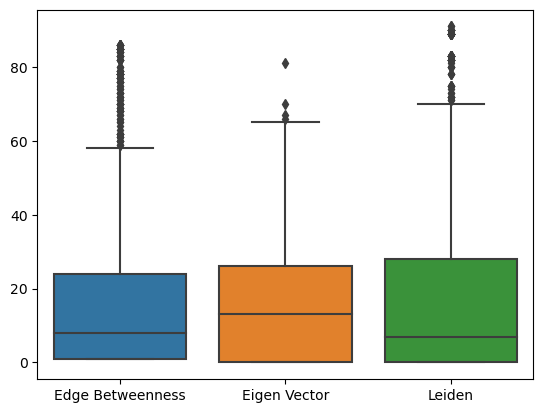

In [484]:
# Number of patients per community 5NN
eb_means = []
eb_mins = []
eb_max = []

ev_means = []
ev_mins = []
ev_max = []

l_means = []
l_mins = []
l_max = []

eb = []
ev = []
l = []

for id in graphs_to_explore:
    counts = np.array(list(g_5NN_summary["edge_betweenness"][id]["num_patients"].values()))
    eb_means.append(counts.mean())
    eb_mins.append(counts.min())
    eb_max.append(counts.max())
    if eb == []:
        eb = list(counts)
    else:
        eb = eb + list(counts) 

    counts = np.array(list(g_5NN_summary["eigen_vector"][id]["num_patients"].values()))
    ev_means.append(counts.mean())
    ev_mins.append(counts.min())
    ev_max.append(counts.max())
    if ev == []:
        ev = list(counts)
    else:
        ev = ev + list(counts) 

    counts = np.array(list(g_5NN_summary["leiden"][id]["num_patients"].values()))
    l_means.append(counts.mean())
    l_mins.append(counts.min())
    l_max.append(counts.max())
    if l == []:
        l = list(counts)
    else:
        l = l + list(counts) 

max_length = max(len(eb), len(ev), len(l))

if max_length - len(eb) > 0:
    eb = eb + [0] * (max_length - len(eb) )
if max_length - len(ev) > 0:
    ev = ev + [0] * (max_length - len(ev) )
if max_length - len(l) > 0:
    l = l + [0] * (max_length - len(l) )


print("eb min: ", np.array(eb_mins).mean() , " max: ", np.array(eb_max).mean(), " mean: ", np.array(eb_means).mean())
print("ev min: ", np.array(ev_mins).mean() , " max: ", np.array(ev_max).mean(), " mean: ", np.array(ev_means).mean())
print("l min: ", np.array(l_mins).mean() , " max: ", np.array(l_max).mean(), " mean: ", np.array(l_means).mean())

patients_per_community_5NN = pd.DataFrame(data = {"Edge Betweenness": eb, "Eigen Vector": ev, "Leiden": l})
sb.boxplot(data = patients_per_community_5NN)

eb min:  3.9371584699453552  max:  38.52732240437158  mean:  16.224043715846992
ev min:  13.959016393442623  max:  38.240437158469945  mean:  24.242714025500906
l min:  19.73497267759563  max:  39.81967213114754  mean:  29.62843481654957


<Axes: >

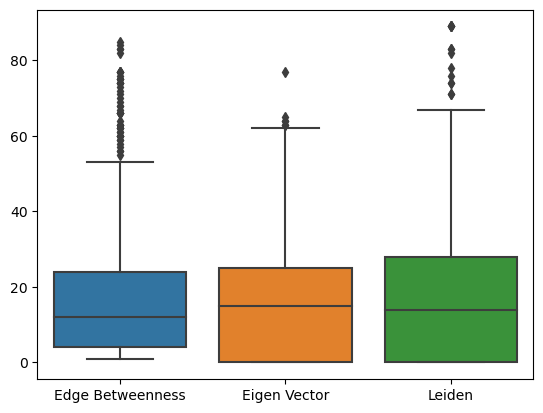

In [485]:
# Number of patients per community Corr
eb_means = []
eb_mins = []
eb_max = []

ev_means = []
ev_mins = []
ev_max = []

l_means = []
l_mins = []
l_max = []

eb = []
ev = []
l = []

for id in graphs_to_explore:
    counts = np.array(list(g_corr_summary["edge_betweenness"][id]["num_patients"].values()))
    eb_means.append(counts.mean())
    eb_mins.append(counts.min())
    eb_max.append(counts.max())
    if eb == []:
        eb = list(counts)
    else:
        eb = eb + list(counts) 

    counts = np.array(list(g_corr_summary["eigen_vector"][id]["num_patients"].values()))
    ev_means.append(counts.mean())
    ev_mins.append(counts.min())
    ev_max.append(counts.max())
    if ev == []:
        ev = list(counts)
    else:
        ev = ev + list(counts) 

    counts = np.array(list(g_corr_summary["leiden"][id]["num_patients"].values()))
    l_means.append(counts.mean())
    l_mins.append(counts.min())
    l_max.append(counts.max())
    if l == []:
        l = list(counts)
    else:
        l = l + list(counts) 

max_length = max(len(eb), len(ev), len(l))

if max_length - len(eb) > 0:
    eb = eb + [0] * (max_length - len(eb) )
if max_length - len(ev) > 0:
    ev = ev + [0] * (max_length - len(ev) )
if max_length - len(l) > 0:
    l = l + [0] * (max_length - len(l) )


print("eb min: ", np.array(eb_mins).mean() , " max: ", np.array(eb_max).mean(), " mean: ", np.array(eb_means).mean())
print("ev min: ", np.array(ev_mins).mean() , " max: ", np.array(ev_max).mean(), " mean: ", np.array(ev_means).mean())
print("l min: ", np.array(l_mins).mean() , " max: ", np.array(l_max).mean(), " mean: ", np.array(l_means).mean())

patients_per_community_corr = pd.DataFrame(data = {"Edge Betweenness": eb, "Eigen Vector": ev, "Leiden": l})
sb.boxplot(data = patients_per_community_corr)

### Small Communities

In [486]:
small_com_5NN = {"edge_betweenness": {"graphs": 0, "coms": 0}, "eigen_vector": {"graphs": 0, "coms": 0}, "leiden": {"graphs": 0, "coms": 0}}
small_com_corr = {"edge_betweenness": {"graphs": 0, "coms": 0}, "eigen_vector": {"graphs": 0, "coms": 0}, "leiden": {"graphs": 0, "coms": 0}}

for id in graphs_to_explore:
    if g_corr_summary["edge_betweenness"][id]["num_small_com"] > 0:
        small_com_corr["edge_betweenness"]["graphs"]+= 1
        small_com_corr["edge_betweenness"]["coms"]+= g_corr_summary["edge_betweenness"][id]["num_small_com"]

    if g_corr_summary["eigen_vector"][id]["num_small_com"] > 0:
        small_com_corr["eigen_vector"]["graphs"]+= 1
        small_com_corr["eigen_vector"]["coms"]+= g_corr_summary["eigen_vector"][id]["num_small_com"]
    
    if g_corr_summary["leiden"][id]["num_small_com"] > 0:
        small_com_corr["leiden"]["graphs"]+= 1
        small_com_corr["leiden"]["coms"]+= g_corr_summary["leiden"][id]["num_small_com"]

    if g_5NN_summary["edge_betweenness"][id]["num_small_com"] > 0:
        small_com_corr["edge_betweenness"]["graphs"]+= 1
        small_com_corr["edge_betweenness"]["coms"]+= g_5NN_summary["edge_betweenness"][id]["num_small_com"]

    if g_5NN_summary["eigen_vector"][id]["num_small_com"] > 0:
        small_com_corr["eigen_vector"]["graphs"]+= 1
        small_com_corr["eigen_vector"]["coms"]+= g_5NN_summary["eigen_vector"][id]["num_small_com"]
    
    if g_5NN_summary["leiden"][id]["num_small_com"] > 0:
        small_com_corr["leiden"]["graphs"]+= 1
        small_com_corr["leiden"]["coms"]+= g_5NN_summary["leiden"][id]["num_small_com"]

print("5NN", small_com_5NN)
print("corr", small_com_corr)

5NN {'edge_betweenness': {'graphs': 0, 'coms': 0}, 'eigen_vector': {'graphs': 0, 'coms': 0}, 'leiden': {'graphs': 0, 'coms': 0}}
corr {'edge_betweenness': {'graphs': 404, 'coms': 984}, 'eigen_vector': {'graphs': 36, 'coms': 45}, 'leiden': {'graphs': 2, 'coms': 3}}


### Number of Communities with different purity levels

In [487]:
for graph_id in graphs_to_explore:
    overview_df["corr_" + graph_id].append(np.array([1 for v in g_corr_summary["edge_betweenness"][graph_id]["com_disease_map_pure"].values() if not v == "none"]).sum())
    overview_df["corr_" + graph_id].append(np.array([1 for v in g_corr_summary["edge_betweenness"][graph_id]["com_disease_map_90pct"].values() if not v == "none"]).sum())
    overview_df["corr_" + graph_id].append(np.array([1 for v in g_corr_summary["edge_betweenness"][graph_id]["com_disease_map_80pct"].values() if not v == "none"]).sum())
    overview_df["corr_" + graph_id].append(np.array([1 for v in g_corr_summary["edge_betweenness"][graph_id]["com_disease_map_70pct"].values() if not v == "none"]).sum())

    overview_df["corr_" + graph_id].append(np.array([1 for v in g_corr_summary["eigen_vector"][graph_id]["com_disease_map_pure"].values() if not v == "none"]).sum())
    overview_df["corr_" + graph_id].append(np.array([1 for v in g_corr_summary["eigen_vector"][graph_id]["com_disease_map_90pct"].values() if not v == "none"]).sum())
    overview_df["corr_" + graph_id].append(np.array([1 for v in g_corr_summary["eigen_vector"][graph_id]["com_disease_map_80pct"].values() if not v == "none"]).sum())
    overview_df["corr_" + graph_id].append(np.array([1 for v in g_corr_summary["eigen_vector"][graph_id]["com_disease_map_70pct"].values() if not v == "none"]).sum())

    overview_df["corr_" + graph_id].append(np.array([1 for v in g_corr_summary["leiden"][graph_id]["com_disease_map_pure"].values() if not v == "none"]).sum())
    overview_df["corr_" + graph_id].append(np.array([1 for v in g_corr_summary["leiden"][graph_id]["com_disease_map_90pct"].values() if not v == "none"]).sum())
    overview_df["corr_" + graph_id].append(np.array([1 for v in g_corr_summary["leiden"][graph_id]["com_disease_map_80pct"].values() if not v == "none"]).sum())
    overview_df["corr_" + graph_id].append(np.array([1 for v in g_corr_summary["leiden"][graph_id]["com_disease_map_70pct"].values() if not v == "none"]).sum())

    overview_df["corr_" + graph_id].append(np.array([1 for v in g_corr_summary["edge_betweenness"][graph_id]["com_disease_group_map_pure"].values() if not v == "none"]).sum())
    overview_df["corr_" + graph_id].append(np.array([1 for v in g_corr_summary["edge_betweenness"][graph_id]["com_disease_group_map_90pct"].values() if not v == "none"]).sum())
    overview_df["corr_" + graph_id].append(np.array([1 for v in g_corr_summary["edge_betweenness"][graph_id]["com_disease_group_map_80pct"].values() if not v == "none"]).sum())
    overview_df["corr_" + graph_id].append(np.array([1 for v in g_corr_summary["edge_betweenness"][graph_id]["com_disease_group_map_70pct"].values() if not v == "none"]).sum())

    overview_df["corr_" + graph_id].append(np.array([1 for v in g_corr_summary["eigen_vector"][graph_id]["com_disease_group_map_pure"].values() if not v == "none"]).sum())
    overview_df["corr_" + graph_id].append(np.array([1 for v in g_corr_summary["eigen_vector"][graph_id]["com_disease_group_map_90pct"].values() if not v == "none"]).sum())
    overview_df["corr_" + graph_id].append(np.array([1 for v in g_corr_summary["eigen_vector"][graph_id]["com_disease_group_map_80pct"].values() if not v == "none"]).sum())
    overview_df["corr_" + graph_id].append(np.array([1 for v in g_corr_summary["eigen_vector"][graph_id]["com_disease_group_map_70pct"].values() if not v == "none"]).sum())

    overview_df["corr_" + graph_id].append(np.array([1 for v in g_corr_summary["leiden"][graph_id]["com_disease_group_map_pure"].values() if not v == "none"]).sum())
    overview_df["corr_" + graph_id].append(np.array([1 for v in g_corr_summary["leiden"][graph_id]["com_disease_group_map_90pct"].values() if not v == "none"]).sum())
    overview_df["corr_" + graph_id].append(np.array([1 for v in g_corr_summary["leiden"][graph_id]["com_disease_group_map_80pct"].values() if not v == "none"]).sum())
    overview_df["corr_" + graph_id].append(np.array([1 for v in g_corr_summary["leiden"][graph_id]["com_disease_group_map_70pct"].values() if not v == "none"]).sum())
      



    overview_df["5NN_" + graph_id].append(np.array([1 for v in g_5NN_summary["edge_betweenness"][graph_id]["com_disease_map_pure"].values() if not v == "none"]).sum())
    overview_df["5NN_" + graph_id].append(np.array([1 for v in g_5NN_summary["edge_betweenness"][graph_id]["com_disease_map_90pct"].values() if not v == "none"]).sum())
    overview_df["5NN_" + graph_id].append(np.array([1 for v in g_5NN_summary["edge_betweenness"][graph_id]["com_disease_map_80pct"].values() if not v == "none"]).sum())
    overview_df["5NN_" + graph_id].append(np.array([1 for v in g_5NN_summary["edge_betweenness"][graph_id]["com_disease_map_70pct"].values() if not v == "none"]).sum())

    overview_df["5NN_" + graph_id].append(np.array([1 for v in g_5NN_summary["eigen_vector"][graph_id]["com_disease_map_pure"].values() if not v == "none"]).sum())
    overview_df["5NN_" + graph_id].append(np.array([1 for v in g_5NN_summary["eigen_vector"][graph_id]["com_disease_map_90pct"].values() if not v == "none"]).sum())
    overview_df["5NN_" + graph_id].append(np.array([1 for v in g_5NN_summary["eigen_vector"][graph_id]["com_disease_map_80pct"].values() if not v == "none"]).sum())
    overview_df["5NN_" + graph_id].append(np.array([1 for v in g_5NN_summary["eigen_vector"][graph_id]["com_disease_map_70pct"].values() if not v == "none"]).sum())

    overview_df["5NN_" + graph_id].append(np.array([1 for v in g_5NN_summary["leiden"][graph_id]["com_disease_map_pure"].values() if not v == "none"]).sum())
    overview_df["5NN_" + graph_id].append(np.array([1 for v in g_5NN_summary["leiden"][graph_id]["com_disease_map_90pct"].values() if not v == "none"]).sum())
    overview_df["5NN_" + graph_id].append(np.array([1 for v in g_5NN_summary["leiden"][graph_id]["com_disease_map_80pct"].values() if not v == "none"]).sum())
    overview_df["5NN_" + graph_id].append(np.array([1 for v in g_5NN_summary["leiden"][graph_id]["com_disease_map_70pct"].values() if not v == "none"]).sum())

    overview_df["5NN_" + graph_id].append(np.array([1 for v in g_5NN_summary["edge_betweenness"][graph_id]["com_disease_group_map_pure"].values() if not v == "none"]).sum())
    overview_df["5NN_" + graph_id].append(np.array([1 for v in g_5NN_summary["edge_betweenness"][graph_id]["com_disease_group_map_90pct"].values() if not v == "none"]).sum())
    overview_df["5NN_" + graph_id].append(np.array([1 for v in g_5NN_summary["edge_betweenness"][graph_id]["com_disease_group_map_80pct"].values() if not v == "none"]).sum())
    overview_df["5NN_" + graph_id].append(np.array([1 for v in g_5NN_summary["edge_betweenness"][graph_id]["com_disease_group_map_70pct"].values() if not v == "none"]).sum())

    overview_df["5NN_" + graph_id].append(np.array([1 for v in g_5NN_summary["eigen_vector"][graph_id]["com_disease_group_map_pure"].values() if not v == "none"]).sum())
    overview_df["5NN_" + graph_id].append(np.array([1 for v in g_5NN_summary["eigen_vector"][graph_id]["com_disease_group_map_90pct"].values() if not v == "none"]).sum())
    overview_df["5NN_" + graph_id].append(np.array([1 for v in g_5NN_summary["eigen_vector"][graph_id]["com_disease_group_map_80pct"].values() if not v == "none"]).sum())
    overview_df["5NN_" + graph_id].append(np.array([1 for v in g_5NN_summary["eigen_vector"][graph_id]["com_disease_group_map_70pct"].values() if not v == "none"]).sum())

    overview_df["5NN_" + graph_id].append(np.array([1 for v in g_5NN_summary["leiden"][graph_id]["com_disease_group_map_pure"].values() if not v == "none"]).sum())
    overview_df["5NN_" + graph_id].append(np.array([1 for v in g_5NN_summary["leiden"][graph_id]["com_disease_group_map_90pct"].values() if not v == "none"]).sum())
    overview_df["5NN_" + graph_id].append(np.array([1 for v in g_5NN_summary["leiden"][graph_id]["com_disease_group_map_80pct"].values() if not v == "none"]).sum())
    overview_df["5NN_" + graph_id].append(np.array([1 for v in g_5NN_summary["leiden"][graph_id]["com_disease_group_map_70pct"].values() if not v == "none"]).sum())

In [488]:
pd.DataFrame(data=overview_df,index=index ).transpose().to_excel(os.path.join(tables,"overview.xlsx"))

### Counting the number of communities with 70% and 100% purity capturing each disease

In [489]:
# For the .xlsx file
edge_betweenness_df_5NN = {g: [] for g in graphs_to_explore}
eigen_vector_df_5NN = {g: [] for g in graphs_to_explore}
leiden_df_5NN = {g: [] for g in graphs_to_explore}


edge_betweenness_df_corr = {g: [] for g in graphs_to_explore}
eigen_vector_df_corr = {g: [] for g in graphs_to_explore}
leiden_df_corr = {g: [] for g in graphs_to_explore}

dfs = {"5NN":{"edge_betweenness": edge_betweenness_df_5NN, "eigen_vector":eigen_vector_df_5NN,  "leiden":leiden_df_5NN },
       "corr": {"edge_betweenness":edge_betweenness_df_corr,  "eigen_vector":eigen_vector_df_corr, "leiden":leiden_df_corr }}

index = ["num_com", "num_small_com", "num_com_HEALTHY", "num_com_COVID", "num_com_SEPSIS", "num_com_sepsis", "num_com_hcw", "num_com_covid_sev", "num_com_hv", "num_com_covid_crit", "num_com_covid_mild", "num_com_covid_conv",
          "num_com_HEALTHY_pure", "num_com_COVID_pure", "num_com_SEPSIS_pure", "num_com_sepsis_pure", "num_com_hcw_pure", "num_com_covid_sev_pure", "num_com_hv_pure", "num_com_covid_crit_pure", "num_com_covid_mild_pure", "num_com_covid_conv_pure" ]


# For the plots
diseases_5NN_edge_betweenness = {}
disease_groups_5NN_edge_betweenness = {}
diseases_corr_edge_betweenness = {}
disease_groups_corr_edge_betweenness = {}

diseases_5NN_eigen_vector = {}
disease_groups_5NN_eigen_vector = {}
diseases_corr_eigen_vector = {}
disease_groups_corr_eigen_vector = {}

diseases_5NN_leiden= {}
disease_groups_5NN_leiden = {}
diseases_corr_leiden = {}
disease_groups_corr_leiden= {}

diseases_5NN_edge_betweenness_pure = {}
disease_groups_5NN_edge_betweenness_pure = {}
diseases_corr_edge_betweenness_pure = {}
disease_groups_corr_edge_betweenness_pure = {}

diseases_5NN_eigen_vector_pure = {}
disease_groups_5NN_eigen_vector_pure = {}
diseases_corr_eigen_vector_pure = {}
disease_groups_corr_eigen_vector_pure = {}

diseases_5NN_leiden_pure = {}
disease_groups_5NN_leiden_pure = {}
diseases_corr_leiden_pure = {}
disease_groups_corr_leiden_pure = {}

diseases_plots = {"5NN":{"edge_betweenness": diseases_5NN_edge_betweenness, "eigen_vector":diseases_5NN_eigen_vector, "leiden":diseases_5NN_leiden },
       "corr": {"edge_betweenness":diseases_corr_edge_betweenness, "eigen_vector":diseases_corr_eigen_vector,  "leiden":diseases_corr_leiden }}

diseases_plots_pure = {"5NN":{"edge_betweenness": diseases_5NN_edge_betweenness_pure, "eigen_vector":diseases_5NN_eigen_vector_pure, "leiden":diseases_5NN_leiden_pure },
       "corr": {"edge_betweenness":diseases_corr_edge_betweenness_pure, "eigen_vector":diseases_corr_eigen_vector_pure,  "leiden":diseases_corr_leiden_pure }}

d_index = list(g_corr_summary["edge_betweenness"]["G0"]["num_com_with_disease"]["70pct"].keys())

disease_groups_plots = {"5NN":{"edge_betweenness": disease_groups_5NN_edge_betweenness, "eigen_vector":disease_groups_5NN_eigen_vector, "leiden":disease_groups_5NN_leiden },
       "corr": {"edge_betweenness":disease_groups_corr_edge_betweenness, "eigen_vector":disease_groups_corr_eigen_vector,  "leiden":disease_groups_corr_leiden }}

disease_groups_plots_pure = {"5NN":{"edge_betweenness": disease_groups_5NN_edge_betweenness_pure, "eigen_vector":disease_groups_5NN_eigen_vector_pure, "leiden":disease_groups_5NN_leiden_pure },
       "corr": {"edge_betweenness":disease_groups_corr_edge_betweenness_pure, "eigen_vector":disease_groups_corr_eigen_vector_pure,  "leiden":disease_groups_corr_leiden_pure }}

dg_index =  list(g_corr_summary["edge_betweenness"]["G0"]["num_com_with_disease_group"]["70pct"].keys())

In [ ]:
for graph_type, graph_type_dfs in dfs.items():
    if graph_type == "5NN":
        g = g_5NN_summary
    else:
        g = g_corr_summary
    for alg_type_name, alg_type_df in graph_type_dfs.items():
        graphs_data = g[alg_type_name]
        for graph_id, graph_data in graphs_data.items():
            alg_type_df[graph_id].append(graph_data["num_com"])
            alg_type_df[graph_id].append(graph_data["num_small_com"])

            alg_type_df[graph_id].append(graph_data["num_com_with_disease_group"]["70pct"]["Healthy"])
            alg_type_df[graph_id].append(graph_data["num_com_with_disease_group"]["70pct"]["Covid"])
            alg_type_df[graph_id].append(graph_data["num_com_with_disease_group"]["70pct"]["Sepsis"])

            alg_type_df[graph_id].append(graph_data["num_com_with_disease"]["70pct"]["Sepsis"])
            alg_type_df[graph_id].append(graph_data["num_com_with_disease"]["70pct"]["COVID_HCW"])
            alg_type_df[graph_id].append(graph_data["num_com_with_disease"]["70pct"]["COVID_SEV"])
            alg_type_df[graph_id].append(graph_data["num_com_with_disease"]["70pct"]["HV"])
            alg_type_df[graph_id].append(graph_data["num_com_with_disease"]["70pct"]["COVID_CRIT"])
            alg_type_df[graph_id].append(graph_data["num_com_with_disease"]["70pct"]["COVID_MILD"])
            alg_type_df[graph_id].append(graph_data["num_com_with_disease"]["70pct"]["COVID_CONV"])

            alg_type_df[graph_id].append(graph_data["num_com_with_disease_group"]["pure"]["Healthy"])
            alg_type_df[graph_id].append(graph_data["num_com_with_disease_group"]["pure"]["Covid"])
            alg_type_df[graph_id].append(graph_data["num_com_with_disease_group"]["pure"]["Sepsis"])

            alg_type_df[graph_id].append(graph_data["num_com_with_disease"]["pure"]["Sepsis"])
            alg_type_df[graph_id].append(graph_data["num_com_with_disease"]["pure"]["COVID_HCW"])
            alg_type_df[graph_id].append(graph_data["num_com_with_disease"]["pure"]["COVID_SEV"])
            alg_type_df[graph_id].append(graph_data["num_com_with_disease"]["pure"]["HV"])
            alg_type_df[graph_id].append(graph_data["num_com_with_disease"]["pure"]["COVID_CRIT"])
            alg_type_df[graph_id].append(graph_data["num_com_with_disease"]["pure"]["COVID_MILD"])
            alg_type_df[graph_id].append(graph_data["num_com_with_disease"]["pure"]["COVID_CONV"])

            diseases_plots[graph_type][alg_type_name][graph_id]= list(graph_data["num_com_with_disease"]["70pct"].values())
            disease_groups_plots[graph_type][alg_type_name][graph_id]= list(graph_data["num_com_with_disease_group"]["70pct"].values())
            diseases_plots_pure[graph_type][alg_type_name][graph_id]= list(graph_data["num_com_with_disease"]["pure"].values())
            disease_groups_plots_pure[graph_type][alg_type_name][graph_id]= list(graph_data["num_com_with_disease_group"]["pure"].values())


        df_d = pd.DataFrame(data= diseases_plots[graph_type][alg_type_name], index=d_index).transpose()
        df_d_pure = pd.DataFrame(data= diseases_plots_pure[graph_type][alg_type_name], index=d_index).transpose()
        #upper_d = df_d.to_numpy().flatten().max()
        #lower_d = df_d.to_numpy().flatten().min()

        df_dg = pd.DataFrame(data= disease_groups_plots[graph_type][alg_type_name], index=dg_index).transpose()
        df_dg_pure = pd.DataFrame(data= disease_groups_plots_pure[graph_type][alg_type_name], index=dg_index).transpose()
        #upper_dg = df_dg.to_numpy().flatten().max()
        #lower_dg = df_dg.to_numpy().flatten().min()

        data = {gt: [c/ g[alg_type_name][gt]["num_com"] for c in counts]  for gt, counts in diseases_plots[graph_type][alg_type_name].items()}
        df_d_pct = pd.DataFrame(data= data, index=d_index).transpose()

        data = {gt: [c/ g[alg_type_name][gt]["num_com"] for c in counts]  for gt, counts in diseases_plots_pure[graph_type][alg_type_name].items()}
        df_d_pct_pure = pd.DataFrame(data= data, index=d_index).transpose()
        #upper_d_pct = df_d_pct.to_numpy().flatten().max()
        #lower_d_pct = df_d_pct.to_numpy().flatten().min()

        data = {gt: [c/ g[alg_type_name][gt]["num_com"] for c in counts]  for gt, counts in disease_groups_plots[graph_type][alg_type_name].items()}
        df_dg_pct = pd.DataFrame(data= data, index=dg_index).transpose()

        data = {gt: [c/ g[alg_type_name][gt]["num_com"] for c in counts]  for gt, counts in disease_groups_plots_pure[graph_type][alg_type_name].items()}
        df_dg_pct_pure = pd.DataFrame(data= data, index=dg_index).transpose()
        #upper_dg_pct = df_dg_pct.to_numpy().flatten().max()
        #lower_dg_pct =  df_dg_pct.to_numpy().flatten().min()

        fig_dg,ax_dg=plt.subplots(figsize=(20,20))
        sb.heatmap(df_dg, cmap = "Greys", robust = False, linewidth=.5, linecolor = "grey", cbar_kws={"shrink": 0.4}, ax= ax_dg)
        fig_dg.savefig(os.path.join( plots, "dg_" + graph_type+ "_"+ alg_type_name) )

        fig_d,ax_d=plt.subplots(figsize=(20,20))
        sb.heatmap(df_d, cmap ='Greys', robust = False, linewidth=.5, linecolor = "grey", cbar_kws={"shrink": 0.4}, ax= ax_d)
        fig_d.savefig(os.path.join(plots, "d_" + graph_type+ "_"+ alg_type_name) )
        
        fig_dg_pct,ax_dg_pct = plt.subplots(figsize=(20,20))
        sb.swarmplot(data=df_dg_pct, ax = ax_dg_pct)
        fig_dg_pct.savefig(os.path.join(plots, "dg_pct_" + graph_type+ "_"+ alg_type_name) )

        fig_d_pct,ax_d_pct = plt.subplots(figsize=(20,20))
        sb.swarmplot(data=df_d_pct,ax =  ax_d_pct)
        fig_d_pct.savefig(os.path.join(plots, "d_pct_" + graph_type+ "_"+ alg_type_name) )

        fig_dg_pure,ax_dg_pure=plt.subplots(figsize=(20,20))
        sb.heatmap(df_dg_pure, cmap = "Greys", robust = False, linewidth=.5, linecolor = "grey", cbar_kws={"shrink": 0.4}, ax= ax_dg_pure)
        fig_dg_pure.savefig(os.path.join( plots, "dg_pure_" + graph_type+ "_"+ alg_type_name) )

        fig_d_pure,ax_d_pure=plt.subplots(figsize=(20,20))
        sb.heatmap(df_d_pure, cmap ='Greys', robust = False, linewidth=.5, linecolor = "grey", cbar_kws={"shrink": 0.4}, ax= ax_d_pure)
        fig_d_pure.savefig(os.path.join(plots, "d_pure_" + graph_type+ "_"+ alg_type_name) )
        
        fig_dg_pct_pure,ax_dg_pct_pure = plt.subplots(figsize=(20,20))
        sb.swarmplot(data=df_dg_pct_pure, ax = ax_dg_pct_pure)
        fig_dg_pct_pure.savefig(os.path.join(plots, "dg_pct_pure_" + graph_type+ "_"+ alg_type_name) )

        fig_d_pct_pure,ax_d_pct_pure = plt.subplots(figsize=(20,20))
        sb.swarmplot(data=df_d_pct_pure,ax =  ax_d_pct_pure)
        fig_d_pct_pure.savefig(os.path.join(plots, "d_pct_pure_" + graph_type+ "_"+ alg_type_name) )

In [491]:
type = ["5NN", "corr"]
alg = ["edge_betweenness", "eigen_vector", "leiden"]
for t in type:
    for a in alg:
        pd.DataFrame(data = dfs[t][a], index = index).to_excel(os.path.join(tables,t + "-" + a+ ".xlsx"))

In [492]:
pure_d = ["num_com_covid_conv_pure", "num_com_covid_mild_pure", "num_com_covid_crit_pure", "num_com_hv_pure","num_com_covid_sev_pure",  "num_com_hcw_pure", "num_com_sepsis_pure"] # 15-21
pure_dg = ["num_com_HEALTHY_pure", "num_com_COVID_pure", "num_com_SEPSIS_pure" ] #12-14

In [493]:
eb_5NN = pd.read_excel(os.path.join(tables,"5NN-edge_betweenness.xlsx")).set_index("Unnamed: 0")
eb_corr = pd.read_excel(os.path.join(tables,"corr-edge_betweenness.xlsx")).set_index("Unnamed: 0")

ev_5NN = pd.read_excel(os.path.join(tables,"5NN-eigen_vector.xlsx")).set_index("Unnamed: 0")
ev_corr = pd.read_excel(os.path.join(tables,"corr-eigen_vector.xlsx")).set_index("Unnamed: 0")

l_5NN = pd.read_excel(os.path.join(tables,"5NN-leiden.xlsx")).set_index("Unnamed: 0")
l_corr = pd.read_excel(os.path.join(tables,"corr-leiden.xlsx")).set_index("Unnamed: 0")

In [494]:
print("eb: ", eb_5NN.loc[pure_d].mean().mean(), "\n ev: " , ev_5NN.loc[pure_d].mean().mean(), "\n l: " , l_5NN.loc[pure_d].mean().mean())

eb:  0.020686963309914125 
 ev:  0.0019516003122560497 
 l:  0.00234192037470726


In [495]:
print("eb: ", eb_corr.loc[pure_d].mean().mean(), "\n ev: " , ev_corr.loc[pure_d].mean().mean(), "\n l: " , l_corr.loc[pure_d].mean().mean())

eb:  0.02498048399687744 
 ev:  0.00117096018735363 
 l:  0.00078064012490242


In [496]:
print("eb: ", eb_5NN.loc[pure_dg].mean().mean(), "\n ev: " , ev_5NN.loc[pure_dg].mean().mean(), "\n l: " , l_5NN.loc[pure_dg].mean().mean())

eb:  0.18032786885245902 
 ev:  0.06739526411657558 
 l:  0.02641165755919854


In [497]:
print("eb: ", eb_corr.loc[pure_dg].mean().mean(), "\n ev: " , ev_corr.loc[pure_dg].mean().mean(), "\n l: " , l_corr.loc[pure_dg].mean().mean())

eb:  0.22404371584699453 
 ev:  0.09016393442622951 
 l:  0.04371584699453552


<Axes: >

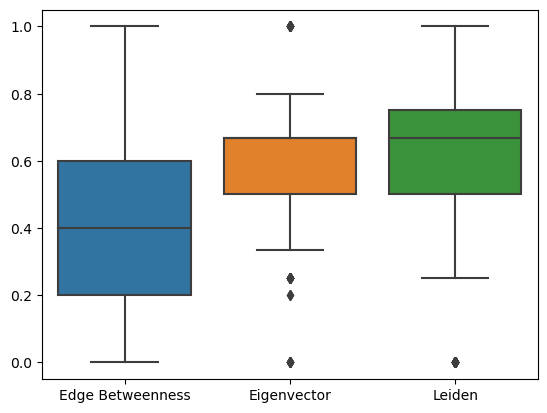

In [498]:
# 70% Disease Groups
data = {'Edge Betweenness': [], 'Eigenvector': [], 'Leiden': []}
for id in graphs_to_explore:
    data["Edge Betweenness"].append(sum(list(g_5NN_summary["edge_betweenness"][id]["num_com_with_disease_group"]["70pct"].values()))/ g_5NN_summary["edge_betweenness"][id]["num_com"])
    data["Eigenvector"].append(sum(list(g_5NN_summary["eigen_vector"][id]["num_com_with_disease_group"]["70pct"].values()))/ g_5NN_summary["eigen_vector"][id]["num_com"])
    data["Leiden"].append(sum(list(g_5NN_summary["leiden"][id]["num_com_with_disease_group"]["70pct"].values()))/ g_5NN_summary["leiden"][id]["num_com"])

df = pd.DataFrame(data)
sb.boxplot(df)

<Axes: >

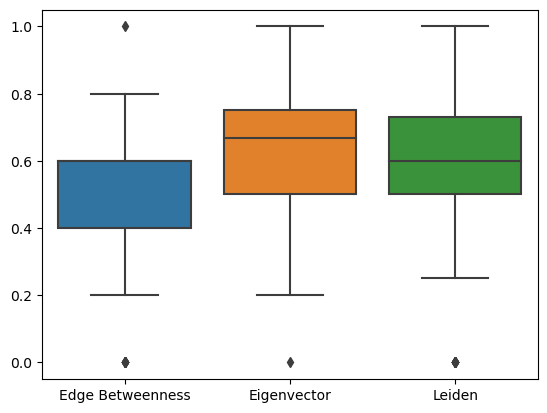

In [499]:
# 70% Disease Groups
data = {'Edge Betweenness': [], 'Eigenvector': [], 'Leiden': []}
for id in graphs_to_explore:
    data["Edge Betweenness"].append(sum(list(g_corr_summary["edge_betweenness"][id]["num_com_with_disease_group"]["70pct"].values()))/ g_corr_summary["edge_betweenness"][id]["num_com"])
    data["Eigenvector"].append(sum(list(g_corr_summary["eigen_vector"][id]["num_com_with_disease_group"]["70pct"].values()))/ g_corr_summary["eigen_vector"][id]["num_com"])
    data["Leiden"].append(sum(list(g_corr_summary["leiden"][id]["num_com_with_disease_group"]["70pct"].values()))/ g_corr_summary["leiden"][id]["num_com"])

df = pd.DataFrame(data)
sb.boxplot(df)

### Patient diseases per community

IndexError: index 5 is out of bounds for axis 0 with size 5

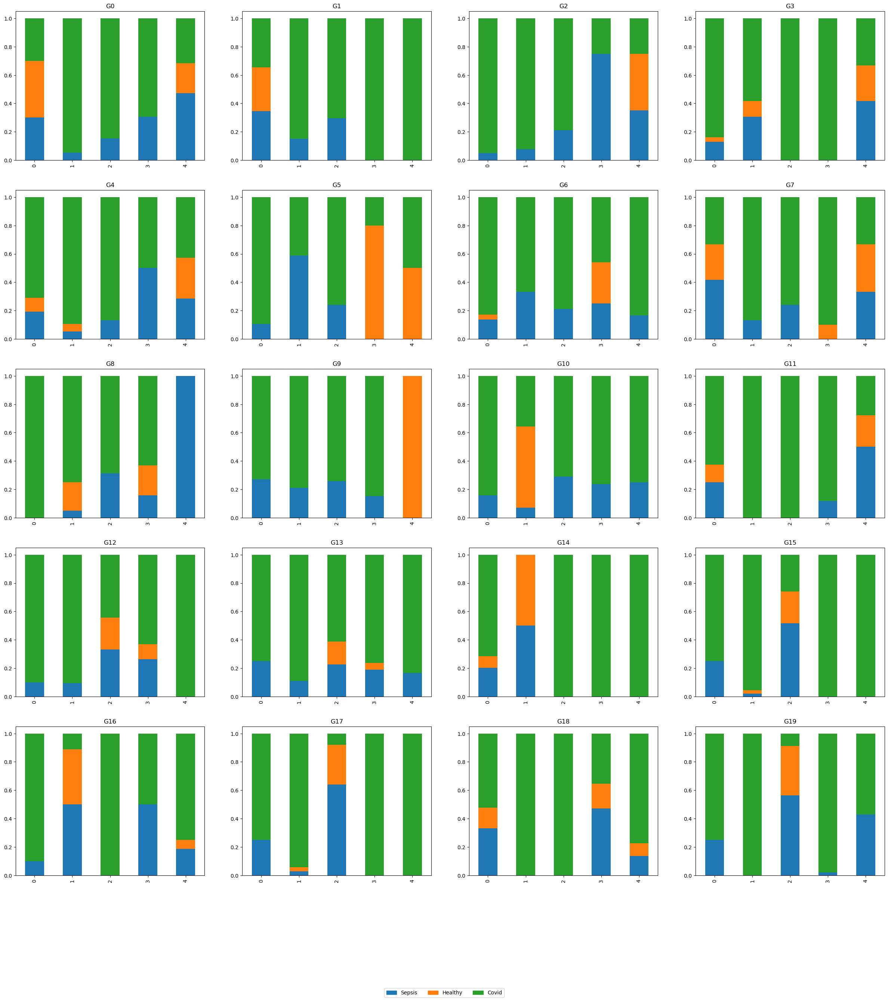

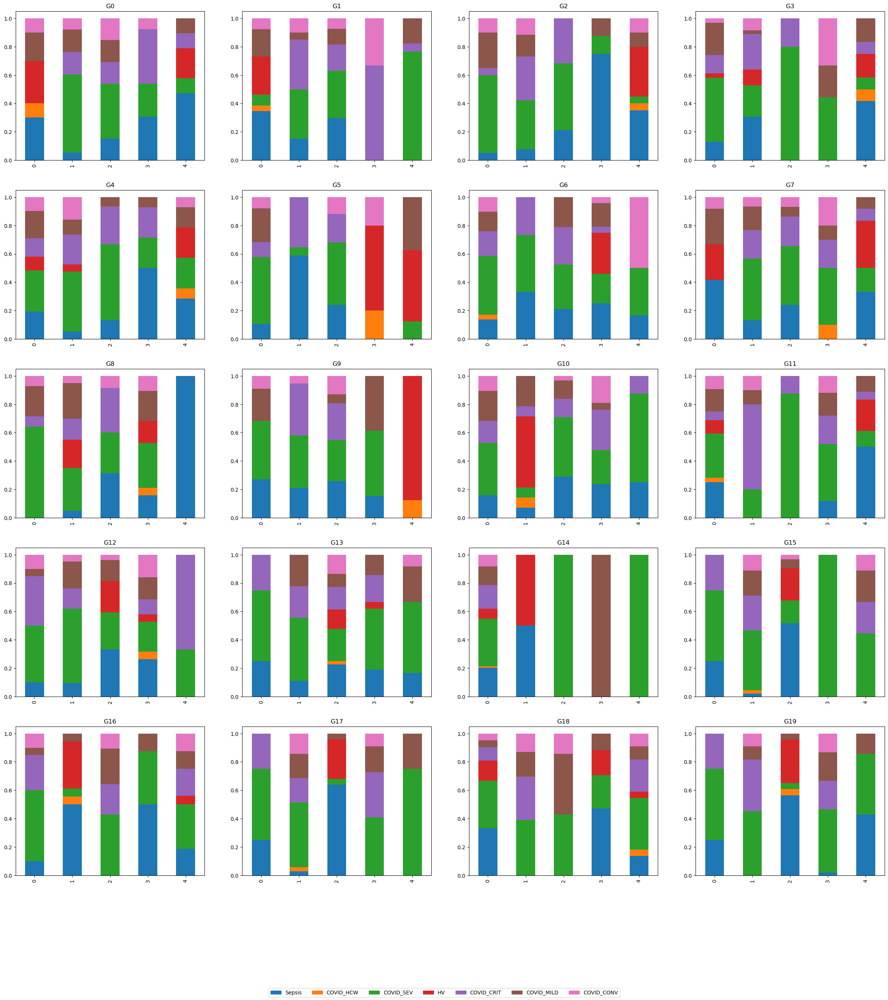

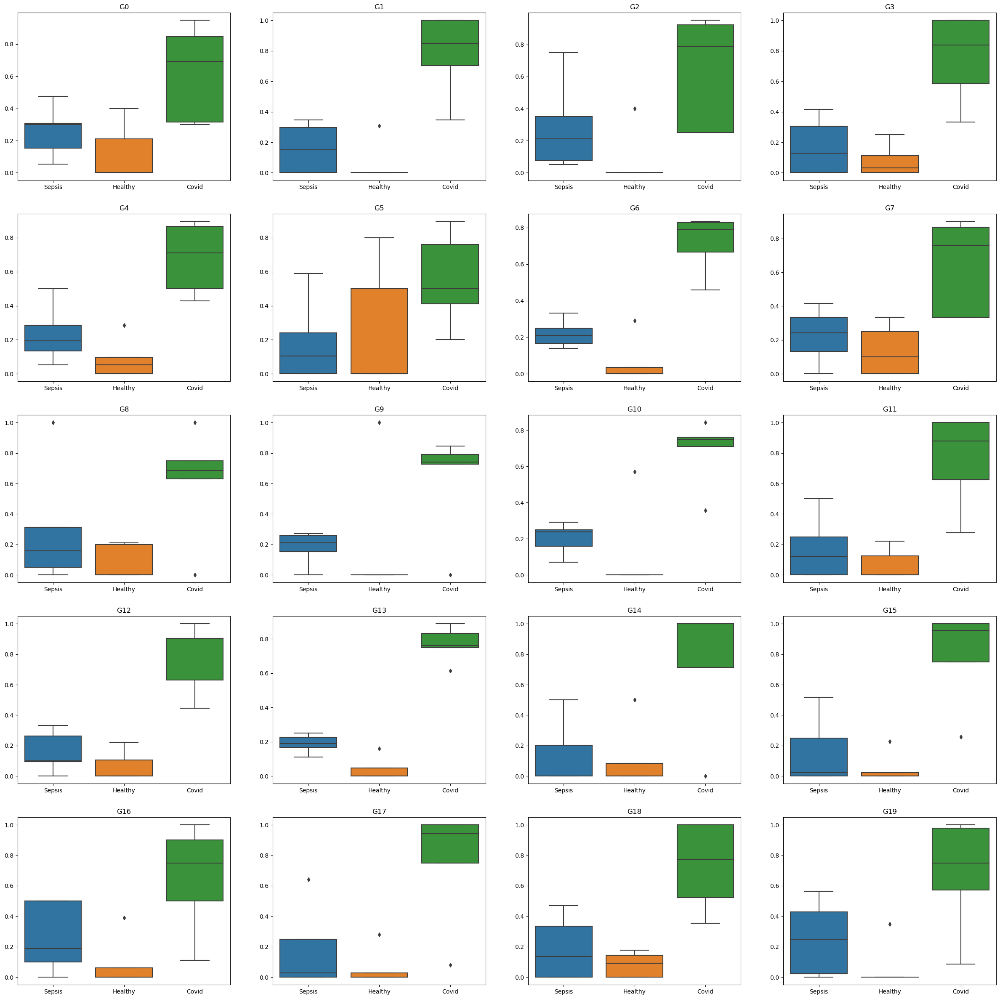

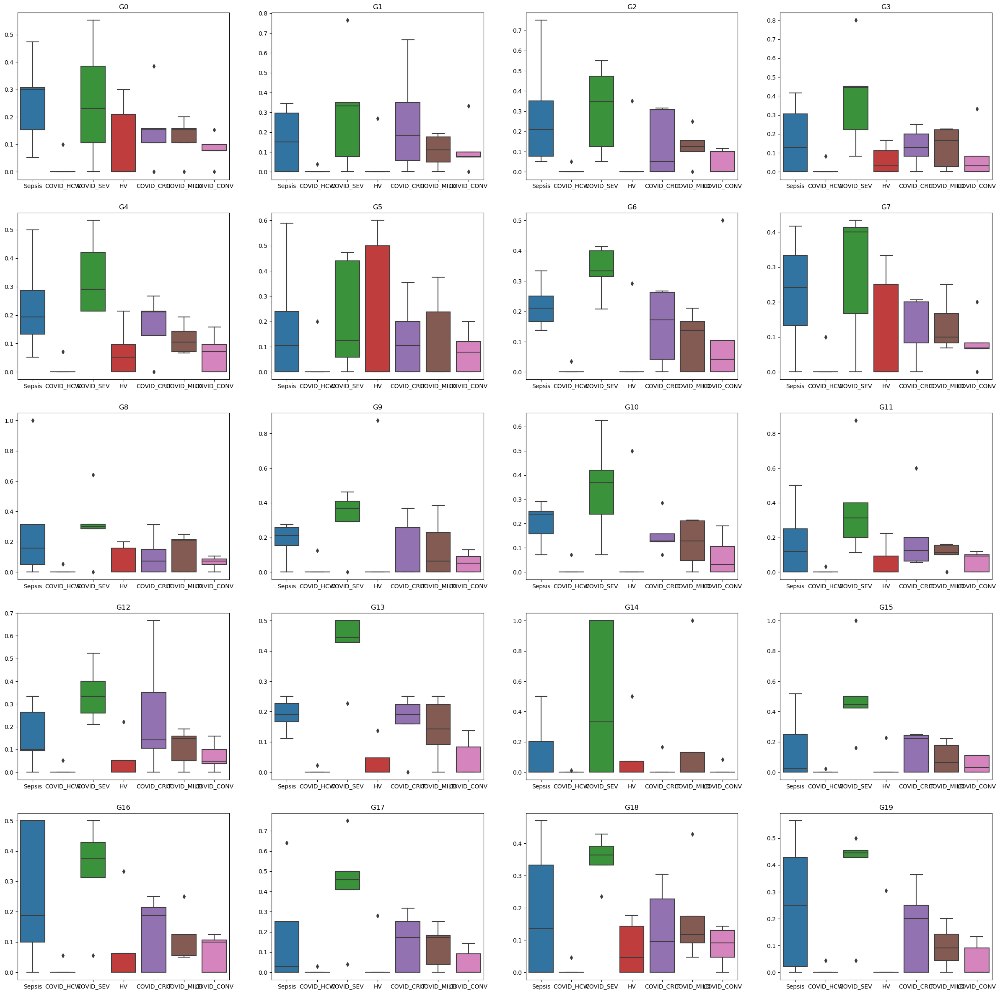

In [500]:
for graph_type, graph_type_dfs in dfs.items():
    if graph_type == "5NN":
        g = g_5NN_summary
    else:
        g = g_corr_summary

    for alg_type_name, alg_type_df in graph_type_dfs.items():
        plot_pos = {"row": 0, "col": 0}
        fig_dg, ax_dg = plt.subplots(5,4, figsize=(30,30))
        fig_d, ax_d = plt.subplots(5,4, figsize=(30,30))
        fig_dg_box, ax_dg_box = plt.subplots(5,4, figsize=(30,30))
        fig_d_box, ax_d_box = plt.subplots(5,4, figsize=(30,30))

        graphs_data = g[alg_type_name]
        for graph_id, graph_data in graphs_data.items():
            
            data_dg = {k:list(v.values()) for k, v in graph_data["com_disease_group_distr_map"].items()}
            data_d = {k:list(v.values()) for k, v in graph_data["com_disease_distr_map"].items()}

            dg_df = pd.DataFrame(data = data_dg, index = disease_groups).transpose()
            dg_df.plot(kind='bar', stacked=True, ax=ax_dg[plot_pos["row"],plot_pos["col"]], legend = False )
            ax_dg[plot_pos["row"],plot_pos["col"]].set_title(graph_id)
            if graph_id == "G0":
                # Get colours for current style
                colours = plt.rcParams['axes.prop_cycle'].by_key()['color']
                # Set up handles (the bits that are drawn in the legend) and labels
                handles = []
                group_labels = disease_groups
                for group_idx in range(len(group_labels)):
                    # Create a simple patch that is the correct colour
                    colour = colours[group_idx]
                    handles.append(Patch(edgecolor=colour, facecolor=colour, fill=True))
                # Acutally create our figure legend, using the above handles and labels
                loc='lower center'
                ncol=len(group_labels)
                fig_dg.legend(handles=handles, labels=group_labels, loc=loc, ncol=ncol)

            sb.boxplot(data=dg_df, ax = ax_dg_box[plot_pos["row"],plot_pos["col"]])
            ax_dg_box[plot_pos["row"],plot_pos["col"]].set_title(graph_id)

            d_df = pd.DataFrame(data = data_d, index = diseases).transpose()
            d_df.plot(kind='bar', stacked=True, ax=ax_d[plot_pos["row"],plot_pos["col"]], legend = False )
            ax_d[plot_pos["row"],plot_pos["col"]].set_title(graph_id)
            if graph_id == "G0":
                # Get colours for current style
                colours = plt.rcParams['axes.prop_cycle'].by_key()['color']
                # Set up handles (the bits that are drawn in the legend) and labels
                handles = []
                group_labels = diseases
                for group_idx in range(len(group_labels)):
                    # Create a simple patch that is the correct colour
                    colour = colours[group_idx]
                    handles.append(Patch(edgecolor=colour, facecolor=colour, fill=True))
                # Acutally create our figure legend, using the above handles and labels
                loc='lower center'
                ncol=len(group_labels)
                fig_d.legend(handles=handles, labels=group_labels, loc=loc, ncol=ncol)
            
            sb.boxplot(data=d_df, ax = ax_d_box[plot_pos["row"],plot_pos["col"]])
            ax_d_box[plot_pos["row"],plot_pos["col"]].set_title(graph_id)

            #update position in plot
            plot_pos["col"] += 1
            if plot_pos["col"] == 4:
                plot_pos["col"] = 0 
                plot_pos["row"] += 1


        fig_dg.savefig(os.path.join(plots, "dg_p_distr_" + graph_type+ "_"+ alg_type_name) )
        fig_d.savefig(os.path.join(plots, "d_p_distr_" + graph_type+ "_"+ alg_type_name) )
        fig_dg_box.savefig(os.path.join(plots, "dg_p_distr_box_" + graph_type+ "_"+ alg_type_name) )
        fig_d_box.savefig(os.path.join(plots, "d_p_distr_box_" + graph_type+ "_"+ alg_type_name) )

Text(0.5, 1.0, 'Leiden')

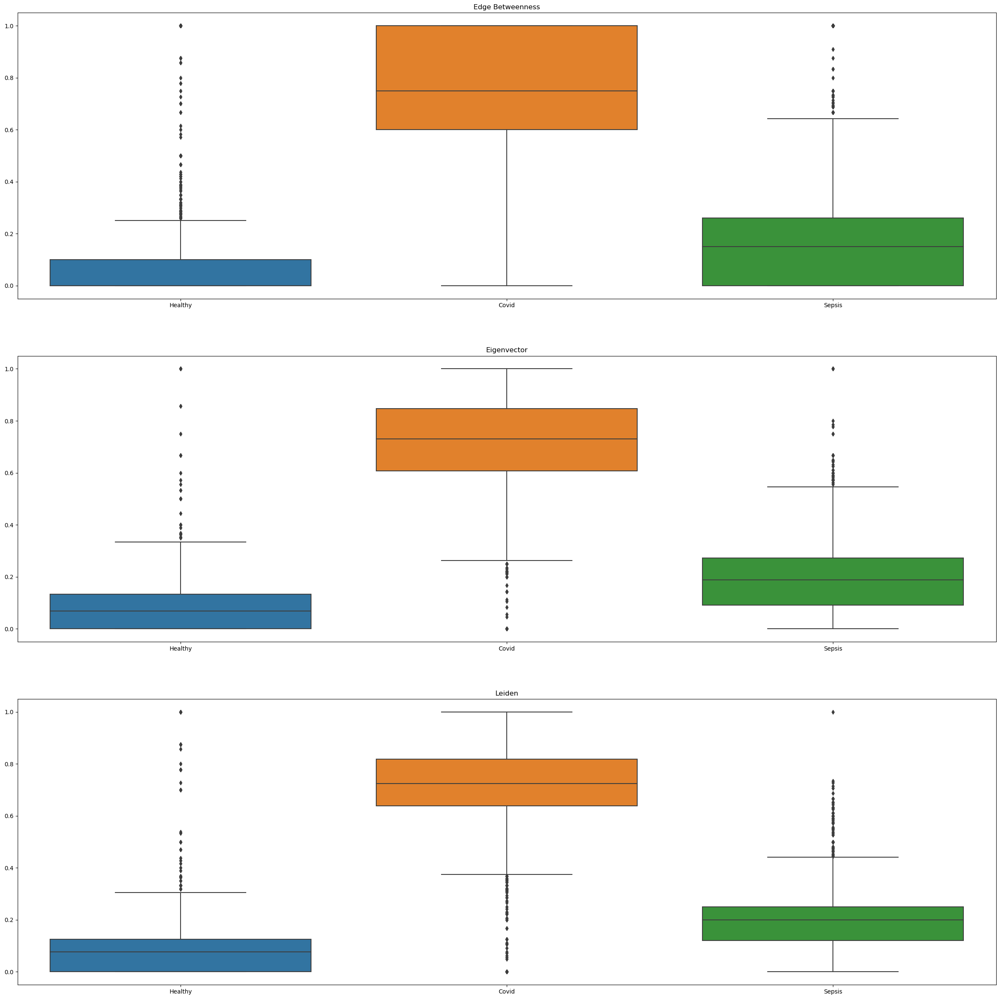

In [501]:
fig, ax = plt.subplots(3, figsize=(30,30))

eigenvector_5NN = {"Healthy":[], "Covid":[], "Sepsis":[]}
edge_betweenness_5NN = {"Healthy":[], "Covid":[], "Sepsis":[]}
leiden_5NN = {"Healthy":[], "Covid":[], "Sepsis":[]}

for id in graphs_to_explore:
    coms = g_5NN_summary["leiden"][id]["com_disease_group_distr_map"]
    for c in coms.values():
        for dg, pct in c.items():
            leiden_5NN[dg].append(pct)

    coms = g_5NN_summary["edge_betweenness"][id]["com_disease_group_distr_map"]
    for c in coms.values():
        for dg, pct in c.items():
            edge_betweenness_5NN[dg].append(pct)

    coms = g_5NN_summary["eigen_vector"][id]["com_disease_group_distr_map"]
    for c in coms.values():
        for dg, pct in c.items():
            eigenvector_5NN[dg].append(pct)

sb.boxplot(data = pd.DataFrame(edge_betweenness_5NN), ax = ax[0])
ax[0].set_title("Edge Betweenness")
sb.boxplot(data = pd.DataFrame(eigenvector_5NN), ax = ax[1])
ax[1].set_title("Eigenvector")
sb.boxplot(data = pd.DataFrame(leiden_5NN), ax = ax[2])
ax[2].set_title("Leiden")

Text(0.5, 1.0, 'Leiden')

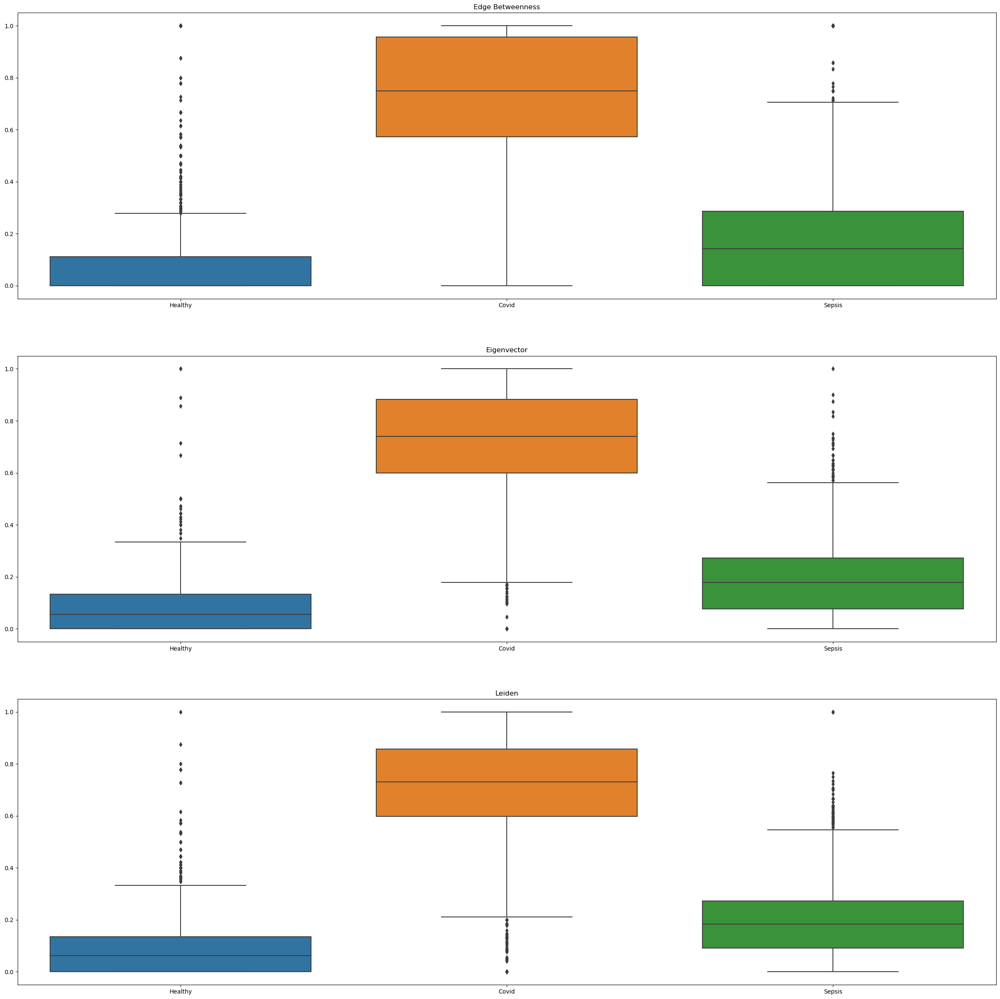

In [502]:
fig, ax = plt.subplots(3, figsize=(30,30))

eigenvector_corr = {"Healthy":[], "Covid":[], "Sepsis":[]}
edge_betweenness_corr = {"Healthy":[], "Covid":[], "Sepsis":[]}
leiden_corr = {"Healthy":[], "Covid":[], "Sepsis":[]}

for id in graphs_to_explore:
    coms = g_corr_summary["leiden"][id]["com_disease_group_distr_map"]
    for c in coms.values():
        for dg, pct in c.items():
            leiden_corr[dg].append(pct)

    coms = g_corr_summary["edge_betweenness"][id]["com_disease_group_distr_map"]
    for c in coms.values():
        for dg, pct in c.items():
            edge_betweenness_corr[dg].append(pct)

    coms = g_corr_summary["eigen_vector"][id]["com_disease_group_distr_map"]
    for c in coms.values():
        for dg, pct in c.items():
            eigenvector_corr[dg].append(pct)

sb.boxplot(data = pd.DataFrame(edge_betweenness_corr), ax = ax[0])
ax[0].set_title("Edge Betweenness")
sb.boxplot(data = pd.DataFrame(eigenvector_corr), ax = ax[1])
ax[1].set_title("Eigenvector")
sb.boxplot(data = pd.DataFrame(leiden_corr), ax = ax[2])
ax[2].set_title("Leiden")

Text(0.5, 1.0, 'Leiden')

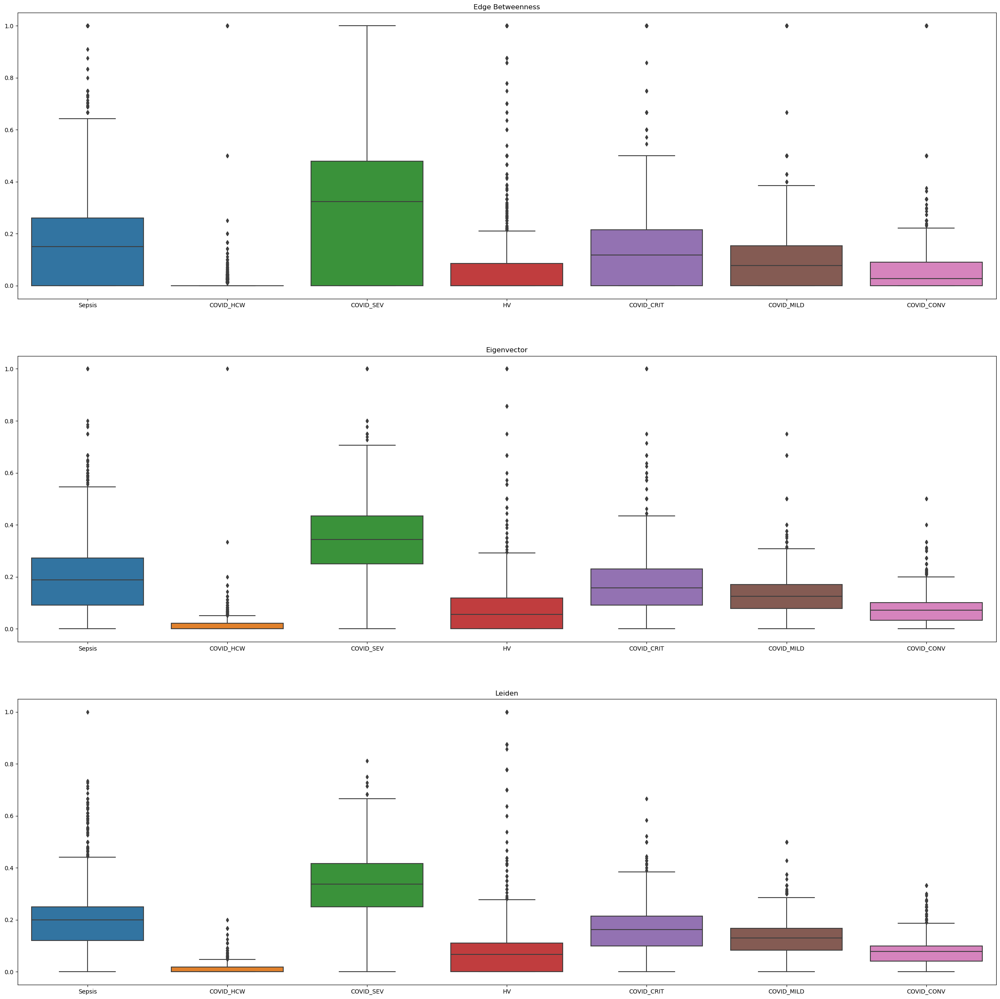

In [514]:
fig, ax = plt.subplots(3, figsize=(30,30))

eigenvector_5NN = {d: [] for d in diseases}
edge_betweenness_5NN = {d: [] for d in diseases}
leiden_5NN = {d: [] for d in diseases}

for id in graphs_to_explore:
    coms = g_5NN_summary["leiden"][id]["com_disease_distr_map"]
    for c in coms.values():
        for dg, pct in c.items():
            leiden_5NN[dg].append(pct)

    coms = g_5NN_summary["edge_betweenness"][id]["com_disease_distr_map"]
    for c in coms.values():
        for dg, pct in c.items():
            edge_betweenness_5NN[dg].append(pct)

    coms = g_5NN_summary["eigen_vector"][id]["com_disease_distr_map"]
    for c in coms.values():
        for dg, pct in c.items():
            eigenvector_5NN[dg].append(pct)

sb.boxplot(data = pd.DataFrame(edge_betweenness_5NN), ax = ax[0])
ax[0].set_title("Edge Betweenness")
sb.boxplot(data = pd.DataFrame(eigenvector_5NN), ax = ax[1])
ax[1].set_title("Eigenvector")
sb.boxplot(data = pd.DataFrame(leiden_5NN), ax = ax[2])
ax[2].set_title("Leiden")

Text(0.5, 1.0, 'Leiden')

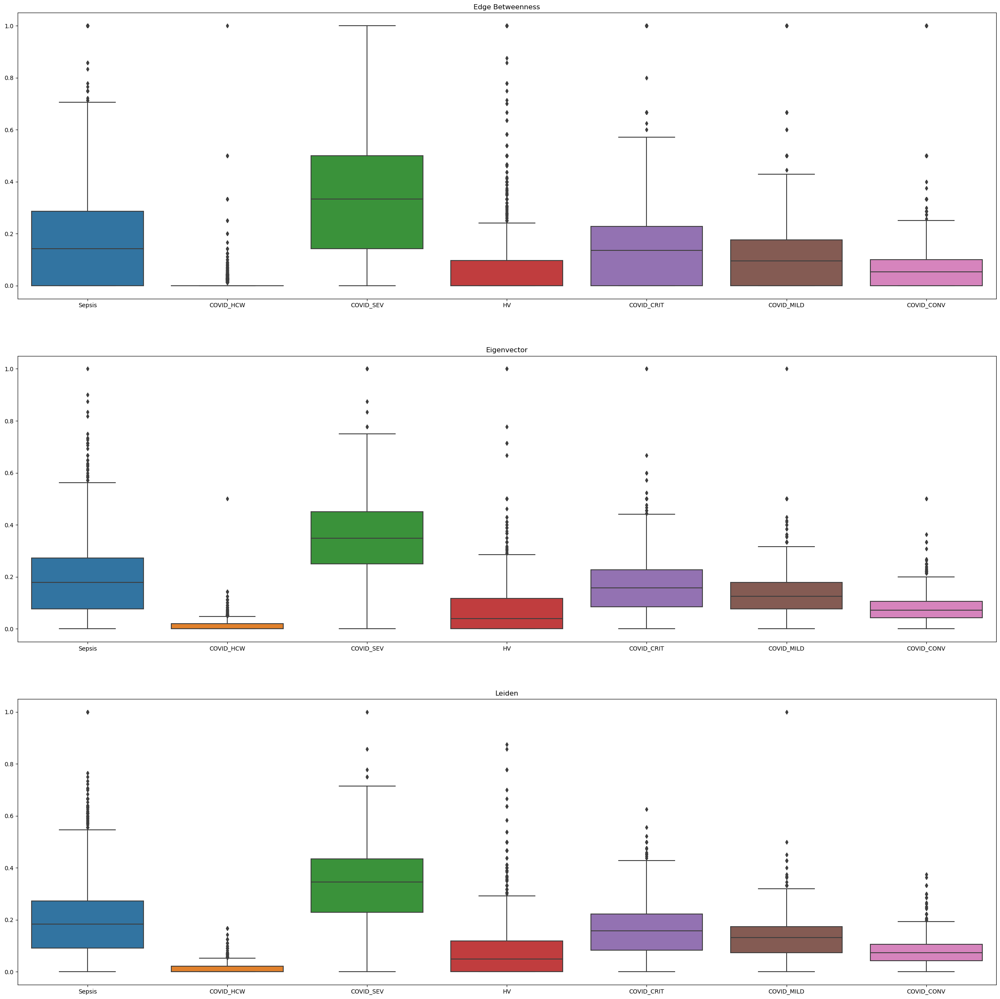

In [515]:
fig, ax = plt.subplots(3, figsize=(30,30))

eigenvector_corr = {d: [] for d in diseases}
edge_betweenness_corr = {d: [] for d in diseases}
leiden_corr = {d: [] for d in diseases}

for id in graphs_to_explore:
    coms = g_corr_summary["leiden"][id]["com_disease_distr_map"]
    for c in coms.values():
        for dg, pct in c.items():
            leiden_corr[dg].append(pct)

    coms = g_corr_summary["edge_betweenness"][id]["com_disease_distr_map"]
    for c in coms.values():
        for dg, pct in c.items():
            edge_betweenness_corr[dg].append(pct)

    coms = g_corr_summary["eigen_vector"][id]["com_disease_distr_map"]
    for c in coms.values():
        for dg, pct in c.items():
            eigenvector_corr[dg].append(pct)

sb.boxplot(data = pd.DataFrame(edge_betweenness_corr), ax = ax[0])
ax[0].set_title("Edge Betweenness")
sb.boxplot(data = pd.DataFrame(eigenvector_corr), ax = ax[1])
ax[1].set_title("Eigenvector")
sb.boxplot(data = pd.DataFrame(leiden_corr), ax = ax[2])
ax[2].set_title("Leiden")

### Distances

In [503]:
dist_summary_d = {"corr":{}, "5NN":{}}
for i, d1 in enumerate(diseases):
    for j in range(i, len(diseases)):
        d2 = diseases[j]
        dist_summary_d["corr"][d1+"--"+d2] = {g:800 for g in graphs_to_explore}
        dist_summary_d["5NN"][d1+"--"+d2] = {g:800 for g in graphs_to_explore}

dist_summary_dg = {"corr":{}, "5NN":{}}
for i, d1 in enumerate(disease_groups):
    for j in range(i, len(disease_groups)):
        d2 = disease_groups[j]
        dist_summary_dg["corr"][d1+"--"+d2] = {g:800 for g in graphs_to_explore}
        dist_summary_dg["5NN"][d1+"--"+d2] = {g:800 for g in graphs_to_explore}

inf_graphs_corr_d = []
inf_graphs_corr_dg = []
inf_graphs_5NN_d = []
inf_graphs_5NN_dg = []

In [504]:
for graph_id in graphs_to_explore:
    g_5NN = id_to_5NN[graph_id]
    g_corr = id_to_graph_per_node_5[graph_id]

    node_diseases = []
    node_disease_groups = []
    
    for i, v in enumerate(g_5NN.vs):
        node_diseases.append(v["disease"])
        node_disease_groups.append(v["disease_group"])

    dst_corr = np.array(g_corr.distances(source=g_corr.vs, target=g_corr.vs, weights=None, mode='all')).reshape(len(g_corr.vs), -1) 
    dst_5NN = np.array(g_5NN.distances(source=g_5NN.vs, target=g_5NN.vs, weights=None, mode='all')).reshape(len(g_5NN.vs), -1) 

    df_corr_d = pd.DataFrame(dst_corr, columns = node_diseases, index = node_diseases)
    df_corr_d.sort_index(inplace = True) # Sort the row names
    df_corr_d.sort_index(inplace = True, axis = 1) # Sort the column names
    
    df_corr_dg = pd.DataFrame(dst_corr, columns = node_disease_groups, index = node_disease_groups)
    df_corr_dg.sort_index(inplace = True) # Sort the row names
    df_corr_dg.sort_index(inplace = True, axis = 1) # Sort the column names


    df_5NN_d = pd.DataFrame(dst_5NN, columns = node_diseases, index = node_diseases)
    df_5NN_d.sort_index(inplace = True) # Sort the row names
    df_5NN_d.sort_index(inplace = True, axis = 1) # Sort the column names

    df_5NN_dg = pd.DataFrame(dst_5NN, columns = node_disease_groups, index = node_disease_groups)
    df_5NN_dg.sort_index(inplace = True) # Sort the row names
    df_5NN_dg.sort_index(inplace = True, axis = 1) # Sort the column names


    for i, d1 in enumerate(df_corr_d.columns.unique()):
        for j in range(i, len(df_corr_d.columns.unique())):
            d2 = df_corr_d.columns.unique()[j]
            key = d1+"--"+d2
            if key not in dist_summary_d["corr"].keys():
                key = d2+"--"+d1
            avg_dist_corr_d = df_corr_d.loc[d1, d2].mean().mean()
            avg_dist_5NN_d = df_5NN_d.loc[d1, d2].mean().mean()
            if str(avg_dist_corr_d) == "inf":
                dist_summary_d["corr"][key][graph_id]= 80000
                inf_graphs_corr_d.append(graph_id)
            else:
                dist_summary_d["corr"][key][graph_id]= avg_dist_corr_d
            if str(avg_dist_5NN_d) == "inf":
                dist_summary_d["5NN"][key][graph_id] = 80000
                inf_graphs_5NN_d.append(graph_id)
            else:
                dist_summary_d["5NN"][key][graph_id]= avg_dist_5NN_d

            avg_dist_corr_d = 800
            avg_dist_5NN_d = 800


    for i, d1 in enumerate(df_corr_dg.columns.unique()):
        for j in range(i, len(df_corr_dg.columns.unique())):
            d2 = df_corr_dg.columns.unique()[j]
            key = d1+"--"+d2
            if key not in dist_summary_d["corr"].keys():
                key = d2+"--"+d1
            avg_dist_corr_dg = df_corr_dg.loc[d1, d2].mean().mean()
            avg_dist_5NN_dg = df_5NN_dg.loc[d1, d2].mean().mean()
            if str(avg_dist_corr_dg) == "inf":
                dist_summary_dg["corr"][key][graph_id]= 80000
                inf_graphs_corr_dg.append(graph_id)
            else:
                dist_summary_dg["corr"][key][graph_id]= avg_dist_corr_dg
            if str(avg_dist_5NN_dg) == "inf":
                dist_summary_dg["5NN"][key][graph_id]= 80000
                inf_graphs_5NN_dg.append(graph_id)
            else:
                dist_summary_dg["5NN"][key][graph_id]= avg_dist_5NN_dg
                
            avg_dist_corr_dg = 800
            avg_dist_5NN_dg = 800

In [505]:
d_corr_dist_summary_data = {g:[] for g in graphs_to_explore}
d_5NN_dist_summary_data = {g:[] for g in graphs_to_explore}
dg_corr_dist_summary_data = {g:[] for g in graphs_to_explore}
dg_5NN_dist_summary_data = {g:[] for g in graphs_to_explore}
index_d = dist_summary_d["corr"].keys()
index_dg = dist_summary_dg["corr"].keys()

In [506]:
#create data frames
for k,v in dist_summary_dg["corr"].items():
    for g, dist in v.items():
        dg_corr_dist_summary_data[g].append(dist)

for k,v in dist_summary_dg["5NN"].items():
    for g, dist in v.items():
        dg_5NN_dist_summary_data[g].append(dist)

for k,v in dist_summary_d["corr"].items():
    for g, dist in v.items():
        d_corr_dist_summary_data[g].append(dist)

for k,v in dist_summary_d["5NN"].items():
    for g, dist in v.items():
        d_5NN_dist_summary_data[g].append(dist)



d_corr_dist_summary_df = pd.DataFrame(d_corr_dist_summary_data, index = index_d)
d_5NN_dist_summary_df = pd.DataFrame(d_5NN_dist_summary_data, index = index_d)
dg_corr_dist_summary_df = pd.DataFrame(dg_corr_dist_summary_data, index = index_dg)
dg_5NN_dist_summary_df = pd.DataFrame(dg_5NN_dist_summary_data, index = index_dg)

In [507]:
#Save data frames
d_corr_dist_summary_df.to_excel(os.path.join(tables,  "d_corr.xlsx"))
d_5NN_dist_summary_df.to_excel(os.path.join(tables,  "d_5NN.xlsx"))
dg_corr_dist_summary_df.to_excel(os.path.join(tables,  "dg_corr.xlsx"))
dg_5NN_dist_summary_df.to_excel(os.path.join(tables,  "dg_5NN.xlsx"))

In [508]:
cmap = sb.color_palette("Greys", as_cmap=True)
cmap.set_bad('red')
cmap.set_over("green")

upper_d_corr = np.array([i for i in d_corr_dist_summary_df.to_numpy().flatten() if i < 800 and not str(i) == "inf" ]).max()
lower_d_corr = np.array([i for i in d_corr_dist_summary_df.to_numpy().flatten() if i < 800 and not str(i) == "inf" ]).min()
mask_d_corr = np.array([i ==  800 for i in d_corr_dist_summary_df.to_numpy().flatten() ]).reshape(d_corr_dist_summary_df.shape)

upper_d_5NN = np.array([i for i in d_5NN_dist_summary_df.to_numpy().flatten() if i < 800 and not str(i) == "inf" ]).max()
lower_d_5NN = np.array([i for i in d_5NN_dist_summary_df.to_numpy().flatten() if i < 800 and not str(i) == "inf" ]).min()
mask_d_5NN = np.array([i ==  800 for i in d_5NN_dist_summary_df.to_numpy().flatten() ]).reshape(d_5NN_dist_summary_df.shape)

upper_dg_corr = np.array([i for i in dg_corr_dist_summary_df.to_numpy().flatten() if i < 800 and not str(i) == "inf" ]).max()
lower_dg_corr = np.array([i for i in dg_corr_dist_summary_df.to_numpy().flatten() if i < 800 and not str(i) == "inf" ]).min()
mask_dg_corr = np.array([i ==  800 for i in dg_corr_dist_summary_df.to_numpy().flatten() ]).reshape(dg_corr_dist_summary_df.shape)

upper_dg_5NN = np.array([i for i in dg_5NN_dist_summary_df.to_numpy().flatten() if i < 800 and not str(i) == "inf" ]).max()
lower_dg_5NN = np.array([i for i in dg_5NN_dist_summary_df.to_numpy().flatten() if i < 800 and not str(i) == "inf" ]).min()
mask_dg_5NN = np.array([i ==  800 for i in dg_5NN_dist_summary_df.to_numpy().flatten() ]).reshape(dg_5NN_dist_summary_df.shape)


In [509]:
# outliers to drop later
inf_graphs_corr_d = set(inf_graphs_corr_d + [g for g in d_corr_dist_summary_df.columns if any([i == 800 for i in d_corr_dist_summary_df.loc[:,g]])])
inf_graphs_corr_dg = set(inf_graphs_corr_dg + [g for g in dg_corr_dist_summary_df.columns if any([i == 800 for i in d_corr_dist_summary_df.loc[:,g]])])
inf_graphs_5NN_d = set(inf_graphs_5NN_d +  [g for g in d_5NN_dist_summary_df.columns if any([i == 800 for i in d_corr_dist_summary_df.loc[:,g]])])
inf_graphs_5NN_dg = set(inf_graphs_5NN_dg + [g for g in dg_5NN_dist_summary_df.columns if any([i == 800 for i in d_corr_dist_summary_df.loc[:,g]])])

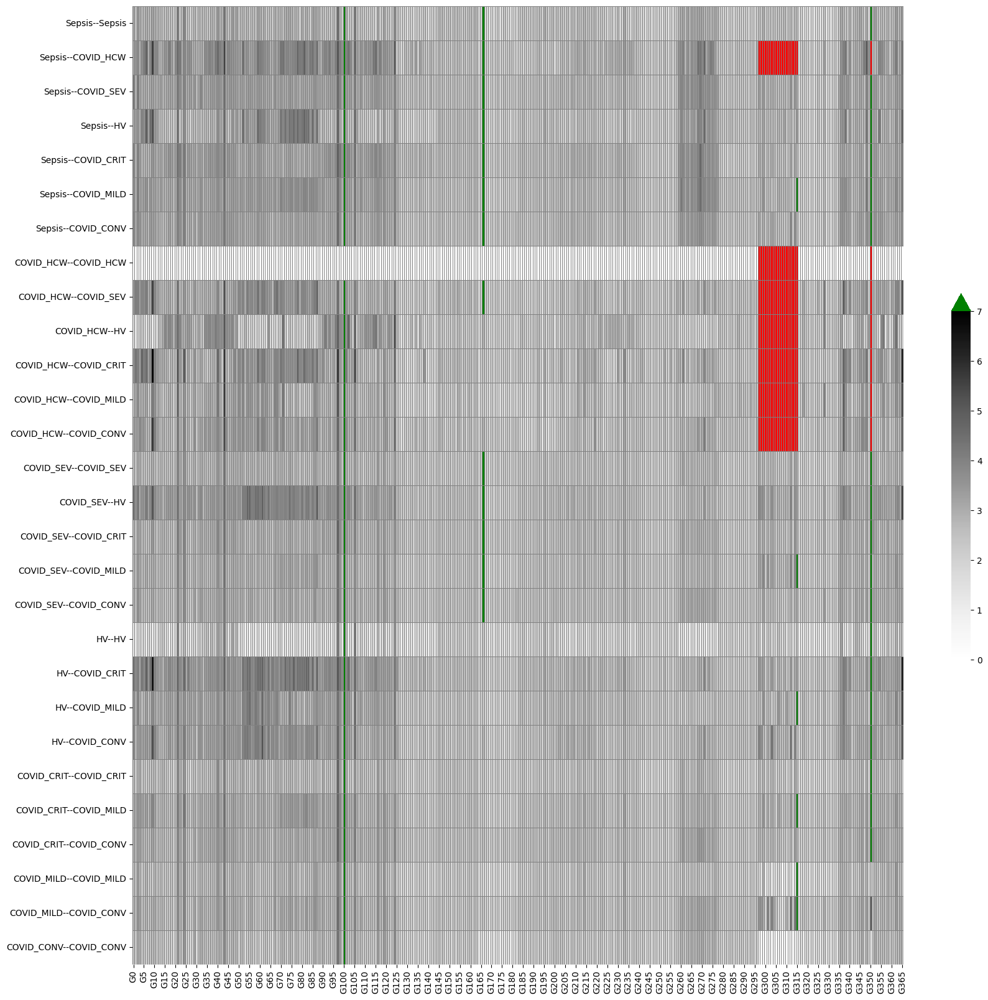

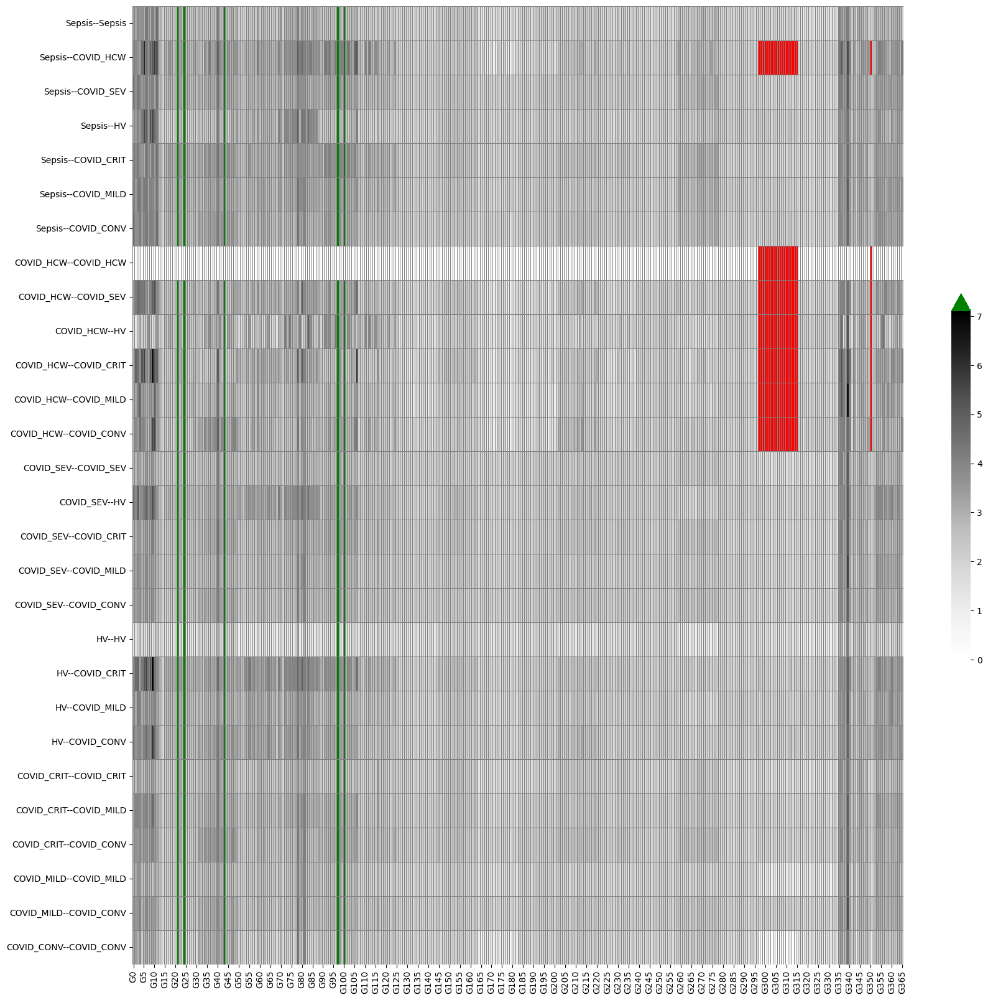

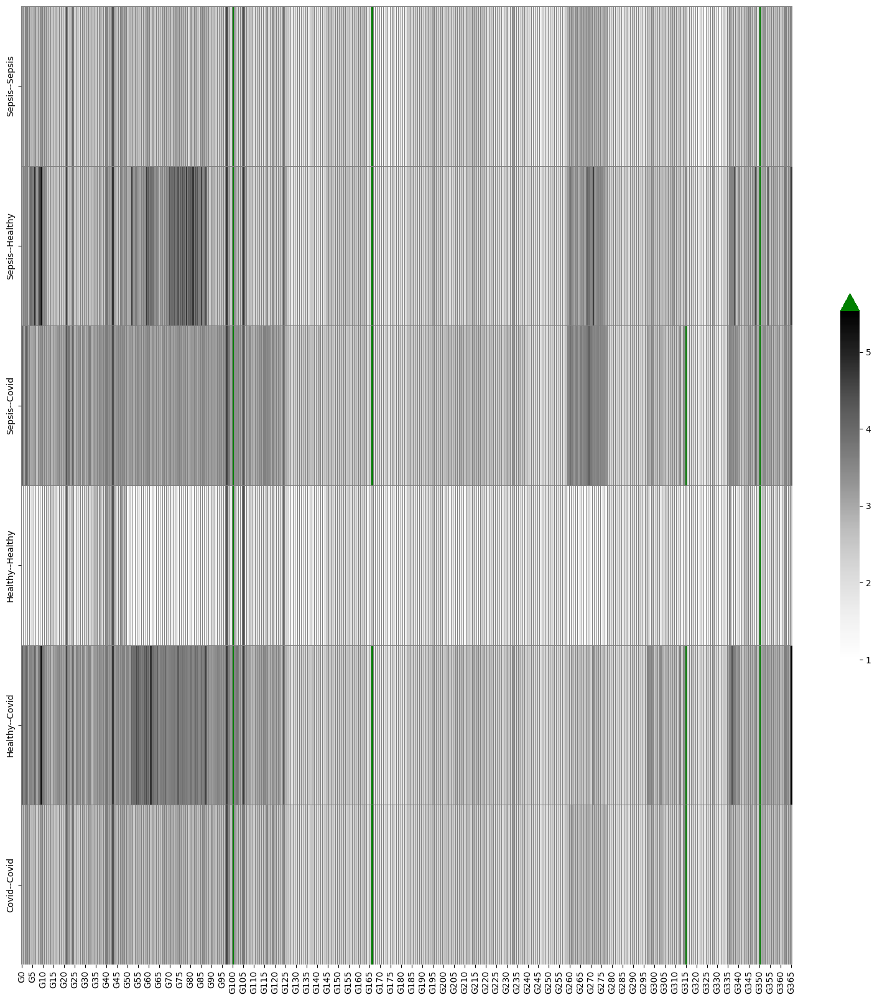

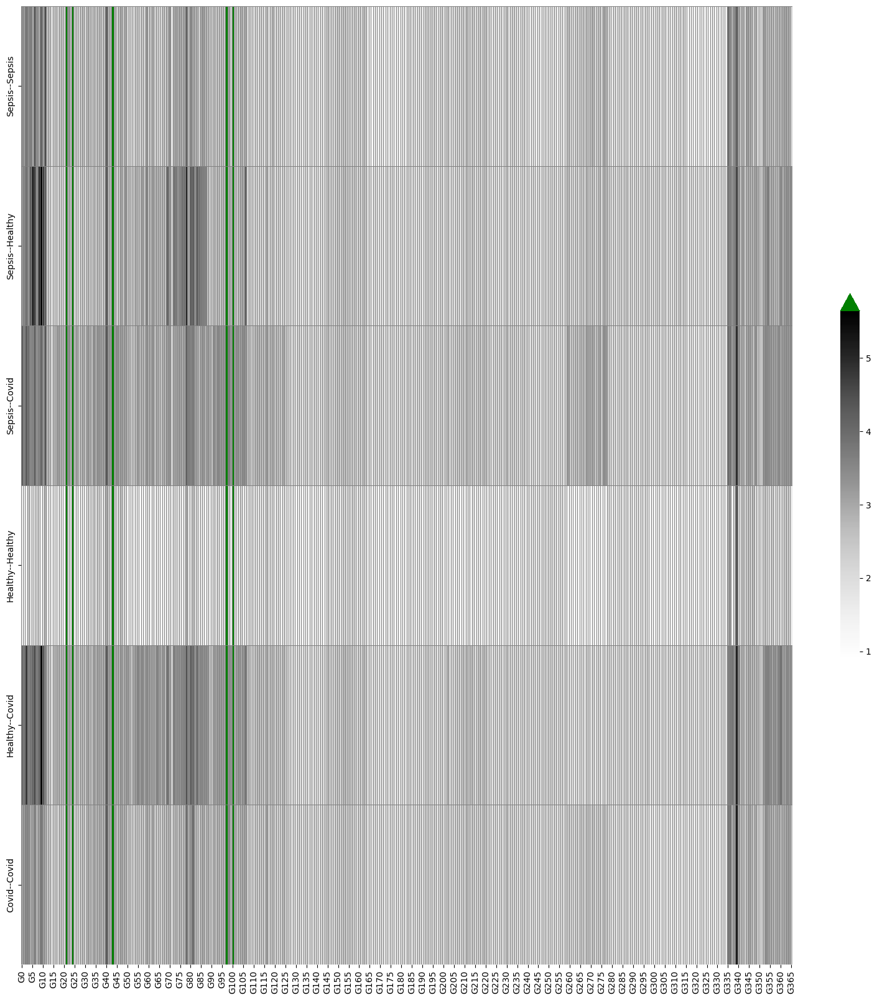

In [510]:
fig,ax=plt.subplots(figsize=(20,20))
sb.heatmap(d_corr_dist_summary_df, cmap =cmap, robust = False, linewidth=.5, linecolor = "grey", cbar_kws={"shrink": 0.4, "extend": "both" }, ax= ax, vmax=upper_d_corr, vmin=lower_d_corr, mask=mask_d_corr)
fig.savefig(os.path.join(plots, "dist_d_corr") )

fig,ax=plt.subplots(figsize=(20,20))
sb.heatmap(d_5NN_dist_summary_df, cmap =cmap, robust = False, linewidth=.5, linecolor = "grey", cbar_kws={"shrink": 0.4, "extend": "both"}, ax= ax, vmax=upper_d_5NN, vmin=lower_d_5NN, mask=mask_d_5NN)
fig.savefig(os.path.join(plots, "dist_d_5nn") )

fig,ax=plt.subplots(figsize=(20,20))
sb.heatmap(dg_corr_dist_summary_df, cmap =cmap, robust = False, linewidth=.5, linecolor = "grey", cbar_kws={"shrink": 0.4, "extend": "both"}, ax= ax, vmax=upper_dg_corr, vmin=lower_dg_corr, mask=mask_dg_corr)
fig.savefig(os.path.join(plots, "dist_dg_corr") )

fig,ax=plt.subplots(figsize=(20,20))
sb.heatmap(dg_5NN_dist_summary_df, cmap =cmap, robust = False, linewidth=.5, linecolor = "grey", cbar_kws={"shrink": 0.4, "extend": "both"}, ax= ax, vmax=upper_dg_5NN, vmin=lower_dg_5NN, mask=mask_dg_5NN)
fig.savefig(os.path.join(plots, "dist_dg_5NN") )

Text(0.5, 1.0, '5NN disease group')

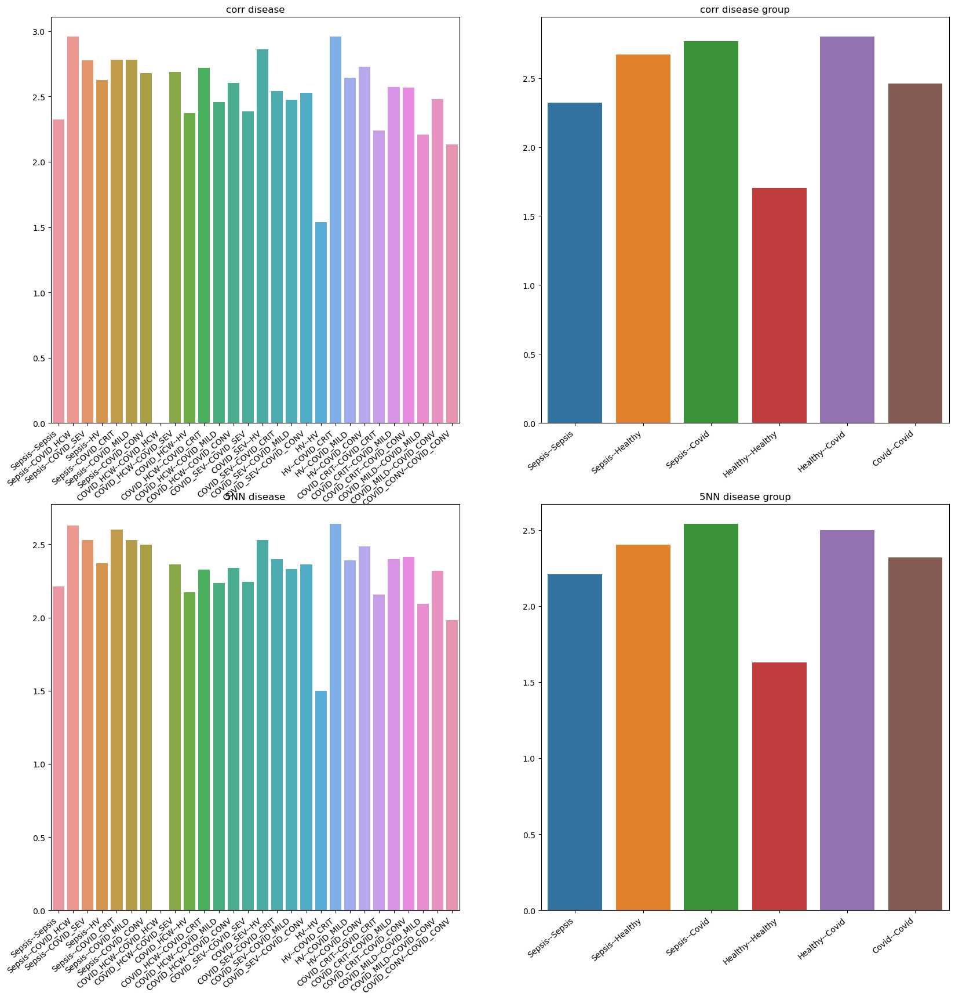

In [511]:
fig,ax=plt.subplots(2,2, figsize=(20,20)) 
sb.barplot( x =list( d_corr_dist_summary_df.drop(inf_graphs_corr_d, axis = 1).mean(axis = 1).keys()), y = list(d_corr_dist_summary_df.drop(inf_graphs_corr_d, axis = 1).mean(axis = 1)), ax = ax[0,0])
ax[0,0].set_xticklabels(ax[0,0].get_xticklabels(), rotation=40, ha="right")
ax[0,0].set_title("corr disease")

sb.barplot( x =list( dg_corr_dist_summary_df.drop(inf_graphs_corr_dg, axis = 1).mean(axis = 1).keys()), y = list(dg_corr_dist_summary_df.drop(inf_graphs_corr_dg, axis = 1).mean(axis = 1)), ax = ax[0,1])
ax[0,1].set_xticklabels(ax[0,1].get_xticklabels(), rotation=40, ha="right")
ax[0,1].set_title("corr disease group")

sb.barplot( x =list( d_5NN_dist_summary_df.drop(inf_graphs_5NN_d, axis = 1).mean(axis = 1).keys()), y = list(d_5NN_dist_summary_df.drop(inf_graphs_5NN_d, axis = 1).mean(axis = 1)), ax = ax[1,0])
ax[1,0].set_xticklabels(ax[1,0].get_xticklabels(), rotation=40, ha="right")
ax[1,0].set_title("5NN disease")

sb.barplot( x =list( dg_5NN_dist_summary_df.drop(inf_graphs_5NN_dg, axis = 1).mean(axis = 1).keys()), y = list(dg_5NN_dist_summary_df.drop(inf_graphs_5NN_dg, axis = 1).mean(axis = 1)), ax = ax[1,1])
ax[1,1].set_xticklabels(ax[1,1].get_xticklabels(), rotation=40, ha="right")
ax[1,1].set_title("5NN disease group")

In [512]:
same_diseases = []
for i in diseases:
    same_diseases.append(i + "--" + i)

different_diseases = list(set(d_5NN_dist_summary_df.index).difference(same_diseases))


same_disease_groups = []
for i in disease_groups:
    same_disease_groups.append(i + "--" + i)

different_disease_groups = list(set(dg_corr_dist_summary_df.index).difference(same_disease_groups))

In [513]:
print("min:", dg_5NN_dist_summary_df.drop(inf_graphs_5NN_dg, axis = 1).mean(axis = 1)[same_disease_groups].min())
print("max:", dg_5NN_dist_summary_df.drop(inf_graphs_5NN_dg, axis = 1).mean(axis = 1)[same_disease_groups].max())


print("min:", dg_corr_dist_summary_df.drop(inf_graphs_corr_dg, axis = 1).mean(axis = 1)[same_disease_groups].min())
print("max:", dg_corr_dist_summary_df.drop(inf_graphs_corr_dg, axis = 1).mean(axis = 1)[same_disease_groups].max())

min: 1.6281307977736543
max: 2.3171928443811227
min: 1.7056109265411605
max: 2.4617255776741573


In [282]:
print("min:", dg_5NN_dist_summary_df.drop(inf_graphs_5NN_dg, axis = 1).mean(axis = 1)[different_disease_groups].min())
print("max:", dg_5NN_dist_summary_df.drop(inf_graphs_5NN_dg, axis = 1).mean(axis = 1)[different_disease_groups].max())


print("min:", dg_corr_dist_summary_df.drop(inf_graphs_corr_dg, axis = 1).mean(axis = 1)[different_disease_groups].min())
print("max:", dg_corr_dist_summary_df.drop(inf_graphs_corr_dg, axis = 1).mean(axis = 1)[different_disease_groups].max())

min: 2.401824642980359
max: 2.5410333881962868
min: 2.668624121765952
max: 2.801782954130088


In [283]:
print("min:", d_5NN_dist_summary_df.drop(inf_graphs_5NN_d, axis = 1).mean(axis = 1)[same_diseases].min())
print("max:", d_5NN_dist_summary_df.drop(inf_graphs_5NN_d, axis = 1).mean(axis = 1)[same_diseases].max())


print("min:", d_corr_dist_summary_df.drop(inf_graphs_corr_d, axis = 1).mean(axis = 1)[same_diseases].min())
print("max:", d_corr_dist_summary_df.drop(inf_graphs_corr_d, axis = 1).mean(axis = 1)[same_diseases].max())

min: 0.0
max: 2.24367790910567
min: 0.0
max: 2.3876475202385703


In [286]:
d_corr_dist_summary_df.drop(inf_graphs_corr_d, axis = 1).mean(axis = 1)[same_diseases]

Sepsis--Sepsis            2.323523
COVID_HCW--COVID_HCW      0.000000
COVID_SEV--COVID_SEV      2.387648
HV--HV                    1.538897
COVID_CRIT--COVID_CRIT    2.237130
COVID_MILD--COVID_MILD    2.206563
COVID_CONV--COVID_CONV    2.133067
dtype: float64

In [284]:
print("min:", d_5NN_dist_summary_df.drop(inf_graphs_5NN_d, axis = 1).mean(axis = 1)[different_diseases].min())
print("max:", d_5NN_dist_summary_df.drop(inf_graphs_5NN_d, axis = 1).mean(axis = 1)[different_diseases].max())


print("min:", d_corr_dist_summary_df.drop(inf_graphs_corr_d, axis = 1).mean(axis = 1)[different_diseases].min())
print("max:", d_corr_dist_summary_df.drop(inf_graphs_corr_d, axis = 1).mean(axis = 1)[different_diseases].max())

min: 2.1707024158637056
max: 2.6409038681266934
min: 2.371248615725361
max: 2.9595770769548135
